<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>Исследование поведения аудитории: 3. </h1> 
<hr style='border:2px solid #460073'> </hr>
<h3 style='color: #460073'>Автор: </h3> 

* Бессонов Евгений  
* [Адрес в телеграмм](https://t.me/EMskv "t.me/EMskv")  
* [Портфолио с JupiterNotebook проекта](https://github.com/evgeniy-yandex/Data_Science "github")
    
<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>Описание проекта. </h1> 
<hr style='border:2px solid #460073'> </hr>
<h3 style='color: #460073'>Описание данных. </h3> 

Для работы получены файл `Daily_Reach_OTS.xlsx`

Предоставленные массивы данных об отдельных аудиториях диджитал-ресурсов среди населения России в возрасте 12 лет и старше в динамике за 3 месяца. Содержаться как общие показатели среди населения, так и в разбивке на возрастные группы и устройство контакта - Web Desktop (ПК и ноутбуки), App Mobile (Мобильное приложение), Web Mobile (Мобильный браузер).
Все файлы содержат идентичный набор ресурсов за один и тот же период.

<h3 style='color: #460073'>Описание метрик в файлах: </h3> 

|<!-- -->|<!-- -->|  
|:------:|:-------|
|ADR|Average Daily Reach|
| |Рассчитывается как среднее арифметическое Reach каждого из дней, входящих в заданный период.  Даже если данные по медиа объекту отсутствуют в части дней из отобранного периода, среднее арифметическое рассчитывается по всем дням, а не по тем, где были данные.|
|OTS|Opportunity To See|
| |Общее количество загрузок страниц/ открытий приложений медиа объекта за указанный период в рамках заданной соц.-дем. группы.|
<h3 style='color: #460073'>Задача на проект 3. </h3> 

Провести анализ EDA данных из файла `Daily_Reach_OTS` с метриками `ADR` и `OTS`:  
1. Описать, какие основные тренды видите.
2. Какие особенности в структуре и поведении аудитории ресурсов?
3. Какие причины изменений показателей динамики для конкретного ресурса?

<h3 style='color: #460073'>План работы. </h3> 

1. Импорт библиотек.
2. Загрузка файлов с данными `Daily_Reach_OTS`
3. Изучение датасетов и проведение первичной обработки данных.
    * Размеры датасетов.
    * Сущность признаков.
    * Типы данных.
    * Наличие/отсутствие дубликатов.
    * Наличие/отсутствие пропусков данных.
4. Проведение EDA анализа. 
    * Приведение к формату 'datetime' данных со значениями времени.
    * Выполнение для выбранных источников информации по каждой из шести возрастных групп:
        * `до 12 лет`, 
        * `от 12 до 24 лет`, 
        * `от 24 до 34 лет`,
        * `от 34 до 44 лет`,
        * `от 44 до 54 лет`,
        * `от 55 лет`   
        следующих работ:
        * Графическое представление.
        * Анализ на наличие трендов и сезонности.
        * Оценка стационарности временного ряда. Тест Дики-Фуллера (Dickey-Fuller test).
    * (`примечание`. Для суммарных, по всем возрастных категорий пользователей анализ проводить не будем. Проведем сравнение по возрастным группам).
5. Оформление итоговых выводов.  

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>1. Импорт библиотек. </h1> 
<hr style='border:2px solid #460073'> </hr>

In [1]:
# Все import соберем в начале проекта:

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import os
import seaborn as sns
import re

from skimpy import skim, clean_columns
from datetime import datetime
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import datetime, timedelta

# Размер окна для проверки стационарности временного ряда
WINDOW_STATIONARITY = 7

# Настроим вид таблиц:
pd.set_option("display.max_rows", 50)
pd.set_option("display.max_columns", 50)

# Настроим, чтобы числа в датасетах отражались без знаков после запятой
pd.set_option('display.float_format', '{:.0f}'.format) 

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>2. Загрузка файлов с данными.</h1> 
<hr style='border:2px solid #460073'> </hr>

Изучил файл `Daily_Reach_OTS.xlsx` и привёл его к формату `csv`:

In [2]:
# Вспомогательная функция для чтения файлов с данными
def load_dataset(file_name, separator):
    '''
    Функция для проверки нахождения файла и загрузки датафрейма.
    '''
    if os.path.exists(file_name):
        data = pd.read_csv(file_name, sep = separator)
        print('Dataset "', file_name, '" is loaded successfully.', sep='')
        return data
    else:
        print('Something with', file_name, 'is wrong!')

In [3]:
# Загрузка данных по фактическому включению/выключению пиплметра         
df_dro_full = load_dataset('Daily_Reach_OTS_total.csv', ';')

Dataset "Daily_Reach_OTS_total.csv" is loaded successfully.


<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>3. Изучение датасета и проведение первичной обработки данных.</h1> 
<hr style='border:2px solid #460073'> </hr>

Создаю вспомогательную функцию для изучения датафреймов.

In [4]:
def view_skim_df(df):
    '''
    Функция для единообразного изучения датафреймов.
    1. Контроль размера датафрейма.
    2. Вывод основных данных по датафрейму.
    3. Распечатка на экране первых трёх объектов датафрейма.
    '''
    skim(df)
    display(df.head(3))
    print('Количество дубликатов:', df.duplicated().sum())    
    print('Полное количество пропущенных значений по всем признакам:', 
          df.isnull().sum().sum())
    
    return

In [5]:
# Изучим содержимое датафрейма:
view_skim_df(df_dro_full)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 516    │ │ string      │ 151   │                                                          │
│ │ Number of columns │ 152    │ │ int32       │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━┓  │
│ ┃ column_name          ┃ NA    ┃ NA %     ┃ mean     ┃ sd    ┃ p0    ┃ p25    ┃ p75    ┃ p100    ┃ hist      ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━┩  │
│ │ age                  │     0 │        0 │       29 │    19 │     0 │     12 │     45 │      55 │  ██████   │  │
│ └──────────────────────┴───────┴──────────┴──────────┴───────┴───────┴────────┴────────┴─────────┴───────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                           ┃ NA    ┃ NA %      ┃ words per row            ┃ total words         ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ Date                                  │     0 │         0 │                        1 │                 520 │  │
│ │ 2gis Web Desktop ADR                  │     0 │         0 │                        1 │                 520 │  │
│ │ 2gis Web Desktop OTS                  │     0 │         0 │                        1 │                 520 │  │
│ │ 2 gis App Mobile ADR                  │     0 │         0 │                        1 │                 520 │  │
│ │ 2gis App Mobile OTS                   │     0 │         0 │                        1 │                 520 │  │
│ │ 2gis Web Mobile ADR                   │     0 │         0 │                        1 │                 520 │  │
│ │ 2gis Web Mobile OTS                   │     0 │         0 │                        1 │                 520 │  │
│ │ Discord Web Desktop                   │     0 │         0 │                        1 │                 520 │  │
│ │ Discord Web Desktop                   │     0 │         0 │                        1 │                 520 │  │
│ │ Discord App Mobile A                  │     0 │         0 │                        1 │                 520 │  │
│ │ Discord App Mobile O                  │     0 │         0 │                        1 │                 520 │  │
│ │ Discord Web Mobile A                  │     0 │         0 │                        1 │                 520 │  │
│ │ Discord Web Mobile                    │     0 │         0 │                        1 │                 520 │  │
│ │ Facebook Web Desktop                  │     0 │         0 │                        1 │                 520 │  │
│ │ Facebook Web Desktop                  │     0 │         0 │                        1 │                 520 │  │
│ │ Facebook App Mobile                   │     0 │         0 │                        1 │                 520 │  │
│ │ Facebook App Mobile                   │     0 │     

,Date,2gis Web Desktop ADR,2gis Web Desktop OTS,2 gis App Mobile ADR,2gis App Mobile OTS,2gis Web Mobile ADR,2gis Web Mobile OTS,Discord Web Desktop ADR,Discord Web Desktop OTS,Discord App Mobile ADR,Discord App Mobile OTS,Discord Web Mobile ADR,Discord Web Mobile OTS,Facebook Web Desktop ADR,Facebook Web Desktop OTS,Facebook App Mobile ADR,Facebook App Mobile OTS,Facebook Web Mobile ADR,Facebook Web Mobile OTS,Google Карты Web Desktop ADR,Google Карты Web Desktop OTS,Google Карты App Mobile ADR,Google Карты App Mobile OTS,Google Карты Web Mobile ADR,Google Карты Web Mobile OTS,...,Лента: Lenta Web Desktop ADR,Лента: Lenta Web Desktop OTS,Лента: Lenta App Mobile ADR,Лента: Lenta App Mobile OTS,Лента: Lenta Web Mobile ADR,Лента: Lenta Web Mobile OTS,Яндекс.Картинки Web Desktop ADR,Яндекс.Картинки Web Desktop OTS,Яндекс.Картинки App Mobile ADR,Яндекс.Картинки App Mobile OTS,Яндекс.Картинки Web Mobile ADR,Unnamed: 138,Яндекс.Карты Web Desktop ADR,Яндекс.Карты Web Desktop OTS,Яндекс.Карты App Mobile ADR,Яндекс.Карты App Mobile OTS,Яндекс.Карты Web Mobile ADR,Яндекс.Карты Web Mobile OTS,Яндекс.Новости Web Desktop ADR,Яндекс.Новости Web Desktop OTS,Яндекс.Новости App Mobile ADR,Яндекс.Новости App Mobile OTS,Яндекс.Новости Web Mobile ADR,Яндекс.Новости Web Mobile OTS,age
0,01.04.2023,342 700,6 001 700,4 202 800,18 459 400,508 300,3 090 200,356 300,6 981 600,2 473 900,22 467 600,194 700,806 700,176 200,2 429 500,912 100,3 793 300,849 100,3 479 600,314 000,12 908 500,3 133 300,10 567 400,99 600,873 000,...,81 700,812 300,773 500,1 749 900,188 800,895 400,3 518 900,84 999 100,NULL,NULL,2 575 700,37 545 400,1 208 200,37 678 300,7 296 100,35 111 800,503 400,10 393 700,3 200,3 200,NULL,NULL,NULL,NULL,0
1,02.04.2023,336 600,4 934 100,3 991 600,16 626 300,483 800,3 513 800,390 500,7 053 900,2 657 300,26 413 000,115 100,247 000,184 200,3 649 100,786 100,3 105 800,846 500,2 112 200,278 500,12 065 600,2 873 700,8 038 400,85 000,465 700,...,103 300,1 112 500,859 500,2 012 400,174 400,853 100,4 052 800,103 989 100,NULL,NULL,2 413 800,36 294 100,1 262 700,32 853 000,6 726 200,29 251 100,424 700,9 533 000,2 500,2 500,NULL,NULL,20 200,23 000,0
2,03.04.2023,564 000,8 679 700,4 486 600,18 359 400,615 400,4 214 800,250 200,3 152 100,2 390 500,21 673 900,146 200,390 700,213 300,2 885 400,948 700,2 762 800,802 700,1 370 100,421 200,16 549 500,3 138 700,9 651 600,83 100,946 600,...,57 600,607 000,945 300,2 174 100,167 700,681 200,4 198 400,100 130 300,NULL,NULL,2 514 100,36 161 900,1 862 100,54 262 200,8 041 000,42 243 400,436 200,11 712 100,NULL,NULL,NULL,NULL,4 800,8 600,0


Количество дубликатов: 0
Полное количество пропущенных значений по всем признакам: 0


Сформируем список признаков:
* **В связи с большим количеством источников информации об аудитории диджитал-ресурсов среди населения России и с связи с демонстрационной целью данной работы, ограничимся ТРЕМЯ источниками информации**. 
* Выберем для работы следующие 3 источника: **'Telegram', 'ВКонтакте', 'Дзен'**. Остальные признаки удалим. 
* Выбор сделал по источникам, с которыми еще на работал в проектах 1 и 2.

Для удобства работы упакуем имена признаков к словарь.

In [6]:
list_of_keys = ['Telegram', 'ВКонтакте', 'Дзен']
dict_columns = {}

list_columns = df_dro_full.columns[1:-1]# Убрали Date и age
for num in range(0, len(list_columns), 6):
    key_dict = list_columns[num].split()[0]
    if key_dict in list_of_keys:
        list_3col = []
        for i in range(6):
            list_3col.append(" ".join(list_columns[num+i].split()[1:]))
        dict_columns[key_dict] = list_3col
        
dict_columns    

{'Telegram': ['Web Desktop ADR',
  'Web Desktop OTS',
  'App Mobile ADR',
  'App Mobile OTS',
  'Web Mobile ADR',
  'Web Mobile OTS'],
 'ВКонтакте': ['Web Desktop ADR',
  'Web Desktop OTS',
  'App Mobile ADR',
  'App Mobile OTS',
  'Web Mobile ADR',
  'Web Mobile OTS'],
 'Дзен': ['Web Desktop ADR',
  'Web Desktop OTS',
  'App Mobile ADR',
  'App Mobile OTS',
  'Web Mobile ADR',
  'Web Mobile OTS']}

In [7]:
list_features = []
list_features.append('Date')
for key, val in dict_columns.items():
    for v in val:
        list_features.append(key+' '+v)
list_features.append('age')
df_dro = df_dro_full[list_features]
df_dro.head(3)

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
0,01.04.2023,1 106 100,7 528 100,48 002 300,874 501 000,130 900,1 156 200,10 189 900,408 502 300,46 387 900,653 767 100,12 212 000,101 074 900,6 748 000,71 520 200,1 488 800,7 057 000,25 731 400,374 240 500,0
1,02.04.2023,1 226 100,7 346 200,48 408 700,866 000 700,220 100,491 400,11 070 600,453 913 400,45 513 200,618 330 800,11 236 900,90 903 700,7 289 900,71 918 700,1 626 100,8 244 900,26 125 100,385 715 000,0
2,03.04.2023,1 490 700,11 033 500,50 368 300,1 003 258 000,214 000,608 400,11 878 800,536 431 100,46 211 900,703 643 700,12 097 600,105 367 000,7 845 400,90 200 000,1 525 100,8 607 200,27 002 500,393 412 700,0


**Отмечаем**:
* Количество записей 516.
* Количество признаков равно 152. Из них все, кроме `age` имеют тип string. Необходимы преобразования типов:
    * Признак `Date` перевести в тип *datetime*.
    * Остальные признаки перевести в тип *float*.
* Все данные разбиты на возрастные группы:
    * до 12 лет,
    * 12 - 24 года,
    * 25 - 34 года, 
    * 35 - 44 года,
    * 45 - 54 года,
    * от 55 и старше.
* Дубликатов нет. 
* Пропуски данных заменены нв NULL.
* В связи с большим количеством источников информации об аудитории диджитал-ресурсов среди населения России и с связи с демонстрационой целью данной работы, **ограничился ТРЕМЯ ресурсами**. Остальные признаки удалил.

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>4. EDA анализ.</h1> 
<hr style='border:2px solid #460073'> </hr>

## 4.1. Коррекция типов 'oblect' признаков.


### 4.1.1. Приведение к формату 'datetime' признака `Date`.

Преобразуем даты из формата 'string' в формат 'datetime'

In [8]:
# Уберём пробелы в начале и в конце признака 'Data':
df_dro['Date'] = df_dro['Date'].replace(r"^ +| +$", r"", regex=True)

df_dro['Date'] = pd.to_datetime(df_dro.Date, format='%d.%m.%Y')
df_dro.info()
print('Для проведения исследования данные собраны в период с',
    df_dro.Date.min(), 'по ', df_dro.Date.max())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 516 entries, 0 to 515
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       516 non-null    datetime64[ns]
 1   Telegram Web Desktop ADR   516 non-null    object        
 2   Telegram Web Desktop OTS   516 non-null    object        
 3   Telegram App Mobile ADR    516 non-null    object        
 4   Telegram App Mobile OTS    516 non-null    object        
 5   Telegram Web Mobile ADR    516 non-null    object        
 6   Telegram Web Mobile OTS    516 non-null    object        
 7   ВКонтакте Web Desktop ADR  516 non-null    object        
 8   ВКонтакте Web Desktop OTS  516 non-null    object        
 9   ВКонтакте App Mobile ADR   516 non-null    object        
 10  ВКонтакте App Mobile OTS   516 non-null    object        
 11  ВКонтакте Web Mobile ADR   516 non-null    object        
 12  ВКонтакт

### 4.1.2. Приведение к формату 'float' признаков с данными.

In [9]:
list_features = df_dro.columns[1:-1] # Сразу уберём Date и age.
list_features

Index(['Telegram Web Desktop ADR', 'Telegram Web Desktop OTS',
       'Telegram App Mobile ADR', 'Telegram App Mobile OTS',
       'Telegram Web Mobile ADR', 'Telegram Web Mobile OTS',
       'ВКонтакте Web Desktop ADR', 'ВКонтакте Web Desktop OTS',
       'ВКонтакте App Mobile ADR', 'ВКонтакте App Mobile OTS',
       'ВКонтакте Web Mobile ADR', 'ВКонтакте Web Mobile OTS',
       'Дзен Web Desktop ADR', 'Дзен Web Desktop OTS', 'Дзен App Mobile ADR',
       'Дзен App Mobile OTS', 'Дзен Web Mobile ADR', 'Дзен Web Mobile OTS'],
      dtype='object')

In [10]:
# Уберём пробелы в начале и в конце информационных признаках:
df_dro[list_features] = df_dro[list_features].replace(r"^ +| +$", r"", regex=True)
# Уберём пробелы в середине признаков':
df_dro[list_features] = df_dro[list_features].replace(r'\s+', '', regex=True)
# df_dro[list_features] = df_dro[list_features].str.strip().replace(r'\s+',' ', regex=True)

fea_object_float = {}
for fea in list_features:
    fea_object_float[fea] = 'float'
    
df_dro = df_dro.astype(fea_object_float)
view_skim_df(df_dro)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 516    │ │ float64     │ 18    │                                                          │
│ │ Number of columns │ 20     │ │ datetime64  │ 1     │                                                          │
│ └───────────────────┴────────┘ │ int32       │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name    ┃ NA ┃ NA % ┃ mean      ┃ sd        ┃ p0       ┃ p25      ┃ p75       ┃ p100       ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━┩  │
│ │ Telegram Web   │  0 │    0 │    470000 │    470000 │    56000 │   150000 │    660000 │    1900000 │ █▁▁▁▁  │  │
│ │ Desktop        │    │      │           │           │          │          │           │            │        │  │
│ │ Telegram Web   │  0 │    0 │   3700000 │   3600000 │   210000 │  1000000 │   4200000 │   15000000 │ █▅▁▁▁▁ │  │
│ │ Desktop        │    │      │           │           │          │          │           │            │        │  │
│ │ Telegram App   │  0 │    0 │  17000000 │  15000000 │  7100000 │  8500000 │  13000000 │   55000000 │ █    ▂ │  │
│ │ Mobile         │    │      │           │           │          │          │           │            │        │  │
│ │ Telegram App   │  0 │    0 │ 320000000 │ 320000000 │ 66000000 │ 97000000 │ 450000000 │ 1400000000 │ █▂ ▁▁  │  │
│ │ Mobile         │    │      │           │           │          │          │           │            │        │  │
│ │ Telegram Web   │  0 │    0 │     56000 │     57000 │      700 │    22000 │     60000 │     320000 │  █▁▁▁  │  │
│ │ Mobile         │    │      │           │           │          │          │           │            │        │  │
│ │ Telegram Web   │  0 │    0 │    260000 │    710000 │     3800 │    57000 │    240000 │   13000000 │   █    │  │
│ │ Mobile         │    │      │           │           │          │          │           │            │        │  │
│ │ ВКонтакте Web  │  0 │    0 │   3500000 │   3300000 │  1100000 │  1600000 │   3500000 │   12000000 │ █▂  ▁▁ │  │
│ │ Deskto         │    │      │           │           │          │          │           │            │        │  │
│ │ ВКонтакте Web  │  0 │    0 │ 140000000 │ 140000000 │ 23000000 │ 48000000 │ 170000000 │  540000000 │ █▂  ▁▁ │  │
│ │ Deskto         │    │      │           │           │          │          │           │            │        │  │
│ │ ВКонтакте App  │  0 │    0 │  15000000 │  14000000 │  5300000 │  6500000 │  12000000 │   47000000 │ █    ▂ │  │
│ │ Mobile         │    │      │           │           │          │          │           │            │        │  │
│ │ ВКонтакте App  │  0 │    0 │ 220000000 │ 210000000 │ 42000000 │ 63000000 │ 260000000 │  720000000 │ █▄▁  ▂ │  │
│ │ Mobile         │    │      │           │           │          │          │           │            │        │  │
│ │ ВКонтакте Web  │  0 │    0 │   3700000 │   3400000 │  1300000 │  1800000 │   2800000 │   12000000 │ █    ▁ │  │
│ │ Mobile         │    │      │           │           │

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
0,2023-04-01,1106100,7528100,48002300,874501000,130900,1156200,10189900,408502300,46387900,653767100,12212000,101074900,6748000,71520200,1488800,7057000,25731400,374240500,0
1,2023-04-02,1226100,7346200,48408700,866000700,220100,491400,11070600,453913400,45513200,618330800,11236900,90903700,7289900,71918700,1626100,8244900,26125100,385715000,0
2,2023-04-03,1490700,11033500,50368300,1003258000,214000,608400,11878800,536431100,46211900,703643700,12097600,105367000,7845400,90200000,1525100,8607200,27002500,393412700,0


Количество дубликатов: 0
Полное количество пропущенных значений по всем признакам: 0


## 4.2. Отсортируем данные в хронологическом порядке.

In [11]:
df_dro = df_dro.sort_values(by=['Date', 'age'])
df_dro.head(7)

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
0,2023-04-01,1106100,7528100,48002300,874501000,130900,1156200,10189900,408502300,46387900,653767100,12212000,101074900,6748000,71520200,1488800,7057000,25731400,374240500,0
86,2023-04-01,528600,2585000,12720400,418588100,46800,548900,3193500,181822300,11942700,265913900,3040800,18875000,516600,920100,51300,123100,3184900,26344000,12
172,2023-04-01,193700,1580700,9500400,152031300,13800,142800,2158300,86720800,11254700,169693700,2760800,25939400,814300,5594400,121200,420500,4145600,38556800,25
258,2023-04-01,174100,2125100,10720000,146072600,27600,125600,1729300,58916700,10485100,109884600,2651400,29713000,1284300,13998800,240600,1469400,5718700,73913900,35
344,2023-04-01,106100,808700,7151500,85224000,27700,277300,1368200,42561700,6481300,60018000,1588500,13024200,1383400,13333300,292600,1271900,4815500,74602000,45
430,2023-04-01,103600,428600,7910000,72585000,15000,61600,1740600,38480800,6224100,48256900,2170500,13523300,2749400,37673600,783100,3772100,7866700,160823800,55
1,2023-04-02,1226100,7346200,48408700,866000700,220100,491400,11070600,453913400,45513200,618330800,11236900,90903700,7289900,71918700,1626100,8244900,26125100,385715000,0


Видим, что сначала идут данные от 1 апреля, и затем уже 2 апреля. Сортировка выполнилась.

## 4.3. Анализ `ADR` и `OTS` по возрастной категории 'до 12 лет'.

Выделим из полного датафрейма, по всем возрастным группам, те записи, которые соответствуют выбранной возрастной группе.

In [12]:
print("Размер полного датафрейма:", df_dro.shape)

df_dro_0 = df_dro[df_dro.age == 0]
if (df_dro.shape[0] / 6 == df_dro_0.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'до 12 лет':", 
      df_dro_0.shape)
df_dro_0.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'до 12 лет': (86, 20)


,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
0,2023-04-01,1106100,7528100,48002300,874501000,130900,1156200,10189900,408502300,46387900,653767100,12212000,101074900,6748000,71520200,1488800,7057000,25731400,374240500,0
1,2023-04-02,1226100,7346200,48408700,866000700,220100,491400,11070600,453913400,45513200,618330800,11236900,90903700,7289900,71918700,1626100,8244900,26125100,385715000,0
2,2023-04-03,1490700,11033500,50368300,1003258000,214000,608400,11878800,536431100,46211900,703643700,12097600,105367000,7845400,90200000,1525100,8607200,27002500,393412700,0


### 4.3.1. Графическое представление метрик `ADR` и `OTS` по возрастной  категории 'до 12 лет'.

Создам вспомогательную функцию.

In [13]:
def plot_average_daily_duration(df, key, list_6values):
    '''
    Функция вывода графиков 'Average Daily Duration'.
    '''
    fg = plt.figure(figsize=(9, 4), constrained_layout=True)
    gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)
    
    fig_ax_1 = fg.add_subplot(gs[0, 0])
    for i in range(0, 6, 2):
        y_title = key + ' ' + list_6values[i]
        plt.plot(df['Date'], df[y_title], label=y_title)
    plt.xlabel('Дата', color = 'blue')
    plt.xticks(fontsize = 8, rotation=45)
    plt.ylabel('Average Daily Duration на население',
              fontsize = 8, color = 'blue') 
    plt.legend(bbox_to_anchor=(0.5, 1.3), loc='upper center')

    fig_ax_2 = fg.add_subplot(gs[0, 1])
    for i in range(1, 6, 2):
        y_title = key + ' ' + list_6values[i]
        plt.plot(df['Date'], df[y_title], label=y_title)  
    plt.xlabel('Дата', color = 'blue')
    plt.xticks(fontsize = 8, rotation=45)
    plt.ylabel('Average Daily Duration на пользователей',
              fontsize = 8, color = 'blue') 
    plt.legend(bbox_to_anchor=(0.5, 1.3), loc='upper center')

    plt.show()

In [14]:
print('Количество источников информации:', len(dict_columns))
print('Список источников информации:', list(dict_columns.keys()))

Количество источников информации: 3
Список источников информации: ['Telegram', 'ВКонтакте', 'Дзен']


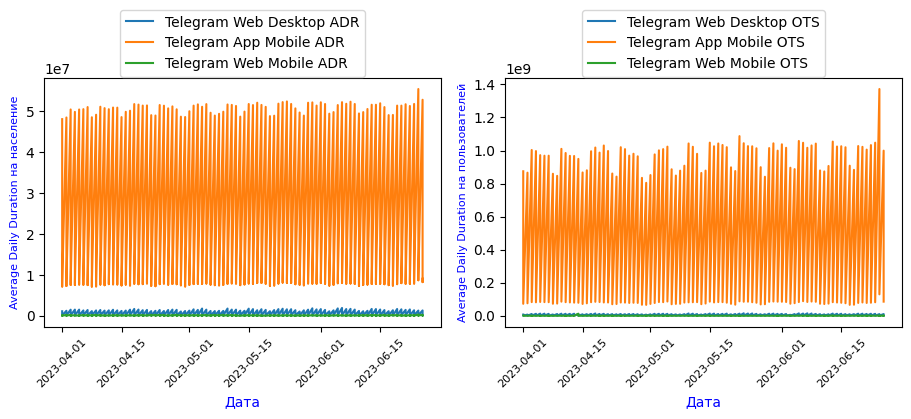

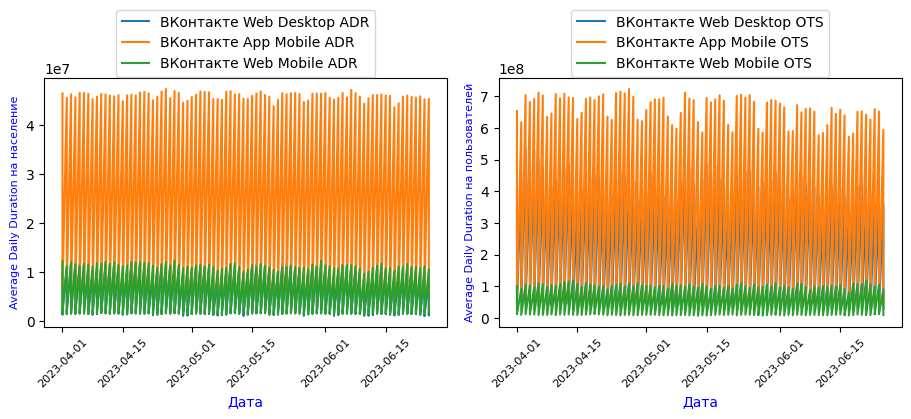

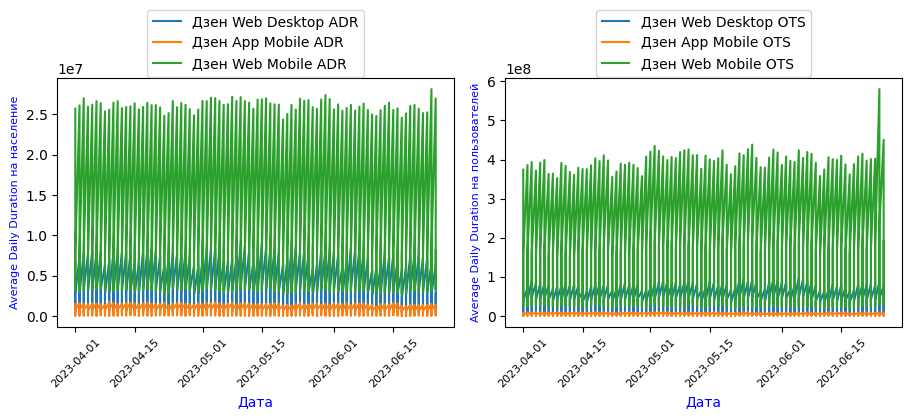

In [15]:
for k_6col, v_6cols in dict_columns.items():
    plot_average_daily_duration(df_dro, k_6col, v_6cols)

**Отмечаем**, что данные от трех источников имеют разные масштабы:
* Для источника **Telegram**: *Telegram App Mobile ADR* и *Telegram App Mobile OTS* на порядок больше, чем *Telegram Web Desktop ADR*, *Telegram Web Desktop OTS*, *Telegram Web Mobile ADR* и *Telegram Web Mobile OTS*.
* Для источника **ВКонтакте**: *ВКонтакте App Mobile ADR* и *ВКонтакте App Mobile OTS* на порядок больше, чем *ВКонтакте Web Desktop ADR*, *ВКонтакте Web Desktop OTS*, *ВКонтакте Web Mobile ADR* и *ВКонтакте Web Mobile OTS*.
* Для источника **Дзен**: самые большие значения имеют *Дзен Web Mobile ADR* и *Дзен Web Mobile OTS*
* Таким образом, сразу заметно, что пользователи предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR*. 
* Для всех трёх источников мало пользуются *Web Desktop* (ПК и ноутбуки).

Так как абсолютные значения нас не интересуют, интересует только поведение измеряемых величин, приведём все значения к одному масштабу.

In [16]:
# Настроим, чтобы числа в датасетах отражались без знаков после запятой
pd.set_option('display.float_format', '{:.0f}'.format) 

# Создадим кореж с именами признаков и масштабируемых коэффициентов:
coeff_scale = (
    ('Telegram Web Desktop ADR', 50),  ('Telegram Web Mobile ADR', 200),
    ('Telegram Web Desktop OTS', 0.5), ('Telegram App Mobile OTS', 0.005),
    ('ВКонтакте Web Desktop ADR', 4),  ('ВКонтакте Web Mobile ADR', 4),
    ('ВКонтакте Web Mobile OTS', 5),   ('Дзен Web Desktop ADR', 4),
    ('Дзен App Mobile ADR', 15),       ('Дзен Web Desktop OTS', 5),
    ('Дзен App Mobile OTS', 40)
              )
# Создадим врЕменный датафрейм
df_dro_0_tmp = df_dro_0.copy()

for i in range(len(coeff_scale)):
    df_dro_0_tmp[coeff_scale[i][0]] = df_dro_0_tmp[coeff_scale[i][0]].\
                                  apply(lambda x: x * coeff_scale[i][1])
df_dro_0_tmp.head(3)    

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
0,2023-04-01,55305000,3764050,48002300,4372505,26180000,1156200,40759600,408502300,46387900,653767100,48848000,505374500,26992000,357601000,22332000,282280000,25731400,374240500,0
1,2023-04-02,61305000,3673100,48408700,4330004,44020000,491400,44282400,453913400,45513200,618330800,44947600,454518500,29159600,359593500,24391500,329796000,26125100,385715000,0
2,2023-04-03,74535000,5516750,50368300,5016290,42800000,608400,47515200,536431100,46211900,703643700,48390400,526835000,31381600,451000000,22876500,344288000,27002500,393412700,0


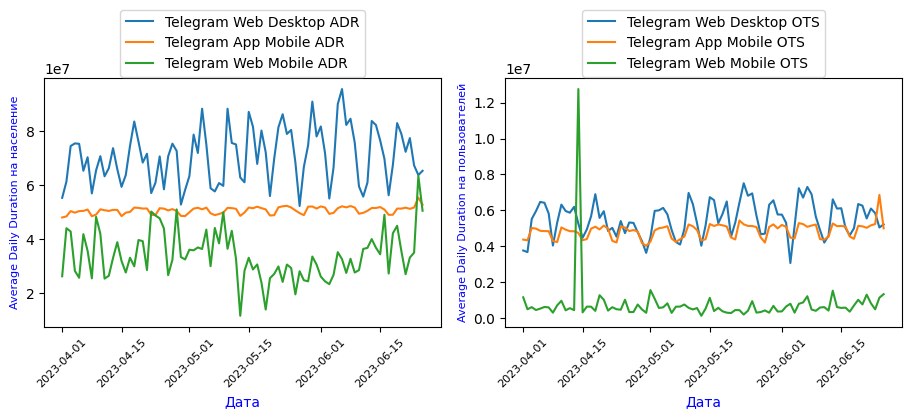

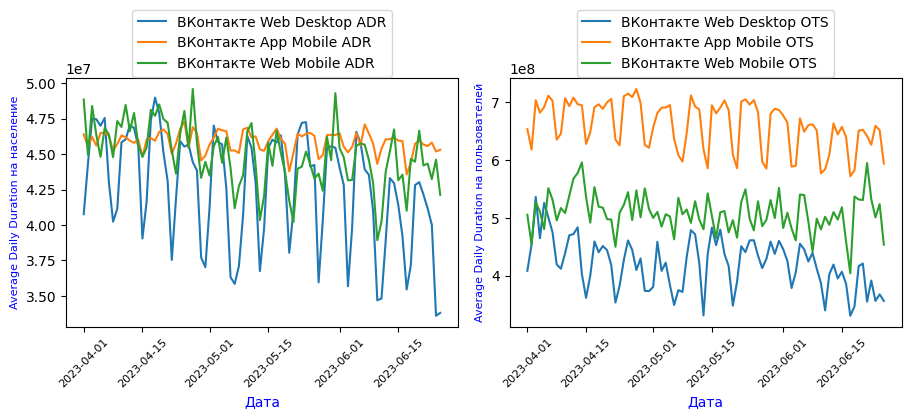

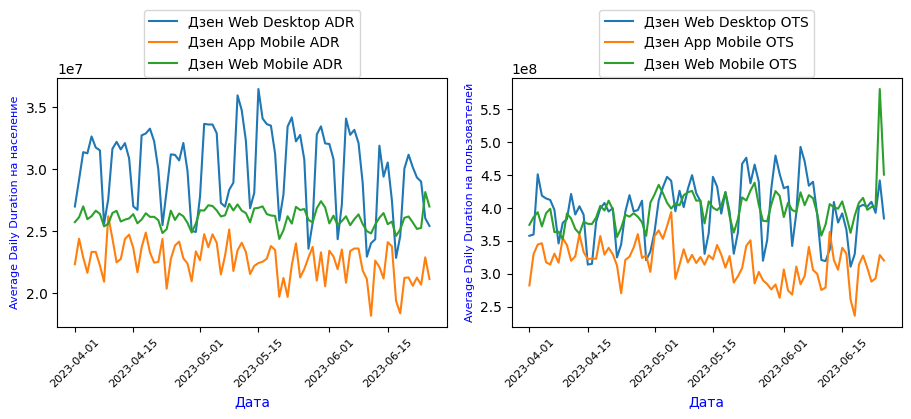

In [17]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_0_tmp, key, value)
    
# Удалим ненужный более датафрейм    
del df_dro_0_tmp    

По выровненным к одному масштабу значеням графикам распределения можно **отметить**:
* присутствие периодичности длительностью около 1 недели;
* наличие аномального выброса для **Telegram Web Mobile OTS**.

In [18]:
def format_my(num):
    '''
    Функция установки разделительного знака в виде запятой
    для больших чисел.
    '''    
    return f"{num:,}"

**Используем `Ящик с усами` ** для отображения статистической информации о распределении **Telegram Web Mobile OTS**, такие как медиана, квартили и аномальные значения:

Аномальное значение "Telegram Web Mobile OTS": 12,758,100.0


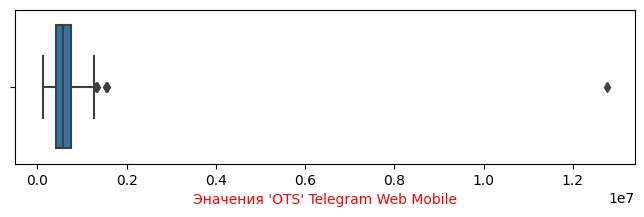

In [19]:
print('Аномальное значение "Telegram Web Mobile OTS":', 
      format_my(df_dro_0['Telegram Web Mobile OTS'].max()))

fig = plt.figure(figsize = (8,2))
sns.boxplot(df_dro_0['Telegram Web Mobile OTS'])
plt.xlabel("Эначения 'OTS' Telegram Web Mobile", fontsize=10, color='red')
plt.show;

**Отмечаем**:
* присутствие выбросов, то есть тех значений, которые находятся за пределами **75% перцентиль плюс 1.5 х МКР**,
* наличие аномального значения, на порядок превышающего все остальные значения.

In [20]:
# Выберем исследуемый признак:
tmp = df_dro_0['Telegram Web Mobile OTS']

# Отсотрируем, начиная с максимального по убыванию: 
display(tmp.sort_values(ascending = False).head(5))

13   12758100
30    1558600
73    1526800
85    1331800
81    1303600
Name: Telegram Web Mobile OTS, dtype: float64

In [21]:
# Посмотрим строку c индексом 13:
df_dro_0.iloc[[13]]

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
13,2023-04-14,1318800,10517000,50814900,949349500,194200,12758100,11388500,402933100,46021100,695047100,11411700,119208600,7721200,77935600,1648000,8324600,26028500,378983600,0


**Отмечаем**:
* строка, имеющая аномально высокое значение признака `Telegram Web Mobile OTS` имеет:
* индекс 13, 
* дата регистрации 14 апреля 2023.

Возможно, это ошибка, связанная с ручной записью (ошиблись в количестве знаков до до десятичного знака). Проверить это можно только с исполнителем.

**Изучим сезонную (периодическую) составляющую за неделю.**

Введём вспомогательные функции.

In [22]:
def volume_seasonal(df_dd, list_columns):
    '''
    Функция расчёта тренда и отображения сезонности временного ряда.
    '''
    for num in tqdm(range(0, len(list_columns), 2)):
        fg = plt.figure(figsize=(9, 3), constrained_layout=True)
        gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)

        # Создадим датафрейм и выберем для него
        # признак 'Date' и один информационнный.
        for_decompose = df_dd[['Date', list_columns[num]]]
        for_decompose.index = for_decompose['Date']
        for_decompose = for_decompose.drop('Date', axis=1)
        for_decompose.sort_index(inplace=True)
        for_decompose = for_decompose.resample('1D').sum()
        decomp = seasonal_decompose(for_decompose)

        fig_ax_1 = fg.add_subplot(gs[0, 0])
        decomp.seasonal[date_start:date_stop].plot(ax=plt.gca())
        plt.title(list_columns[num]+' - ПЕРИОД',
                  size = 10, color = 'red')
        plt.xlabel('Метрика "Average Daily Reach"', color = 'blue')
        plt.ylabel('Значение тренда.', color = 'blue');

        for_decompose = df_dd[['Date', list_columns[num+1]]]
        for_decompose.index = for_decompose['Date']
        for_decompose = for_decompose.drop('Date', axis=1)
        for_decompose.sort_index(inplace=True)
        for_decompose = for_decompose.resample('1D').sum()
        decomp = seasonal_decompose(for_decompose)

        fig_ax_2 = fg.add_subplot(gs[0, 1])
        decomp.seasonal[date_start:date_stop].plot(ax=plt.gca())
        plt.title(list_columns[num+1]+' - ПЕРИОД.',
                  size = 10, color = 'red')
        plt.xlabel('Метрика "Opportunity To See"', color = 'blue')
        plt.ylabel('Значение периодическое.', color = 'blue');

        plt.tight_layout()


def calc_print_weekday(date_start, date_stop):
    '''
    Функция нахождения названий дней недели.
    '''
    date_tmp = datetime.strptime(date_start, '%Y-%m-%d')
    date_end = datetime.strptime(date_stop, '%Y-%m-%d')
    labels = []

    while date_tmp <= date_end:
        labels.append(str(date_tmp.strftime('%y-%m-%d')) + \
                      ' - ' + date_tmp.strftime('%a'))
        date_tmp = date_tmp + timedelta(days=1)

    print('Дни недели:')
    n = 0
    for lab in labels:
        if n < 3:
            print(lab, 10*' ', end='')
            n = n + 1
        else:
            print(lab, end='\n')
            n = 0

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/9 [00:00<?, ?it/s]

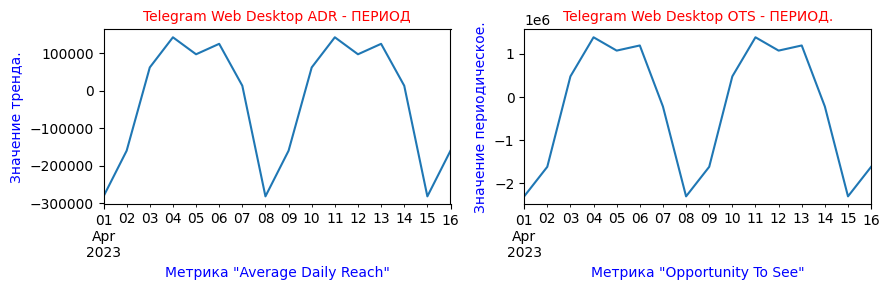

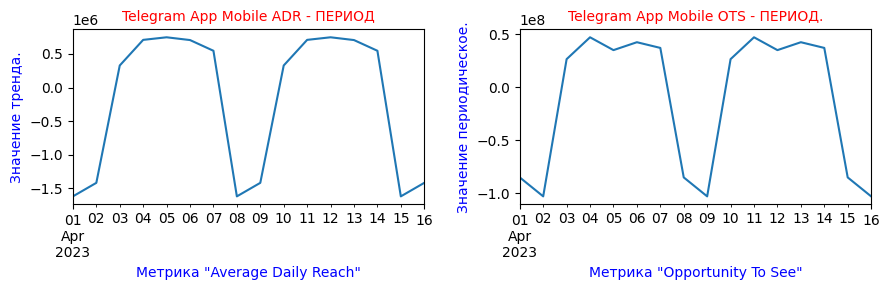

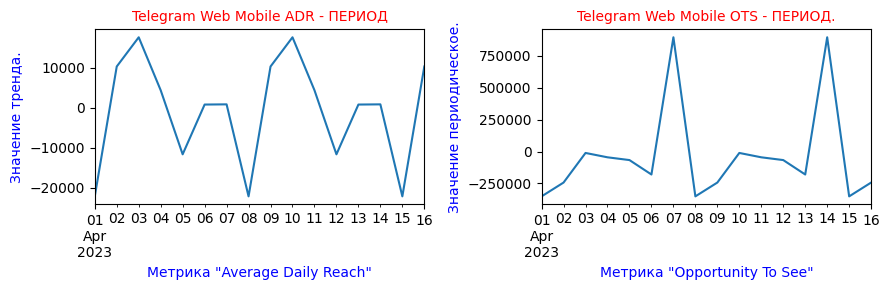

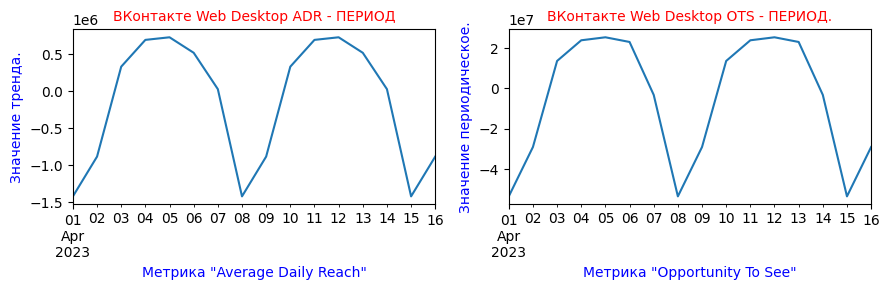

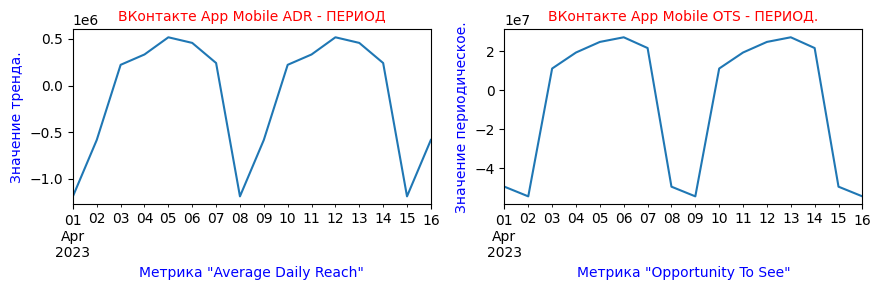

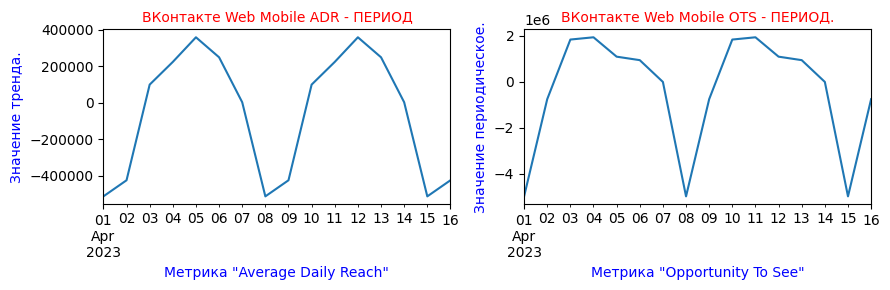

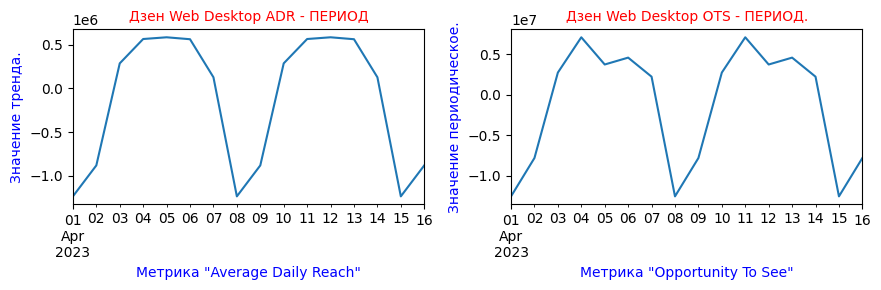

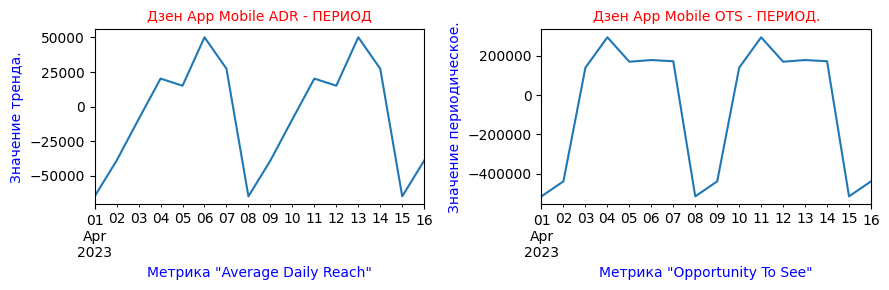

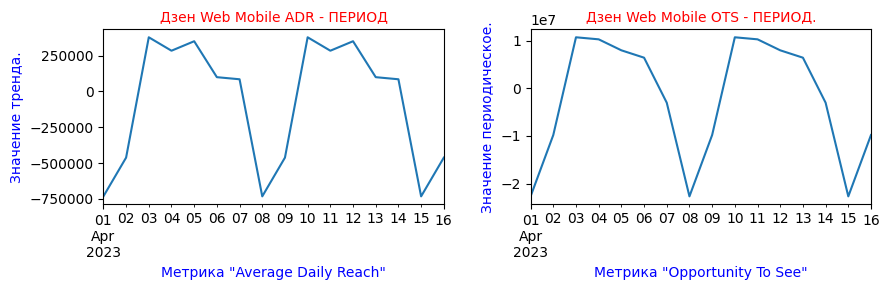

In [23]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dro_0, list_features)

**Отмечаем**:
* практически для всех источников информации детей до 12 лет наблюдается схожая картина. В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни.
* Своеобразное поведение у *Telegram Web Mobile*, по данной выборке его не понять.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда. Говоря более точно, среднее значение и дисперсия не меняются со смещением во времени.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

Создадим вспомогательный функции

In [24]:
def visual_stationarity_1(fg, gs, df, list_columns, num, pos):
    '''
    Функция построения 'скользящего среднего' единичного графика.
    '''
    # Зададим временный датафрейм c признаком для рассчитываемых 
    # тестовых значений скользящего среднего:
    df_tmp = df[['Date', list_columns[num+pos], 'age']].copy()
    df_tmp = df_tmp.sort_values(by=['Date', 'age'])
    df_tmp = df_tmp.groupby(['Date']).sum()[[list_columns[num+pos]]]
    df_tmp['mean'] = (df_tmp[list_columns[num+pos]].
                      rolling(window = WINDOW_STATIONARITY).
                      mean() )

    fig_ax_1 = fg.add_subplot(gs[0, 0+pos])
    plt.plot(df_tmp[list_columns[num+pos]], 
         label = 'Кол-во контактов по дням', color = 'steelblue')
    plt.plot(df_tmp['mean'], 
         label = 'Скользящее среднее за неделю', color = 'orange')

    plt.legend(title = 'Графики:', loc = 'upper left')        
    plt.xticks(fontsize = 8, rotation=15)
    plt.ylabel('Кол-во контактов.', color = 'blue')
    plt.title(list_columns[num+pos], color = 'red')

def visual_stationarity_6(df, list_columns):
    '''
    Функция построения 'скользящего среднего' 6-и графиков.
    '''
    for num in tqdm(range(0, len(list_columns), 2)):
        fg = plt.figure(figsize=(9, 3), constrained_layout=True)
        gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)
    
        visual_stationarity_1(fg, gs, df, list_columns, num, 0)
        visual_stationarity_1(fg, gs, df, list_columns, num, 1)      

        plt.tight_layout() 

  0%|          | 0/9 [00:00<?, ?it/s]

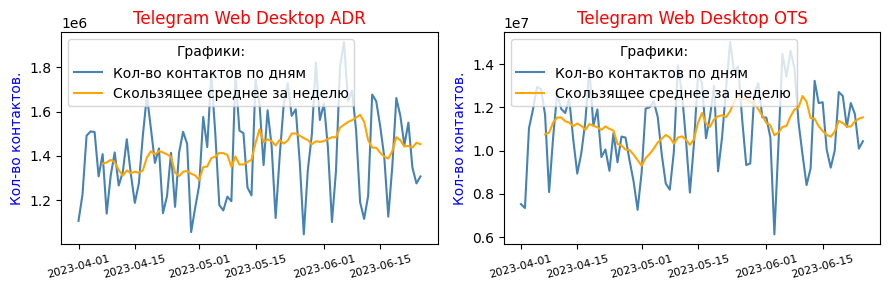

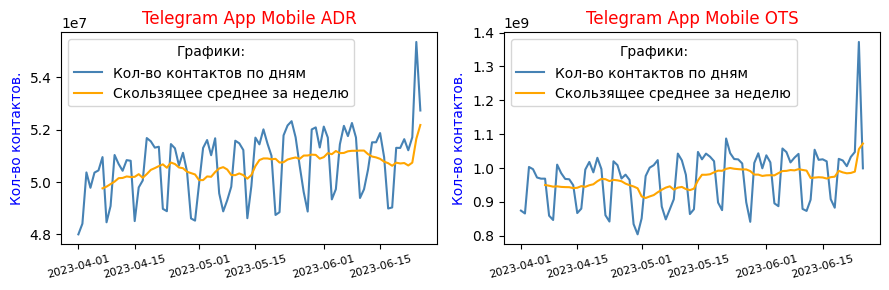

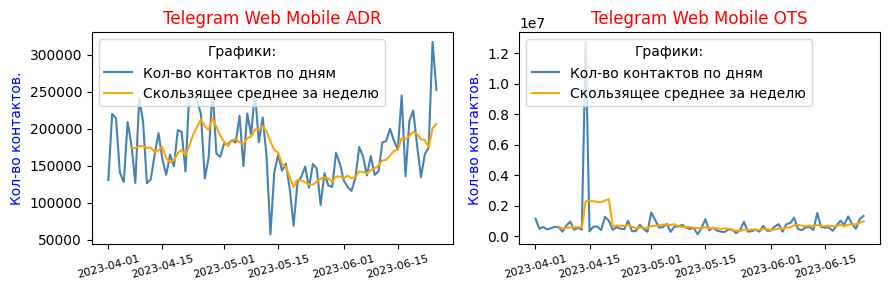

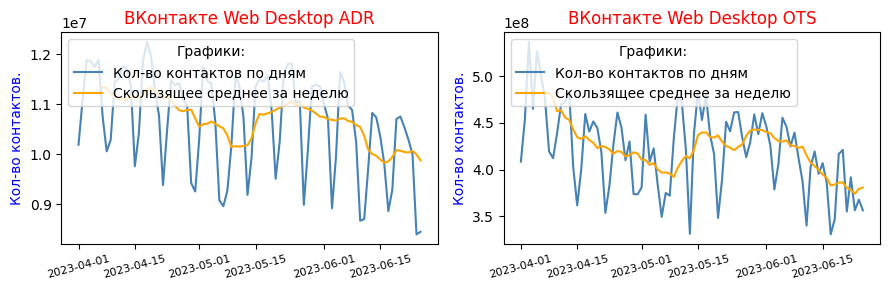

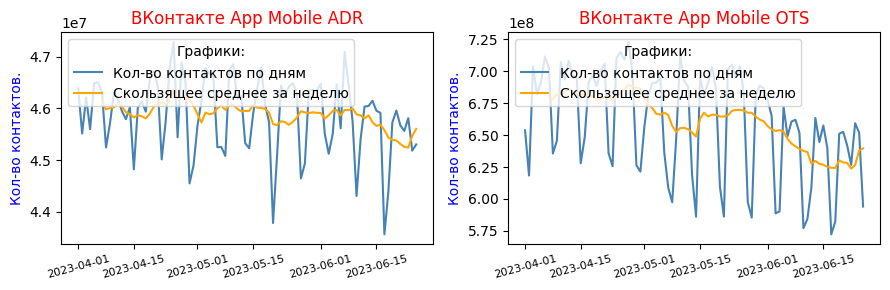

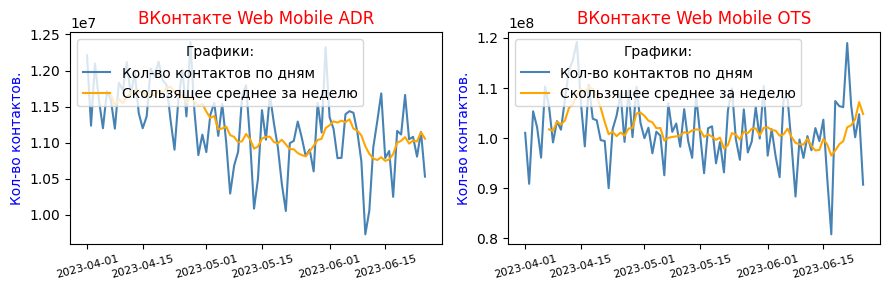

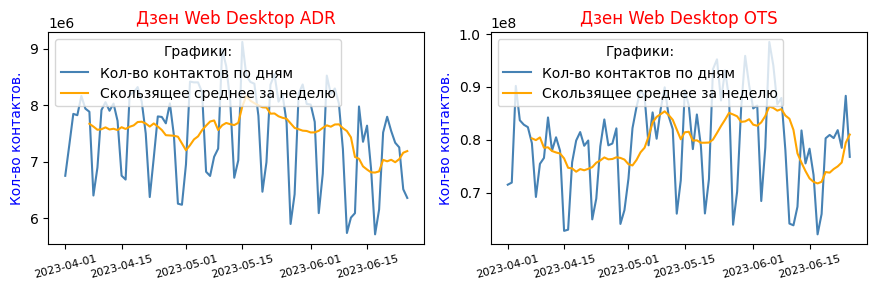

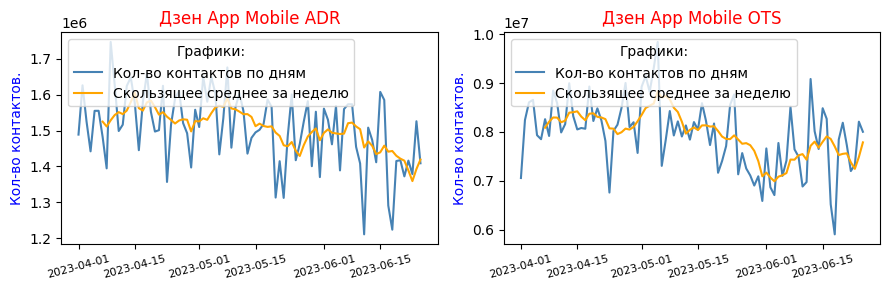

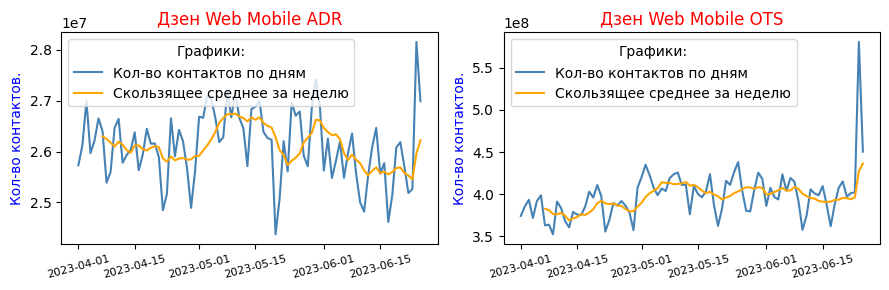

In [25]:
visual_stationarity_6(df_dro_0, list_features)

**Отмечаем**:
* возможное присутствие положительного тренда замечено только у *Telegram Web Mobile*;
* для остальных источников данных тренд не замечен.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%).

In [26]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])


def test_DF(df, columns):
    '''
    Функция проведения теста 'Дики-Фуллера' для проверки стационарности.
    '''
    for col in columns:
        # Передадим функции 'adfuller' данные по изучаемому признаку и
        # сохраним результат в переменной adf_test:
        adf_test = adfuller(df[col].fillna(0))
        if adf_test[0] < adf_test[4]["5%"]:
            df_test_DF.loc[len(df_test_DF.index )] =(
                [col, adf_test[0], adf_test[1], adf_test[4]["1%"],
                 adf_test[4]["5%"], "Стационарен."])
        else:
            df_test_DF.loc[len(df_test_DF.index )] =(
                [col, adf_test[0], adf_test[1], adf_test[4]["1%"],
                 adf_test[4]["5%"],"НЕ стационарен!"])
# adf_test[4]["10%"] - если интересно!

In [27]:
# Запуск исполнения теста
test_DF(df_dro_0, list_features)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Telegram Web Desktop ADR,-2.103,0.243,-3.518,-2.900,НЕ стационарен!
1,Telegram Web Desktop OTS,-1.388,0.588,-3.523,-2.902,НЕ стационарен!
2,Telegram App Mobile ADR,-0.854,0.803,-3.516,-2.899,НЕ стационарен!
3,Telegram App Mobile OTS,-0.363,0.916,-3.516,-2.899,НЕ стационарен!
4,Telegram Web Mobile ADR,-6.106,0.000,-3.510,-2.896,Стационарен.
5,Telegram Web Mobile OTS,-9.516,0.000,-3.510,-2.896,Стационарен.
6,ВКонтакте Web Desktop ADR,-1.023,0.745,-3.517,-2.899,НЕ стационарен!
7,ВКонтакте Web Desktop OTS,-1.990,0.291,-3.521,-2.901,НЕ стационарен!
8,ВКонтакте App Mobile ADR,-1.930,0.318,-3.516,-2.899,НЕ стационарен!
9,ВКонтакте App Mobile OTS,-0.755,0.832,-3.516,-2.899,НЕ стационарен!


**Промежуточные выводы** для всех источников **'Telegram', 'ВКонтакте', 'Дзен'** по возрастной группе **до 12 лет**:
* Дети предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR* и совсем редко пользуются *Web Desktop* (ПК и ноутбуки).
* присутствие периодичности длительностью около 1 недели;
* замечено наличие аномального значения:
    * На порядок превышающего все остальные, в "Telegram Web Mobile OTS"
    * Равного 12,758,100. 
    * Такое значение находятся за пределами 75% перцентиль плюс 1.5 х МКР (межквартильный размах).
    * Строка, имеющая аномально высокое значение признака "Telegram Web Mobile OTS" имеет индекс 13 и дату регистрации 14 апреля 2023.
    * Возможно, это ошибка, связанная с ручной записью (ошиблись в количестве знаков до  десятичного знака). Проверить это можно только с исполнителем.
* Практически для всех источников информации у детей до 12 лет наблюдается следующая картина. В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к Telegram, ВКонтакте и Дзен в рабочие дни.
* Тест проверку стационарности предполагает тренд в источниках по возрастной категории 'до 12 лет':
    * *Telegram Web Desktop ADR*;
    * *Telegram Web Desktop OTS*;
    * *Telegram App Mobile ADR*;
    * *Telegram App Mobile OTS*;
    * *ВКонтакте Web Desktop ADR*;
    * *ВКонтакте Web Desktop OTS*;
    * *ВКонтакте App Mobile ADR*;
    * *ВКонтакте App Mobile OTS*;
    * *ВКонтакте Web Mobile ADR*;
    * *Дзен Web Desktop ADR*;
    * *Дзен Web Desktop OTS*.   
    Для всех этих источников *нулевая гиротеза* не опровергнута.   
    Для остальных источников *нулевая гипотеза* опровергнута и принята альтернативная гипотеза об отсутствии тренда.

In [28]:
# уберем из памяти ненужный более датафрейм.
del df_dro_0

## 4.4. Анализ `ADR` и `OTS` по возрастной категории 'от 12 до 24 лет'.

Выделим из полного датафрейма, по всем возрастным группам, те записи, которые соответствуют выбранной возрастной группе.

In [29]:
print("Размер полного датафрейма:", df_dro.shape)

df_dro_12 = df_dro[df_dro.age == 12]
if (df_dro.shape[0] / 6 == df_dro_12.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'от 12 до 24 лет':", 
      df_dro_12.shape)
df_dro_12.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'от 12 до 24 лет': (86, 20)


,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
86,2023-04-01,528600.000,2585000.000,12720400.000,418588100.000,46800.000,548900.000,3193500.000,181822300.000,11942700.000,265913900.000,3040800.000,18875000.000,516600.000,920100.000,51300.000,123100.000,3184900.000,26344000.000,12
87,2023-04-02,565900.000,2138000.000,12625100.000,408794600.000,63500.000,154300.000,3620000.000,184973600.000,11402800.000,231775400.000,2526400.000,13510000.000,774000.000,1450900.000,69800.000,187500.000,3145400.000,24081400.000,12
88,2023-04-03,623600.000,2961700.000,13278800.000,480018400.000,55700.000,165400.000,3537900.000,236584900.000,11901100.000,286711900.000,3054900.000,22011000.000,425700.000,1108700.000,39200.000,112400.000,3273900.000,26768000.000,12


### 4.4.1. Графическое представление метрик `ADR` и `OTS` по возрастной  категории 'до 12 лет'.

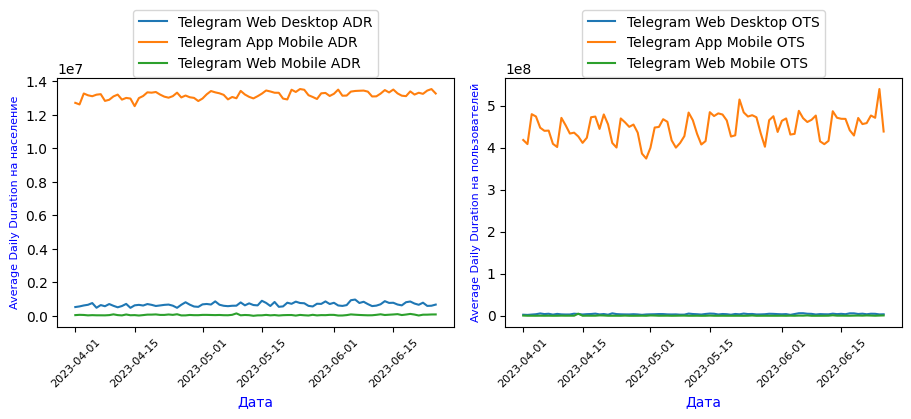

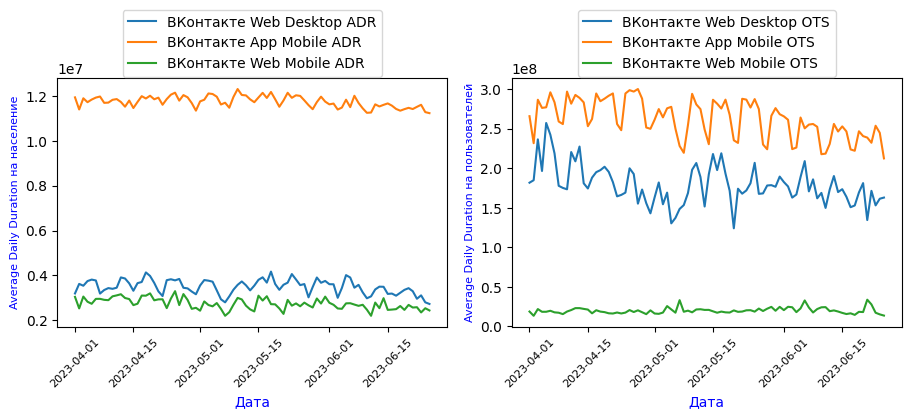

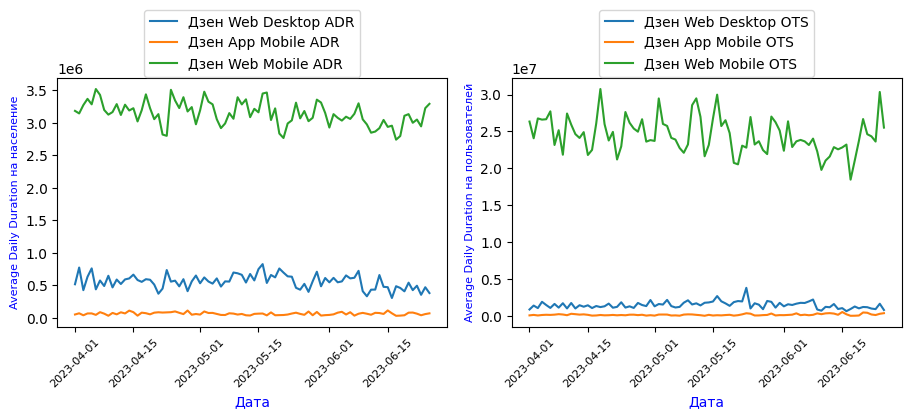

In [30]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_12, key, value)

**Отмечаем**, что данные от трех источников имеют разные масштабы:
* Для источника **Telegram**: *Telegram App Mobile ADR* и *Telegram App Mobile OTS* на порядок больше, чем *Telegram Web Desktop ADR*, *Telegram Web Desktop OTS*, *Telegram Web Mobile ADR* и *Telegram Web Mobile OTS*.
* Для источника **ВКонтакте**: *ВКонтакте App Mobile ADR* и *ВКонтакте App Mobile OTS* на порядок больше, чем *ВКонтакте Web Desktop ADR*, *ВКонтакте Web Desktop OTS*, *ВКонтакте Web Mobile ADR* и *ВКонтакте Web Mobile OTS*.
* Для источника **Дзен**: самые большие значения имеют *Дзен Web Mobile ADR* и *Дзен Web Mobile OTS*
* Таким образом, сразу заметно, что пользователи предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR*. 
* Для всех трёх источников мало пользуются *Web Desktop* (ПК и ноутбуки).

Так как абсолютные значения нас не интересуют, интересует только поведение измеряемых величин, приведём все значения к одному масштабу.

In [31]:
# Создадим кореж с именами признаков и масштабируемых коэффициентов:
coeff_scale = (
    ('Telegram Web Desktop ADR', 50),  ('Telegram Web Mobile ADR', 200),
    ('Telegram Web Desktop OTS', 0.5), ('Telegram App Mobile OTS', 0.005),
    ('ВКонтакте Web Desktop ADR', 4),  ('ВКонтакте Web Mobile ADR', 4),
    ('ВКонтакте Web Mobile OTS', 5),   ('Дзен Web Desktop ADR', 4),
    ('Дзен App Mobile ADR', 15),       ('Дзен Web Desktop OTS', 5),
    ('Дзен App Mobile OTS', 40)
              )

# Создадим врЕменный датафрейм
df_dro_12_tmp = df_dro_12.copy()

for i in range(len(coeff_scale)):
    df_dro_12_tmp[coeff_scale[i][0]] = df_dro_12_tmp[coeff_scale[i][0]].\
                                  apply(lambda x: x * coeff_scale[i][1])
df_dro_12_tmp.head(3)    

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
86,2023-04-01,26430000.000,1292500.000,12720400.000,2092940.500,9360000.000,548900.000,12774000.000,181822300.000,11942700.000,265913900.000,12163200.000,94375000.000,2066400.000,4600500.000,769500.000,4924000.000,3184900.000,26344000.000,12
87,2023-04-02,28295000.000,1069000.000,12625100.000,2043973.000,12700000.000,154300.000,14480000.000,184973600.000,11402800.000,231775400.000,10105600.000,67550000.000,3096000.000,7254500.000,1047000.000,7500000.000,3145400.000,24081400.000,12
88,2023-04-03,31180000.000,1480850.000,13278800.000,2400092.000,11140000.000,165400.000,14151600.000,236584900.000,11901100.000,286711900.000,12219600.000,110055000.000,1702800.000,5543500.000,588000.000,4496000.000,3273900.000,26768000.000,12


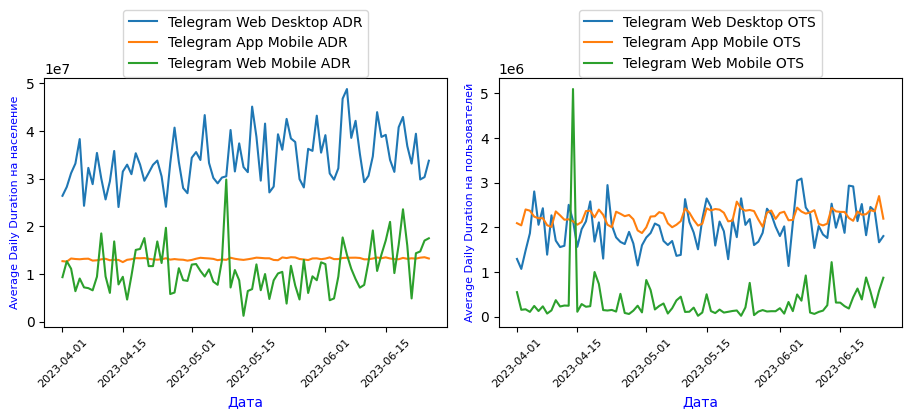

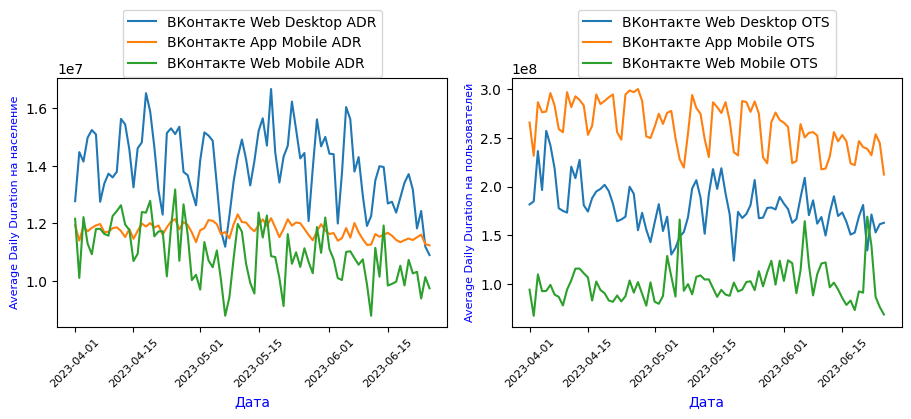

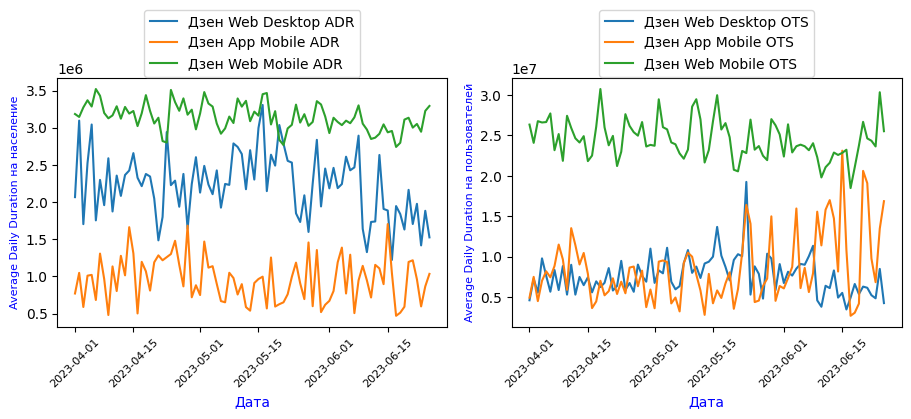

In [32]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_12_tmp, key, value)
    
# Удалим ненужный более датафрейм    
del df_dro_12_tmp   

По выровненным к одному масштабу значеням графикам распределения можно **отметить**:
* присутствие периодичности длительностью около 1 недели;
* наличие аномального выброса для **Telegram Web Mobile OTS**, аналогично выбросу в этом же признаке для детей до 12 лет.

**Используем `Ящик с усами` ** для отображения статистической информации о распределении **Telegram Web Mobile OTS**, такие как медиана, квартили и аномальные значения:

Аномальное значение "Telegram Web Mobile OTS": 5,095,300.0


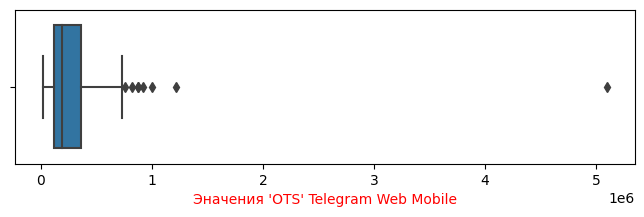

In [33]:
print('Аномальное значение "Telegram Web Mobile OTS":', 
      format_my(df_dro_12['Telegram Web Mobile OTS'].max()))

fig = plt.figure(figsize = (8,2))
sns.boxplot(df_dro_12['Telegram Web Mobile OTS'])
plt.xlabel("Эначения 'OTS' Telegram Web Mobile", fontsize=10, color='red')
plt.show;

**Отмечаем**:
* присутствие выбросов, то есть тех значений, которые находятся за пределами **75% перцентиль плюс 1.5 х МКР**,
* наличие аномального значения, на порядок превышающего все остальные значения.

In [34]:
# Выберем исследуемый признак:
tmp = df_dro_12['Telegram Web Mobile OTS']

# Отсотрируем, начиная с максимального по убыванию: 
display(tmp.sort_values(ascending = False).head(7))

99    5095300.000
159   1220800.000
104    999400.000
153    922300.000
167    877800.000
171    872200.000
116    820400.000
Name: Telegram Web Mobile OTS, dtype: float64

In [35]:
# Посмотрим строку c индексом 99 и 159 с учётом того, что выше в 
# общем датасете есть 86 записей для детей до 12 лет:
df_dro_12.iloc[[99-86, 159-86]]

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
99,2023-04-14,481500.000,4296500.000,12977000.000,426793800.000,39200.000,5095300.000,3644600.000,181044800.000,11801800.000,283361400.000,2943400.000,22242900.000,606100.000,1294600.000,110800.000,261400.000,3190900.000,24913100.000,12
159,2023-06-13,879500.000,5058000.000,13482600.000,487059500.000,53300.000,1220800.000,3497400.000,190227200.000,11536900.000,256124000.000,2536700.000,20314500.000,658400.000,1659200.000,73800.000,368200.000,2918900.000,22883700.000,12


**Отмечаем**:
* строка, имеющая аномально высокое значение признака `Telegram Web Mobile OTS` имеет ту же дату регистрации 14 апреля 2023, как и в выборке для детей до 12 лет!.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/9 [00:00<?, ?it/s]

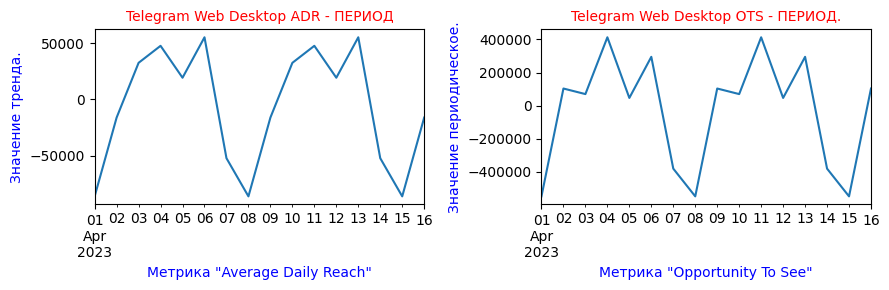

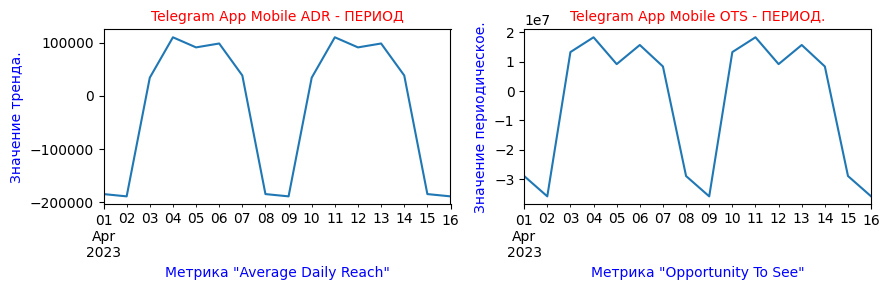

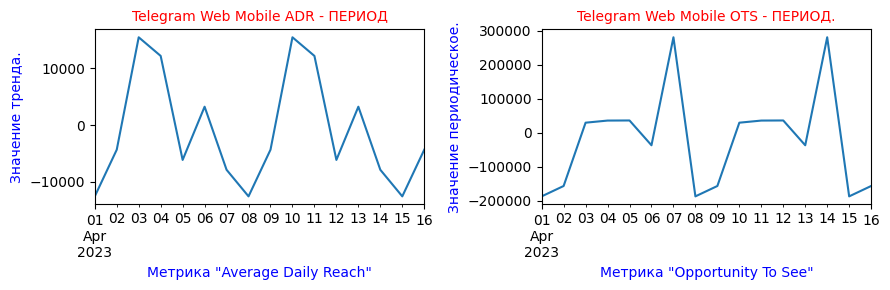

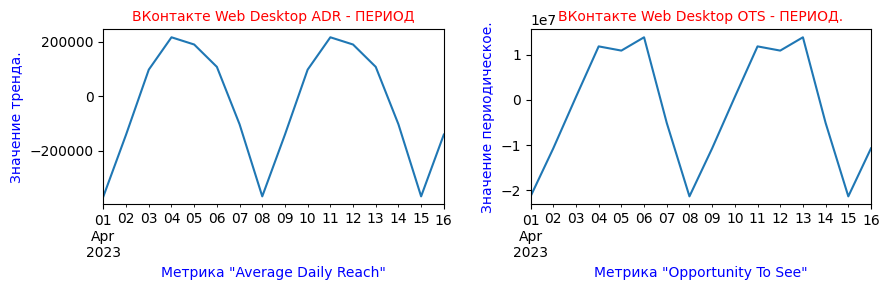

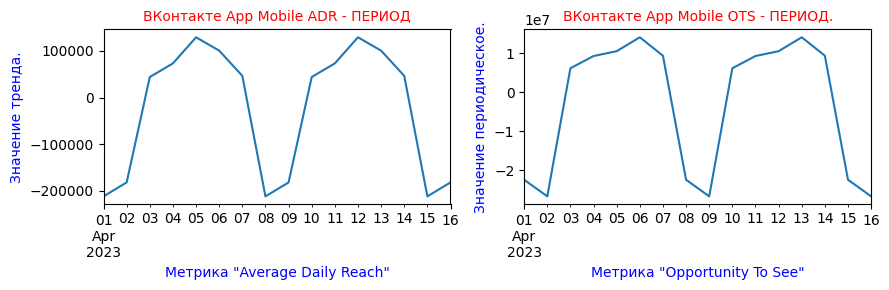

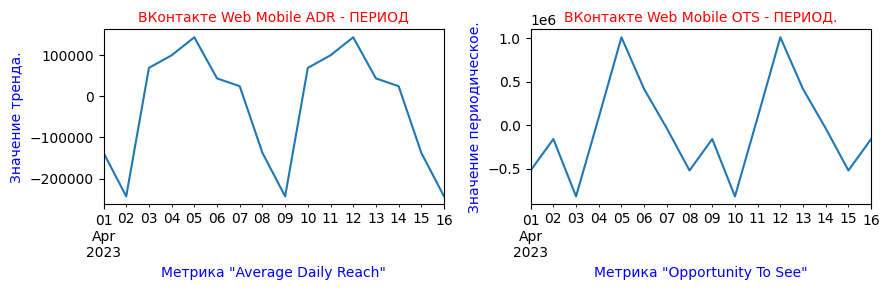

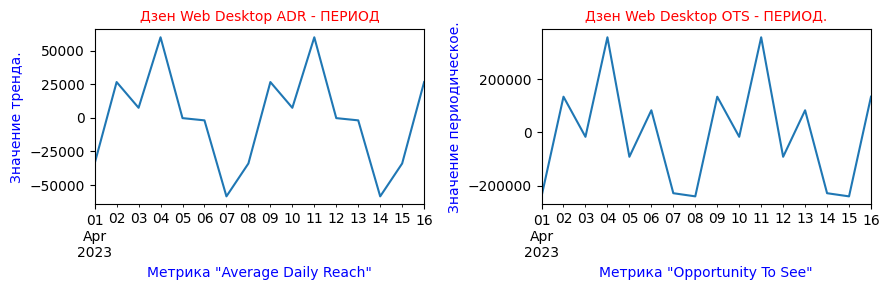

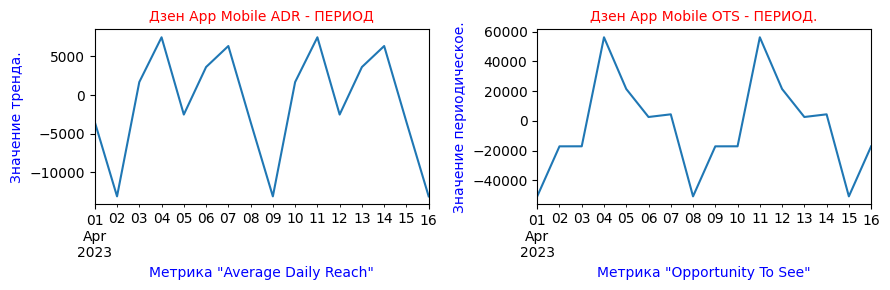

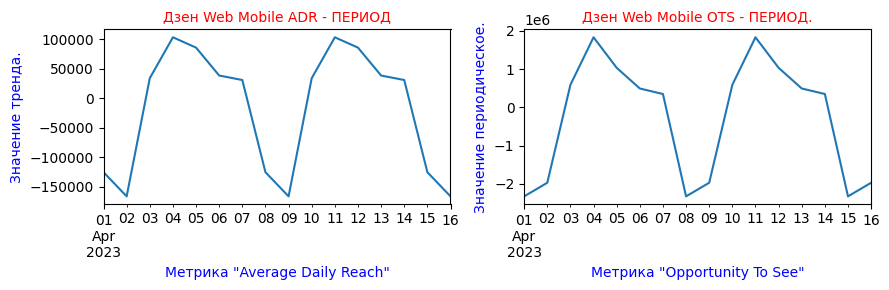

In [36]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dro_12, list_features)

**Отмечаем**:
* практически для всех источников информации для возрастной категории от 12 до 24 лет наблюдается то же самое, что и для детей до 12 лет. В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/9 [00:00<?, ?it/s]

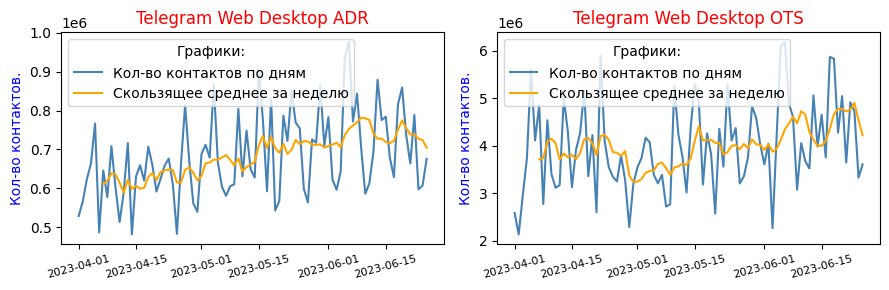

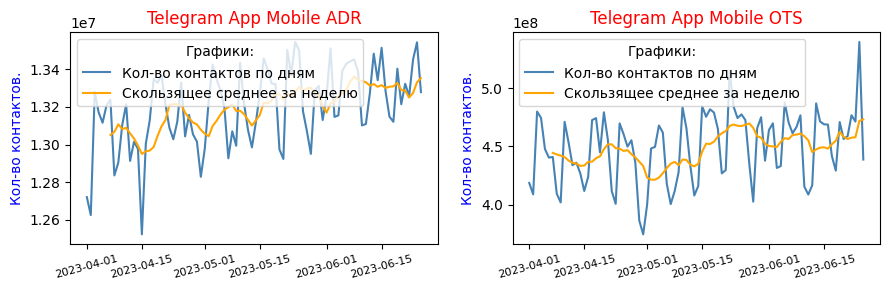

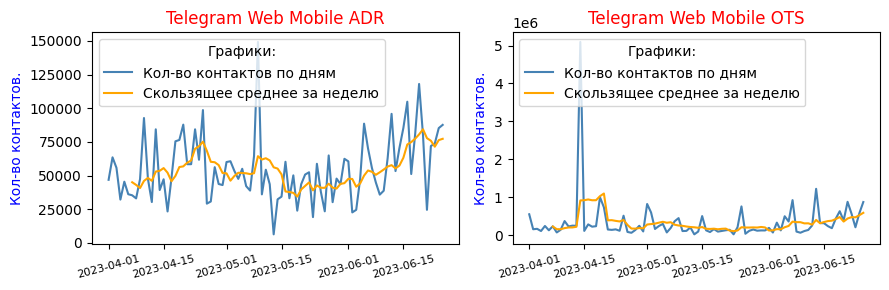

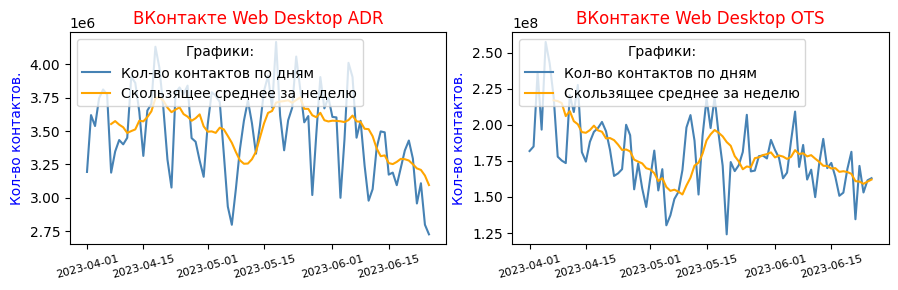

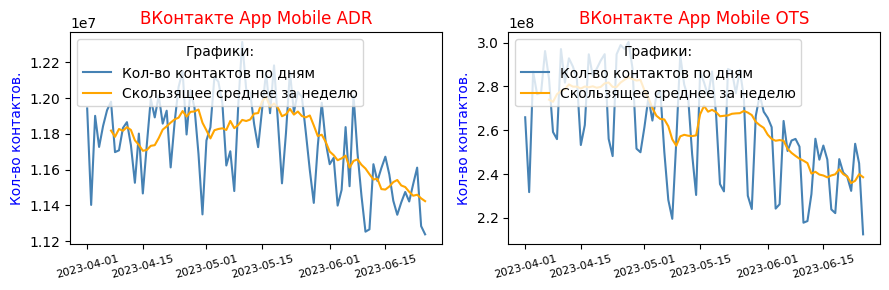

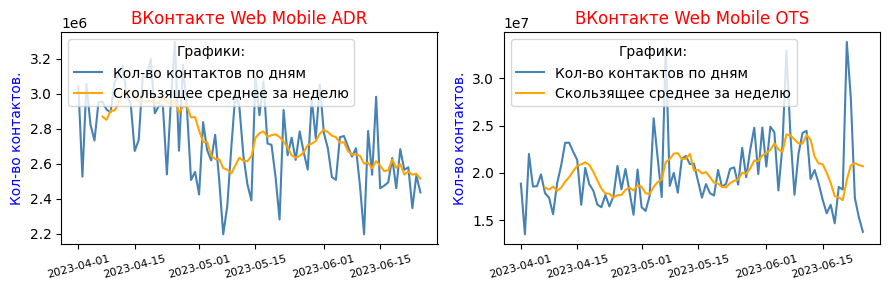

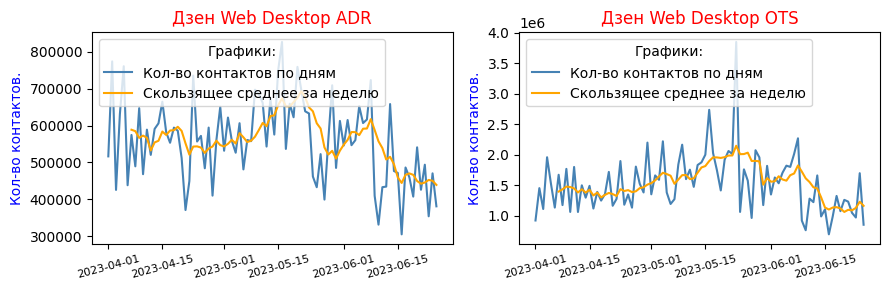

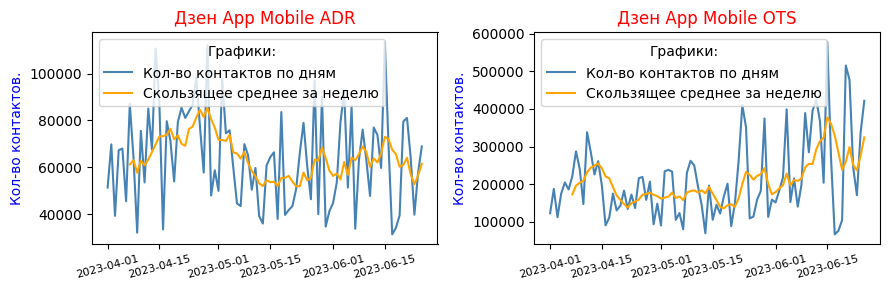

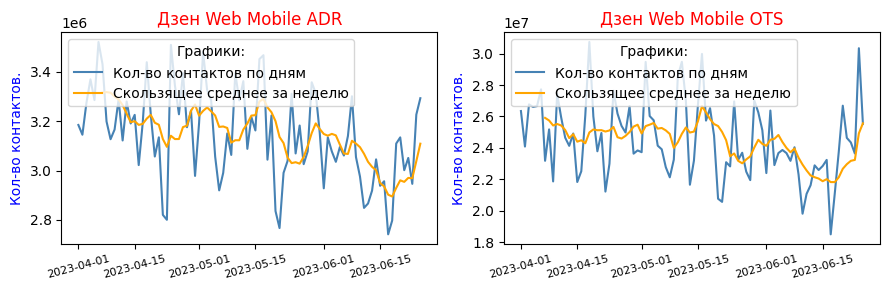

In [37]:
visual_stationarity_6(df_dro_12, list_features)

**Отмечаем**:
* возможное присутствие положительного тренда замечено только у *Telegram Web Desktop ADR*, *Telegram App Mobile ADR*;
* для остальных источников данных тренд не замечен.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%)

In [38]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dro_12, list_features)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Telegram Web Desktop ADR,-1.690,0.436,-3.517,-2.899,НЕ стационарен!
1,Telegram Web Desktop OTS,-7.397,0.000,-3.510,-2.896,Стационарен.
2,Telegram App Mobile ADR,-1.083,0.722,-3.523,-2.902,НЕ стационарен!
3,Telegram App Mobile OTS,-1.234,0.659,-3.516,-2.899,НЕ стационарен!
4,Telegram Web Mobile ADR,-7.180,0.000,-3.510,-2.896,Стационарен.
5,Telegram Web Mobile OTS,-9.107,0.000,-3.510,-2.896,Стационарен.
6,ВКонтакте Web Desktop ADR,-1.194,0.676,-3.518,-2.900,НЕ стационарен!
7,ВКонтакте Web Desktop OTS,-2.503,0.115,-3.518,-2.900,НЕ стационарен!
8,ВКонтакте App Mobile ADR,0.374,0.980,-3.517,-2.899,НЕ стационарен!
9,ВКонтакте App Mobile OTS,0.007,0.959,-3.516,-2.899,НЕ стационарен!


**Промежуточные выводы** для всех источников **'Telegram', 'ВКонтакте', 'Дзен'** по возрастной группе **от 12 до 24 лет**:
* Люди предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR* и совсем редко пользуются *Web Desktop* (ПК и ноутбуки).
* Присутствие периодичности длительностью около 1 недели. Аналогично ведут себя дети до 12 лет.
* Замечено наличие аномального значения:
    * На порядок превышающего все остальные, в "Telegram Web Mobile OTS"
    * Такое значение находятся за пределами 75% перцентиль плюс 1.5 х МКР (межквартильный размах).
    * Строка, имеющая аномально высокое значение признака "Telegram Web Mobile OTS" имеет дату регистрации 14 апреля 2023. В этот же день и по этому же признаку был аномальный выброс и для группы 'до 12 лет'!
* Практически для всех источников информации в группе от 12 до 24 лет наблюдается та же свмвя  картина, как и у детей до 12 лет! В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к Telegram, ВКонтакте и Дзен в рабочие дни.
* Тест проверку стационарности предполагает тренд в источниках по возрастной категории 'от 12 ло 24 лет':
    * *Telegram Web Desktop ADR*;
    * *Telegram App Mobile ADR*;
    * *Telegram App Mobile OTS*;
    * *ВКонтакте Web Desktop ADR*;
    * *ВКонтакте Web Desktop OTS*;   
    * *ВКонтакте App Mobile ADR*;
    * *ВКонтакте App Mobile OTS*;
    * *ВКонтакте Web Mobile ADR*;
    * *Дзен Web Desktop OTS*.   
    Для всех этих источников *нулевая гиротеза* не опровергнута.   
    Для остальных источников *нулевая гипотеза* опровергнута и принята альтернативная гипотеза об отсутствии тренда.

In [39]:
# уберем из памяти ненужный более датафрейм.
del df_dro_12

## 4.5. Анализ `ADR` и `OTS` по возрастной категории 'от 25 до 34 лет'.

Выделим из полного датафрейма, по всем возрастным группам, те записи, которые соответствуют выбранной возрастной группе.

In [40]:
print("Размер полного датафрейма:", df_dro.shape)

df_dro_24 = df_dro[df_dro.age == 25]
if (df_dro.shape[0] / 6 == df_dro_24.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'от 24 до 34 лет':", 
      df_dro_24.shape)
df_dro_24.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'от 24 до 34 лет': (86, 20)


,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
172,2023-04-01,193700.000,1580700.000,9500400.000,152031300.000,13800.000,142800.000,2158300.000,86720800.000,11254700.000,169693700.000,2760800.000,25939400.000,814300.000,5594400.000,121200.000,420500.000,4145600.000,38556800.000,25
173,2023-04-02,209800.000,1758000.000,9694900.000,153232900.000,29800.000,50400.000,2238000.000,81633300.000,11074900.000,161991400.000,2649800.000,24563800.000,860300.000,5055000.000,104100.000,320200.000,4290800.000,40911000.000,25
174,2023-04-03,289800.000,2752900.000,10005700.000,173813100.000,27200.000,99300.000,2554700.000,109053100.000,11093500.000,182898400.000,2929500.000,30113500.000,800800.000,6045500.000,111000.000,568400.000,4412000.000,44273800.000,25


### 4.5.1. Графическое представление метрик `ADR` и `OTS` по возрастной  категории 'от 25 до 34 лет'.

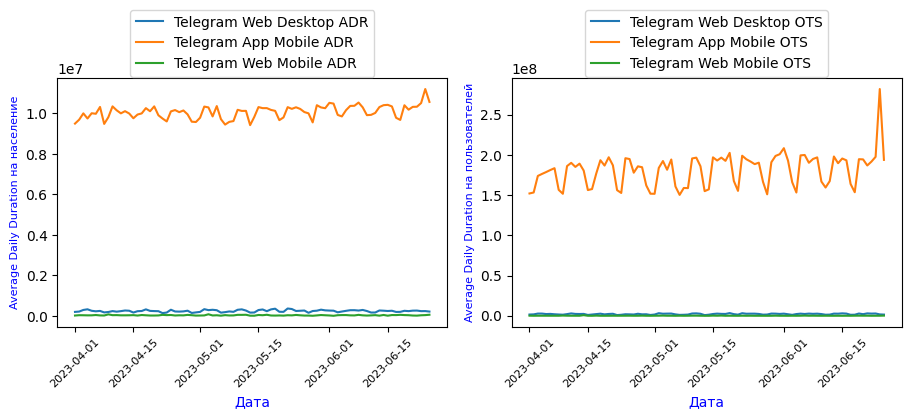

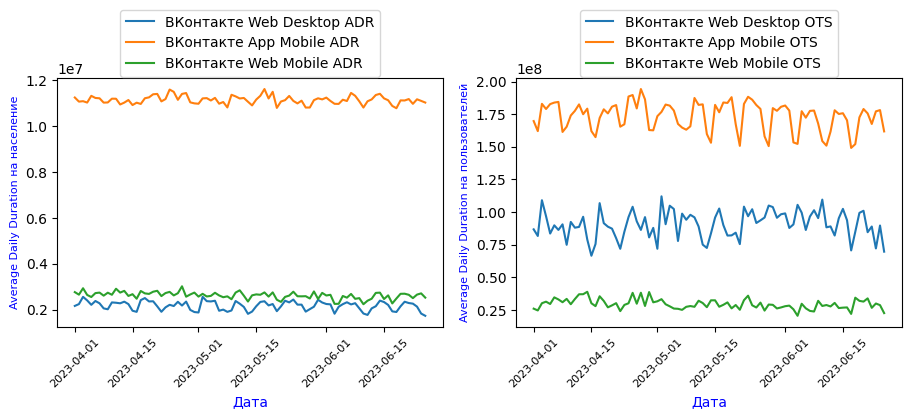

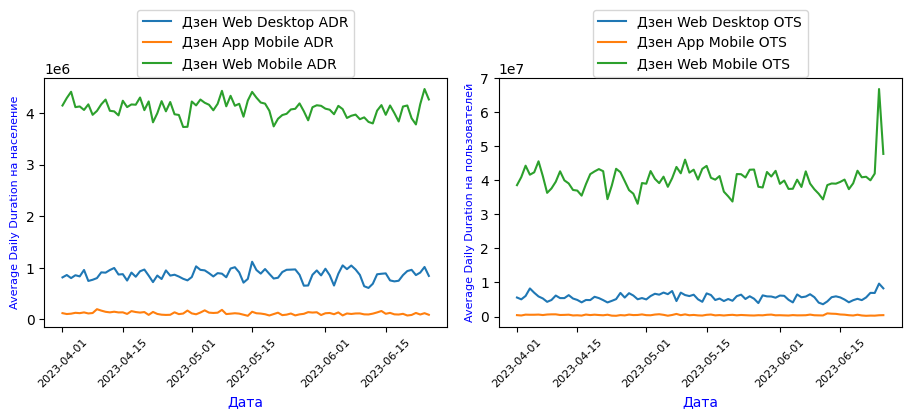

In [41]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_24, key, value)

**Отмечаем**, что данные от трех источников имеют разные масштабы:
* Для источника **Telegram**: *Telegram App Mobile ADR* и *Telegram App Mobile OTS* на порядок больше, чем *Telegram Web Desktop ADR*, *Telegram Web Desktop OTS*, *Telegram Web Mobile ADR* и *Telegram Web Mobile OTS*.
* Для источника **ВКонтакте**: *ВКонтакте App Mobile ADR* и *ВКонтакте App Mobile OTS* на порядок больше, чем *ВКонтакте Web Desktop ADR*, *ВКонтакте Web Desktop OTS*, *ВКонтакте Web Mobile ADR* и *ВКонтакте Web Mobile OTS*.
* Для источника **Дзен**: самые большие значения имеют *Дзен Web Mobile ADR* и *Дзен Web Mobile OTS*
* Таким образом, сразу заметно, что пользователи предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR*. 
* Для всех трёх источников мало пользуются *Web Desktop* (ПК и ноутбуки).

Так как абсолютные значения нас не интересуют, интересует только поведение измеряемых величин, приведём все значения к одному масштабу.

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
172,2023-04-01,9685000,790350,9500400,760156,2760000,142800,8633200,86720800,11254700,169693700,11043200,129697000,3257200,27972000,1818000,16820000,4145600,38556800,25
173,2023-04-02,10490000,879000,9694900,766164,5960000,50400,8952000,81633300,11074900,161991400,10599200,122819000,3441200,25275000,1561500,12808000,4290800,40911000,25
174,2023-04-03,14490000,1376450,10005700,869066,5440000,99300,10218800,109053100,11093500,182898400,11718000,150567500,3203200,30227500,1665000,22736000,4412000,44273800,25


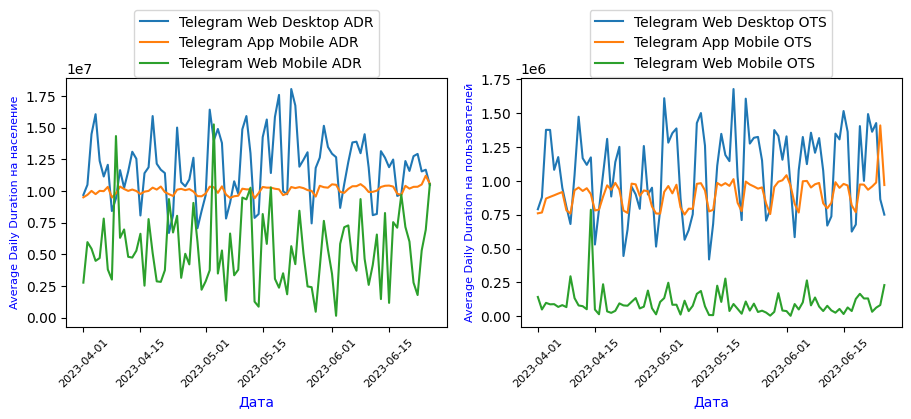

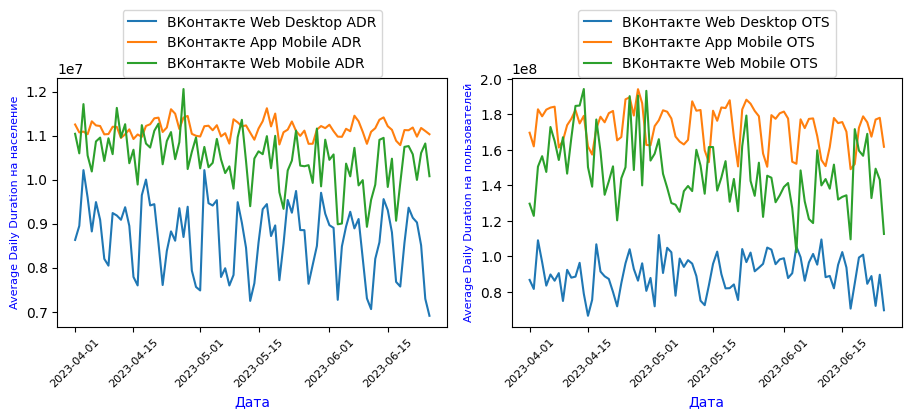

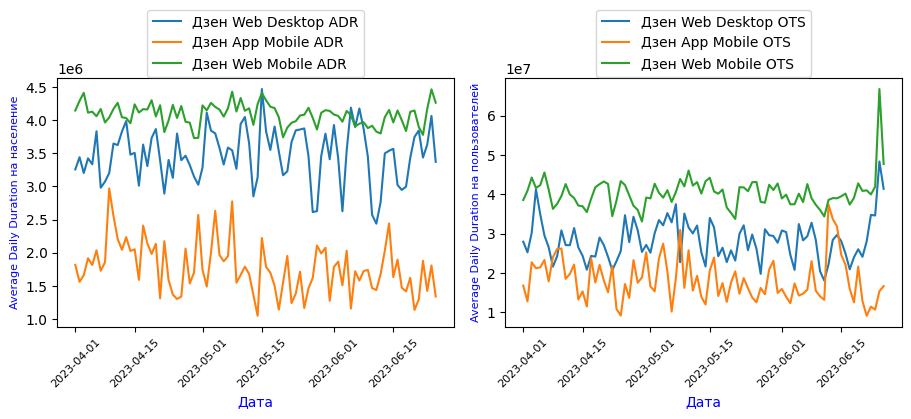

In [42]:
# Настроим, чтобы числа в датасетах отражались без знаков после запятой
pd.set_option('display.float_format', '{:.0f}'.format)

# Создадим врЕменный датафрейм
df_dro_24_tmp = df_dro_24.copy()

for i in range(len(coeff_scale)):
    df_dro_24_tmp[coeff_scale[i][0]] = df_dro_24_tmp[coeff_scale[i][0]].\
                                  apply(lambda x: x * coeff_scale[i][1])
display(df_dro_24_tmp.head(3))

for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_24_tmp, key, value)

# Удалим ненужный более датафрейм
del df_dro_24_tmp

По выровненным к одному масштабу значеням графикам распределения можно **отметить**:
* присутствие периодичности длительностью около 1 недели;
* наличие аномального выброса для **Telegram Web Mobile OTS**, аналогично выбросу в этом же признаке для категорий *до 12 лет* и *от 12 до 24 лет*.

**Используем `Ящик с усами` ** для отображения статистической информации о распределении **Telegram Web Mobile OTS**, такие как медиана, квартили и аномальные значения:

Аномальное значение "Telegram Web Mobile OTS": 786,400.0


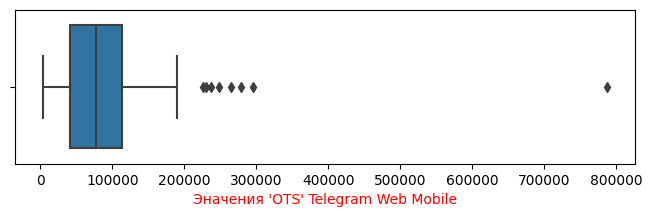

In [43]:
print('Аномальное значение "Telegram Web Mobile OTS":', 
      format_my(df_dro_24['Telegram Web Mobile OTS'].max()))

fig = plt.figure(figsize = (8,2))
sns.boxplot(df_dro_24['Telegram Web Mobile OTS'])
plt.xlabel("Эначения 'OTS' Telegram Web Mobile", fontsize=10, color='red')
plt.show;

**Отмечаем**:
* присутствие выбросов, то есть тех значений, которые находятся за пределами **75% перцентиль плюс 1.5 х МКР**,
* наличие аномального значения, на порядок превышающего все остальные значения.

In [44]:
# Выберем исследуемый признак:
tmp = df_dro_24['Telegram Web Mobile OTS']

# Отсотрируем, начиная с максимального по убыванию: 
display(tmp.sort_values(ascending = False).head(5))

185   786400
180   295500
218   278400
238   265300
204   247900
Name: Telegram Web Mobile OTS, dtype: float64

In [45]:
# Посмотрим строку c индексом 185 с учётом того, что выше в 
# общем датасете есть 86 записей для детей 'до 12 лет' и 
# 86 записей для группы 'от 12 до 24 лет':
df_dro_24.iloc[[185-86*2]]

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
185,2023-04-14,250900,2346100,9998800,180436200,26400,786400,2237900,78897300,11144600,179205000,2593700,38864500,870000,5297400,135200,332100,3954500,37145200,25


**Отмечаем**:
* строка, имеющая аномально высокое значение признака `Telegram Web Mobile OTS` имеет ту же дату регистрации 14 апреля 2023, как и в выборке для детей до 12 лет и для группы 'от 12 до 24 лет!

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/9 [00:00<?, ?it/s]

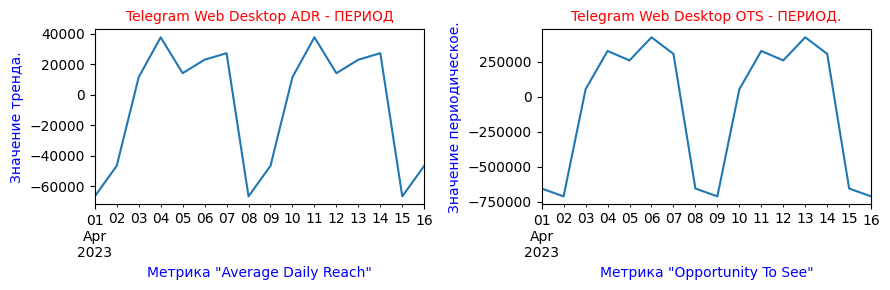

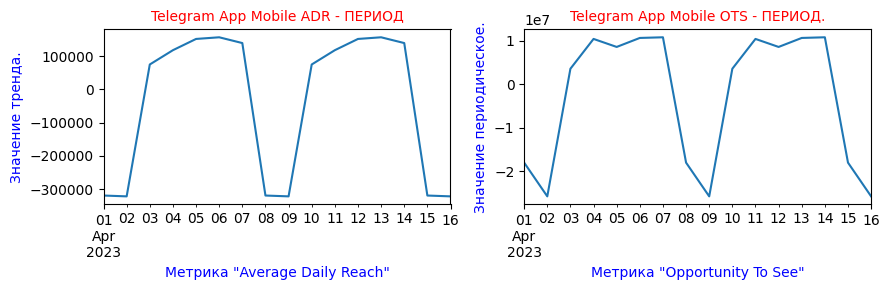

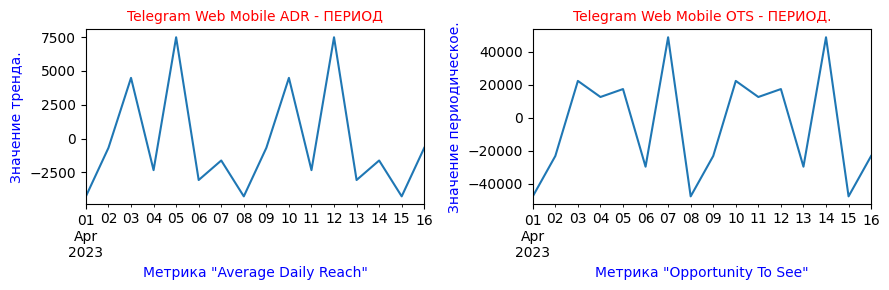

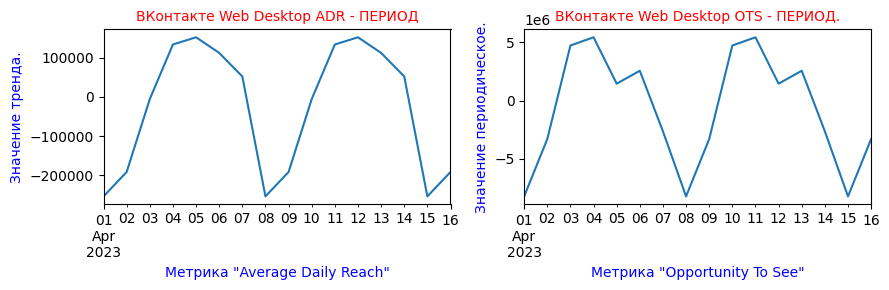

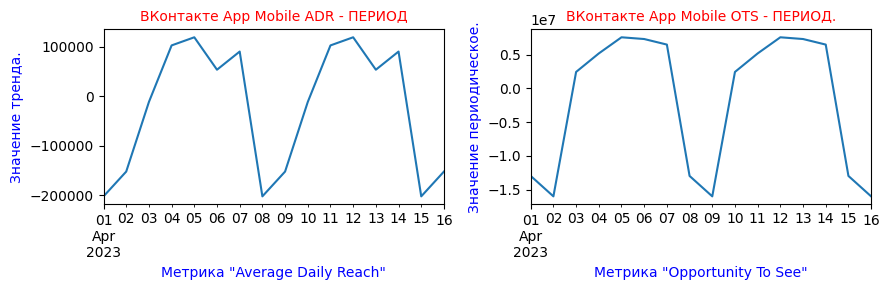

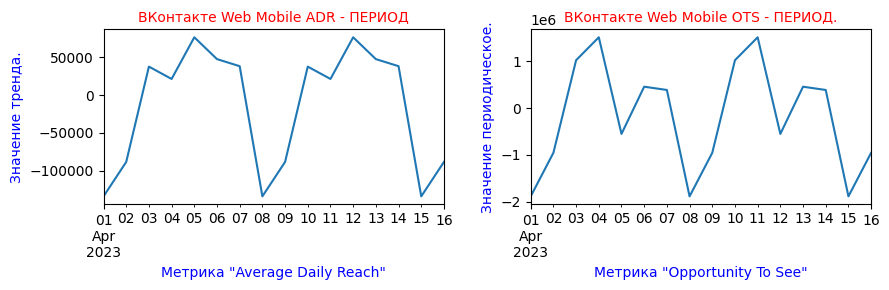

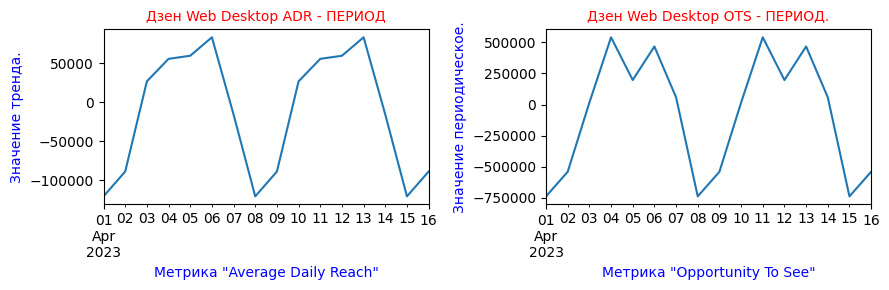

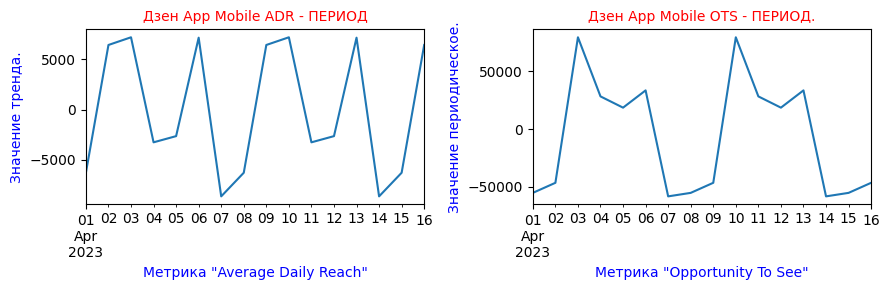

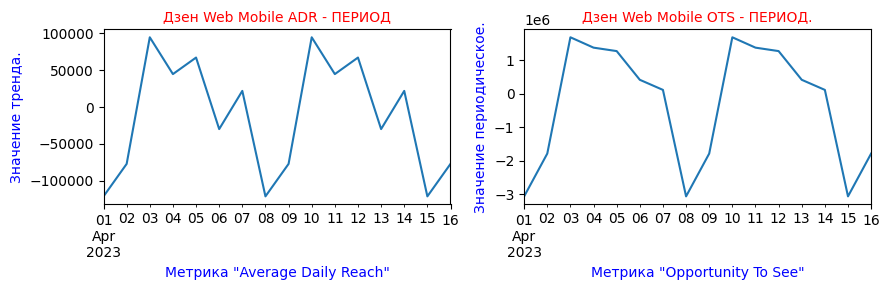

In [46]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dro_24, list_features)

**Отмечаем**:
* практически для всех источников информации для возрастной категории от 25 до 34 лет наблюдается то же самое, что и для детей до 12 лет и в группе 'от 12 до 24 лет' . В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И люди активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/9 [00:00<?, ?it/s]

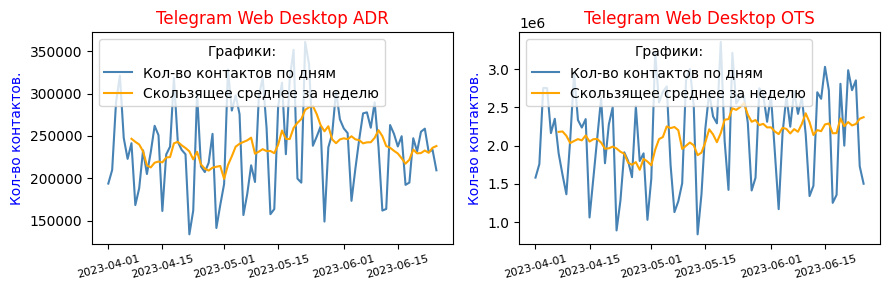

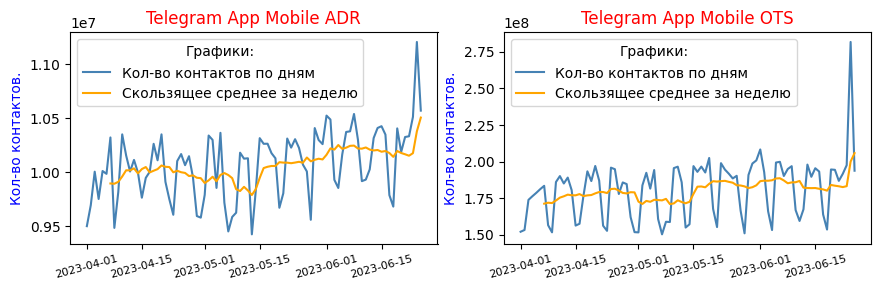

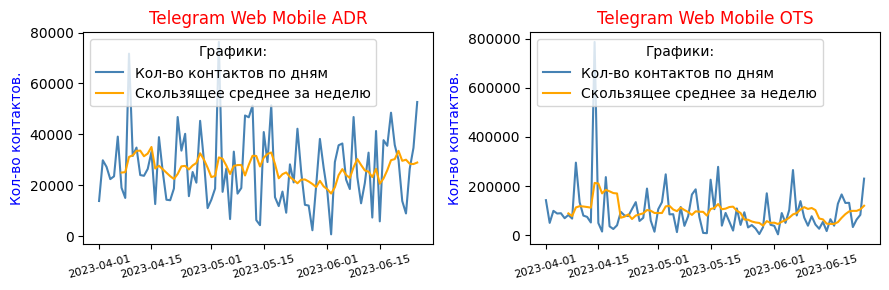

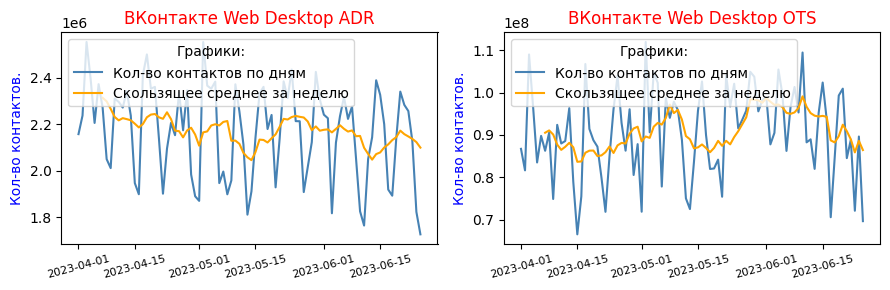

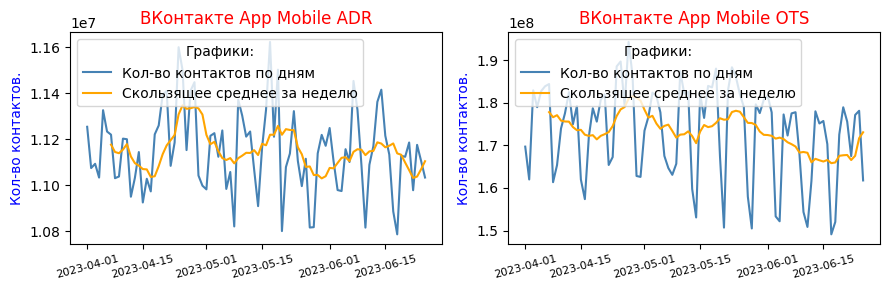

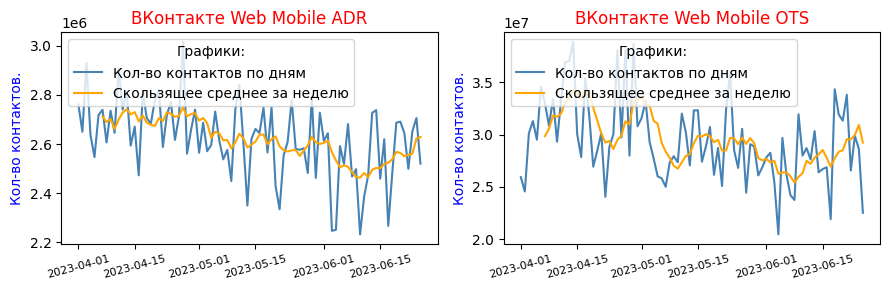

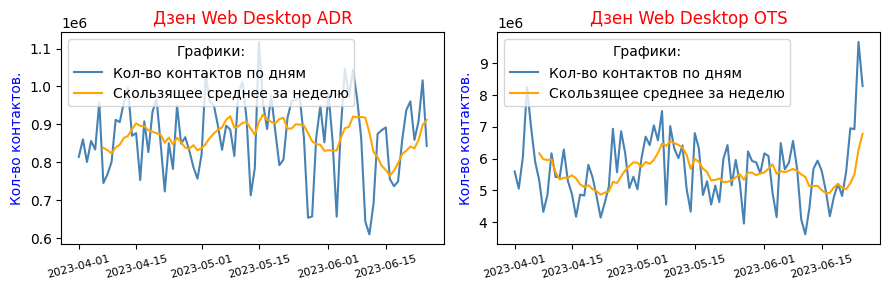

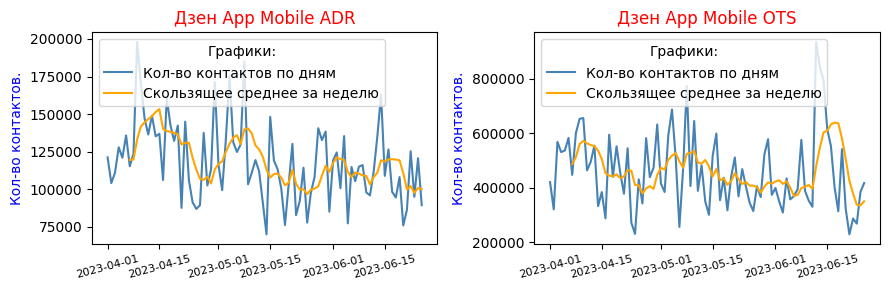

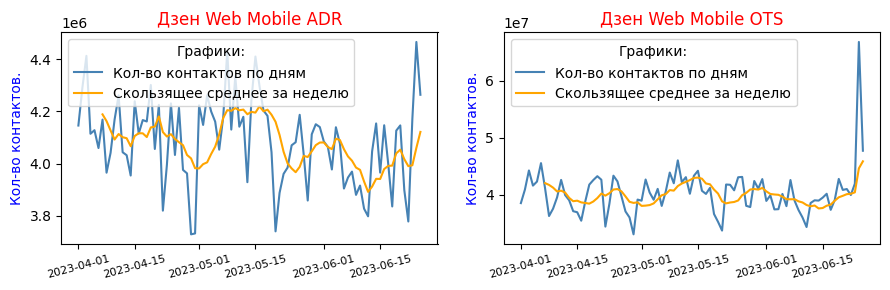

In [47]:
visual_stationarity_6(df_dro_24, list_features)

**Отмечаем**:
* возможное присутствие положительного тренда замечено только у *Telegram App Mobile ADR*;
* для остальных источников данных тренд не замечен.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%)

In [48]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dro_24, list_features)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Telegram Web Desktop ADR,-2.242,0.191,-3.518,-2.900,НЕ стационарен!
1,Telegram Web Desktop OTS,-1.785,0.388,-3.517,-2.899,НЕ стационарен!
2,Telegram App Mobile ADR,-0.304,0.925,-3.516,-2.899,НЕ стационарен!
3,Telegram App Mobile OTS,-0.801,0.819,-3.516,-2.899,НЕ стационарен!
4,Telegram Web Mobile ADR,-7.664,0.000,-3.512,-2.897,Стационарен.
5,Telegram Web Mobile OTS,-9.425,0.000,-3.510,-2.896,Стационарен.
6,ВКонтакте Web Desktop ADR,-2.851,0.051,-3.516,-2.899,НЕ стационарен!
7,ВКонтакте Web Desktop OTS,-7.244,0.000,-3.510,-2.896,Стационарен.
8,ВКонтакте App Mobile ADR,-4.655,0.000,-3.521,-2.901,Стационарен.
9,ВКонтакте App Mobile OTS,-2.151,0.224,-3.523,-2.902,НЕ стационарен!


**Промежуточные выводы** для всех источников **'Telegram', 'ВКонтакте', 'Дзен'** по возрастной группе **от 25 до 34 лет**:
* Люди предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR* и совсем редко пользуются *Web Desktop* (ПК и ноутбуки).
* Присутствие периодичности длительностью около 1 недели. Аналогично ведут себя все более младшие люди.
* Замечено наличие аномального значения:
    * На порядок превышающего все остальные, в "Telegram Web Mobile OTS"
    * Такое значение находятся за пределами 75% перцентиль плюс 1.5 х МКР (межквартильный размах).
    * Строка, имеющая аномально высокое значение признака "Telegram Web Mobile OTS" имеет дату регистрации 14 апреля 2023. В этот же день и по этому же признаку был аномальный выброс и для всех более младших групп людей!
* Практически для всех источников информации в группе от 25 до 34 лет наблюдается та же самая  картина, как и у более младших людей! В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к Telegram, ВКонтакте и Дзен в рабочие дни.
* Тест проверку стационарности предполагает тренд в источниках по возрастной категории 'от 24 до 35 лет':
    * *Telegram Web Desktop ADR*;
    * *Telegram Web Desktop OTS*;
    * *Telegram App Mobile ADR*;
    * *Telegram App Mobile OTS*;
    * *ВКонтакте Web Desktop ADR*;   
    * *ВКонтакте App Mobile OTS*;
    * *ВКонтакте Web Mobile ADR*.   
    Для всех этих источников *нулевая гиротеза* не опровергнута.   
    Для остальных источников *нулевая гипотеза* опровергнута и принята альтернативная гипотеза об отсутствии тренда.

In [49]:
# уберем из памяти ненужный более датафрейм.
del df_dro_24

### 4.6. Анализ `ADR` и `OTS` по возрастной категории 'от 35 до 44 лет'.

Выделим из полного датафрейма, по всем возрастным группам, те записи, которые соответствуют выбранной возрастной группе.

In [50]:
print("Размер полного датафрейма:", df_dro.shape)

df_dro_35 = df_dro[df_dro.age == 35]
if (df_dro.shape[0] / 6 == df_dro_35.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'от 35 до 44 лет':", 
      df_dro_35.shape)
df_dro_35.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'от 35 до 44 лет': (86, 20)


,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
258,2023-04-01,174100.000,2125100.000,10720000.000,146072600.000,27600.000,125600.000,1729300.000,58916700.000,10485100.000,109884600.000,2651400.000,29713000.000,1284300.000,13998800.000,240600.000,1469400.000,5718700.000,73913900.000,35
259,2023-04-02,207000.000,2528500.000,10559900.000,140762000.000,27300.000,128200.000,1767000.000,59096400.000,10472900.000,109568900.000,2558200.000,28232200.000,1429600.000,10585700.000,294100.000,1722700.000,5868800.000,77751900.000,35
260,2023-04-03,301800.000,3795900.000,11184000.000,168954400.000,27100.000,70800.000,2072800.000,81656000.000,10623600.000,118400900.000,2738000.000,29325900.000,1722800.000,17672000.000,239000.000,1682000.000,5981100.000,83322300.000,35


### 4.6.1. Графическое представление метрик `ADR` и `OTS` по возрастной  категории 'от 35 до 44 лет'.

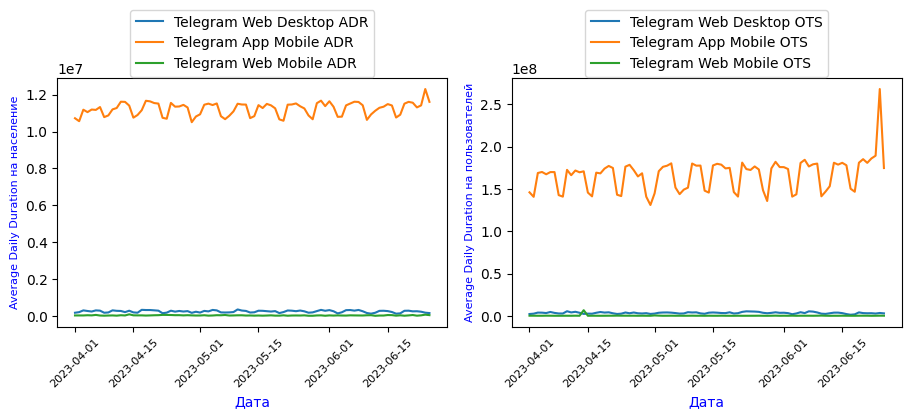

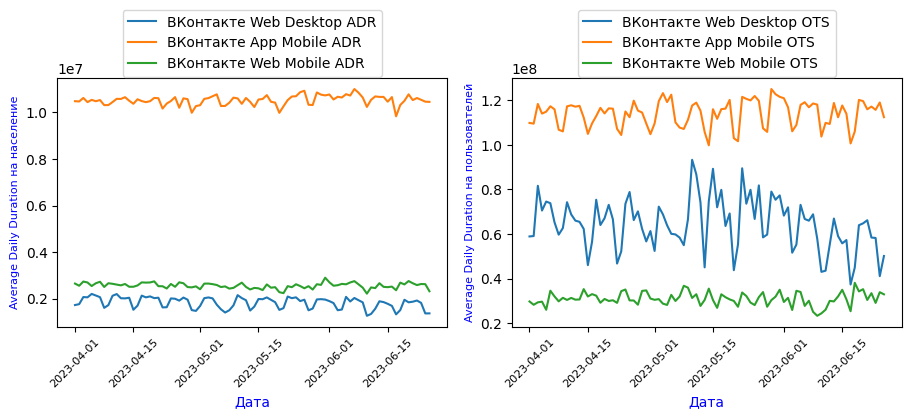

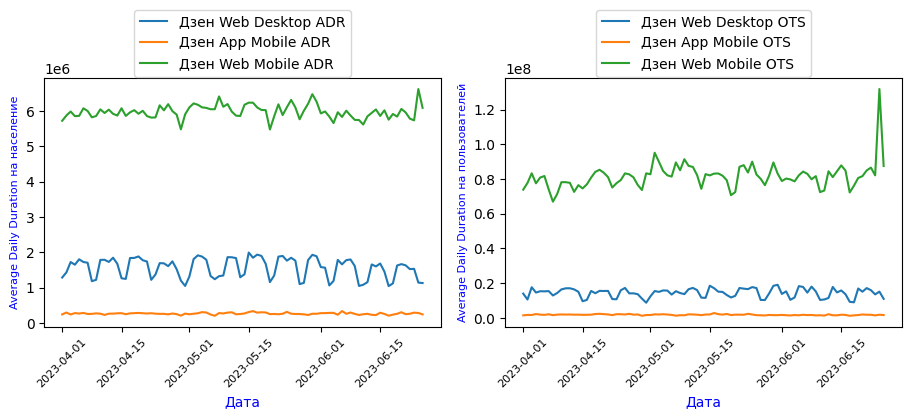

In [51]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_35, key, value)

**Отмечаем**, что данные от трех источников имеют разные масштабы:
* Для источника **Telegram**: *Telegram App Mobile ADR* и *Telegram App Mobile OTS* на порядок больше, чем *Telegram Web Desktop ADR*, *Telegram Web Desktop OTS*, *Telegram Web Mobile ADR* и *Telegram Web Mobile OTS*.
* Для источника **ВКонтакте**: *ВКонтакте App Mobile ADR*  на порядок больше, чем *ВКонтакте Web Desktop ADR* и *ВКонтакте Web Mobile ADR* .
* Для источника **Дзен**: самые большие значения имеют *Дзен Web Mobile ADR* и *Дзен Web Mobile OTS*
* Таким образом, сразу заметно, что пользователи предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR*. 
* Для всех трёх источников меньше пользуются *Web Desktop* (ПК и ноутбуки). Исключение - **люди в возрасте 'от 35 до 44 лет' применяют ПК и ноутбуки для поисков в *ВКонтакте Web Desktop OTS*.**

Так как абсолютные значения нас не интересуют, интересует только поведение измеряемых величин, приведём все значения к одному масштабу.

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
258,2023-04-01,8705000,1062550,10720000,730363,5520000,125600,6917200,58916700,10485100,109884600,10605600,148565000,5137200,69994000,3609000,58776000,5718700,73913900,35
259,2023-04-02,10350000,1264250,10559900,703810,5460000,128200,7068000,59096400,10472900,109568900,10232800,141161000,5718400,52928500,4411500,68908000,5868800,77751900,35
260,2023-04-03,15090000,1897950,11184000,844772,5420000,70800,8291200,81656000,10623600,118400900,10952000,146629500,6891200,88360000,3585000,67280000,5981100,83322300,35


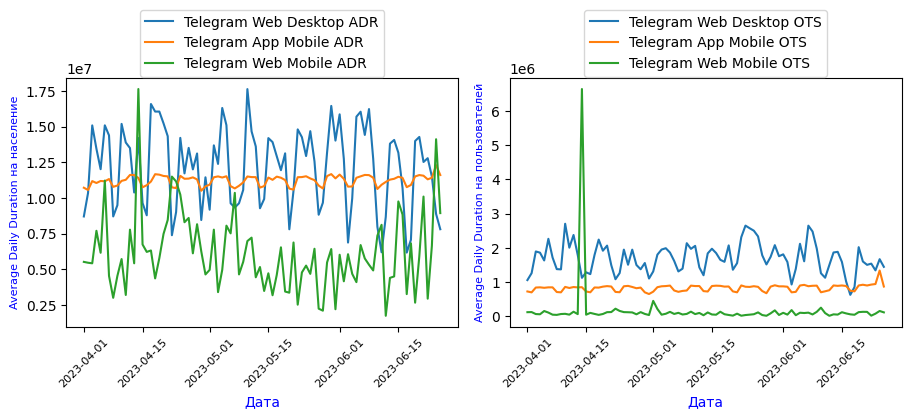

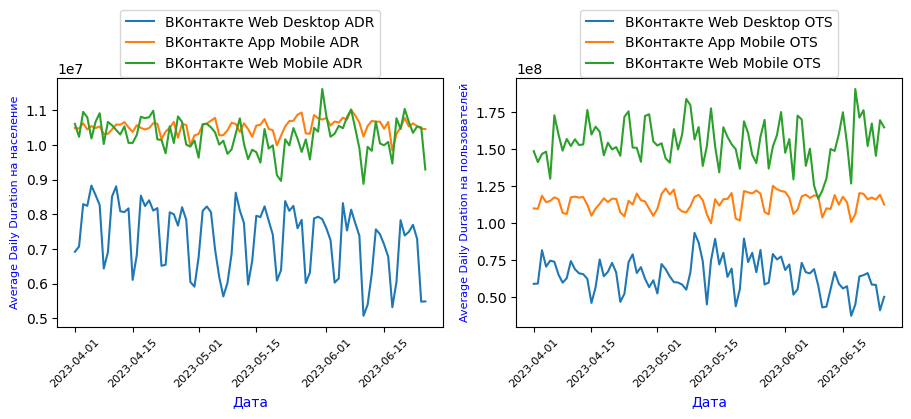

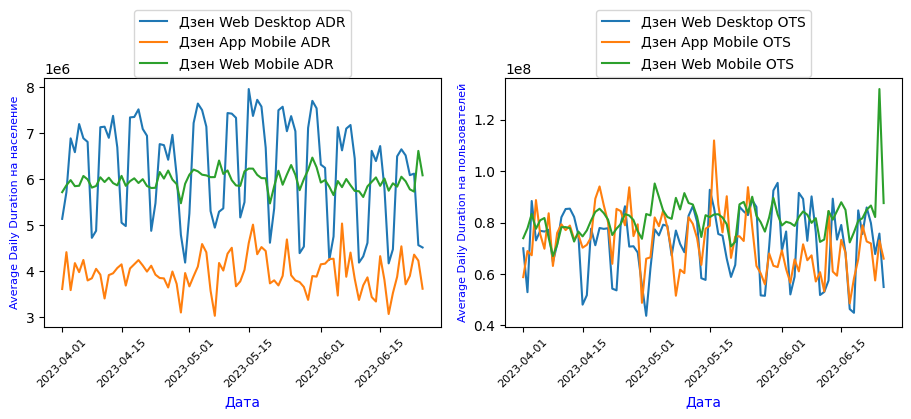

In [52]:
# Настроим, чтобы числа в датасетах отражались без знаков после запятой
pd.set_option('display.float_format', '{:.0f}'.format)

# Создадим врЕменный датафрейм
df_dro_35_tmp = df_dro_35.copy()

for i in range(len(coeff_scale)):
    df_dro_35_tmp[coeff_scale[i][0]] = df_dro_35_tmp[coeff_scale[i][0]].\
                                  apply(lambda x: x * coeff_scale[i][1])
display(df_dro_35_tmp.head(3))

for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_35_tmp, key, value)

# Удалим ненужный более датафрейм
del df_dro_35_tmp

По выровненным к одному масштабу значеням графикам распределения можно **отметить**:
* присутствие периодичности длительностью около 1 недели;
* наличие аномального выброса для **Telegram Web Mobile OTS**, аналогично выбросу в этом же признаке для всех младших категорий.

**Используем `Ящик с усами` ** для отображения статистической информации о распределении **Telegram Web Mobile OTS**, такие как медиана, квартили и аномальные значения:

Аномальное значение "Telegram Web Mobile OTS": 6,639,100.0


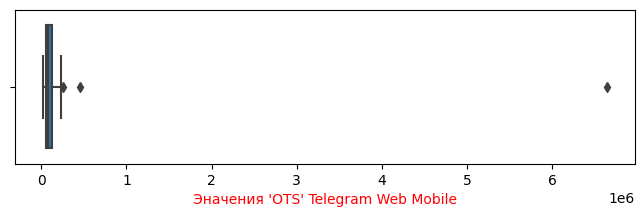

In [53]:
print('Аномальное значение "Telegram Web Mobile OTS":', 
      format_my(df_dro_35['Telegram Web Mobile OTS'].max()))

fig = plt.figure(figsize = (8,2))
sns.boxplot(df_dro_35['Telegram Web Mobile OTS'])
plt.xlabel("Эначения 'OTS' Telegram Web Mobile", fontsize=10, color='red')
plt.show;

**Отмечаем**:
* присутствие выбросов, то есть тех значений, которые находятся за пределами **75% перцентиль плюс 1.5 х МКР**,
* наличие аномального значения, на порядок превышающего все остальные значения.

In [54]:
# Выберем исследуемый признак:
tmp = df_dro_35['Telegram Web Mobile OTS']

# Отсотрируем, начиная с максимального по убыванию: 
display(tmp.sort_values(ascending = False).head(5))

271   6639100
288    455300
328    257500
279    227300
289    218400
Name: Telegram Web Mobile OTS, dtype: float64

In [55]:
# Посмотрим строку c индексом 271 с учётом того, что выше в общем 
# датасете есть 3 более младшие возрастные категории по 86 записей:
df_dro_35.iloc[[271-86*3]]

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
271,2023-04-14,284100,2256700,11406400,170944100,88200,6639100,2042200,62297200,10503900,112308800,2514500,35263400,1673800,15053000,271100,1881600,5867200,76492600,35


**Отмечаем**:
* строка, имеющая аномально высокое значение признака `Telegram Web Mobile OTS` имеет ту же дату регистрации 14 апреля 2023, как и в предыдущих выборках!

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/9 [00:00<?, ?it/s]

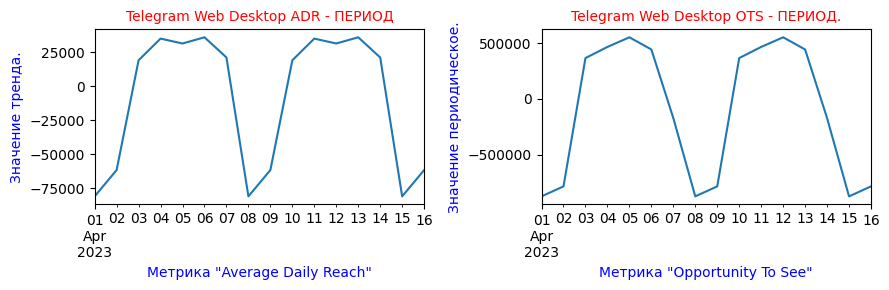

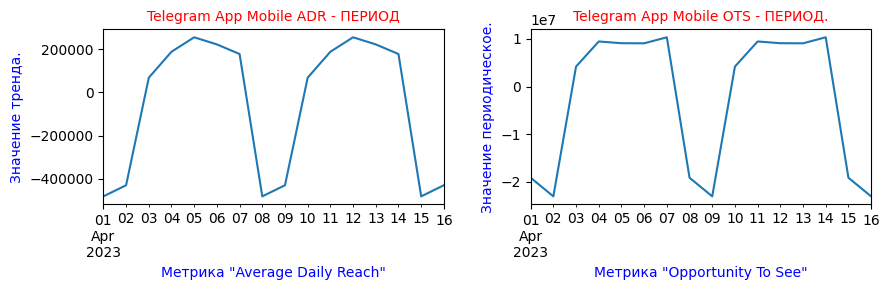

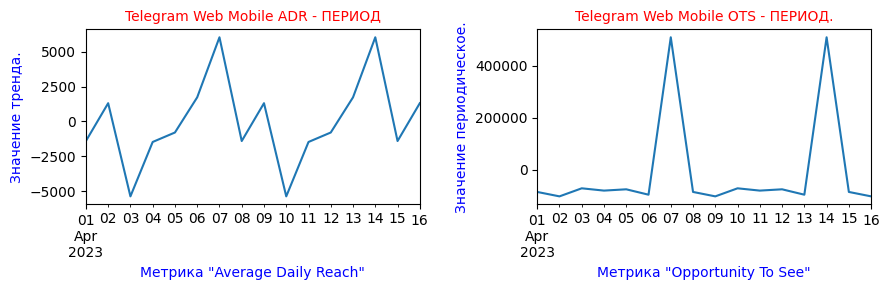

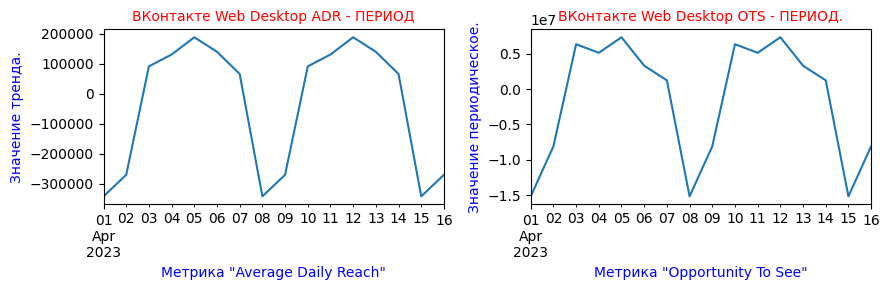

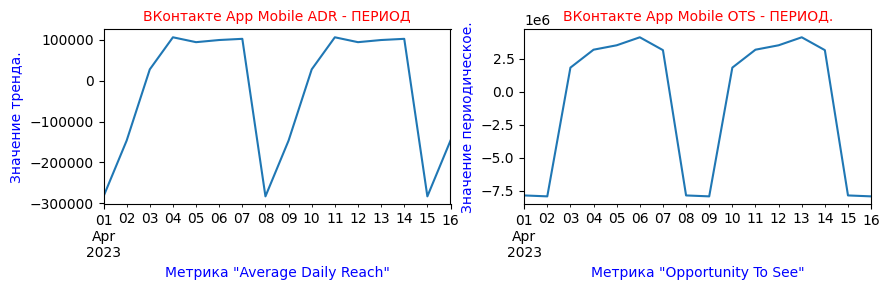

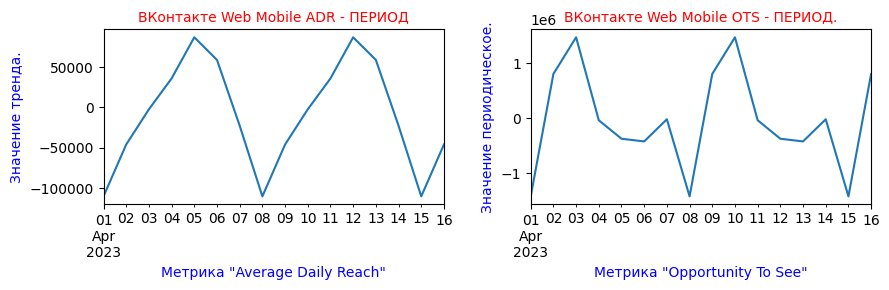

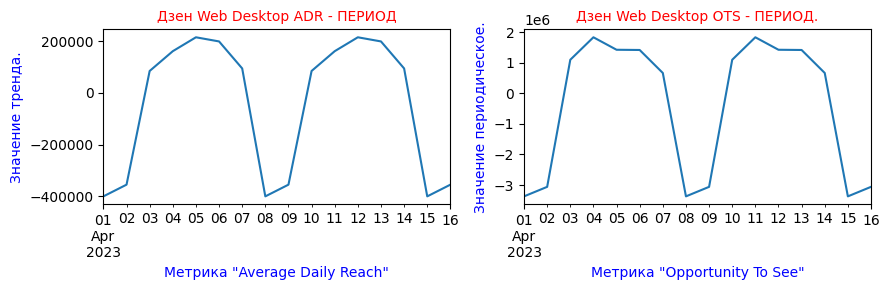

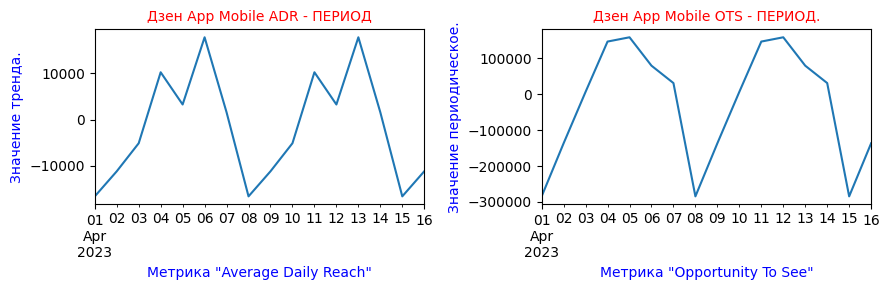

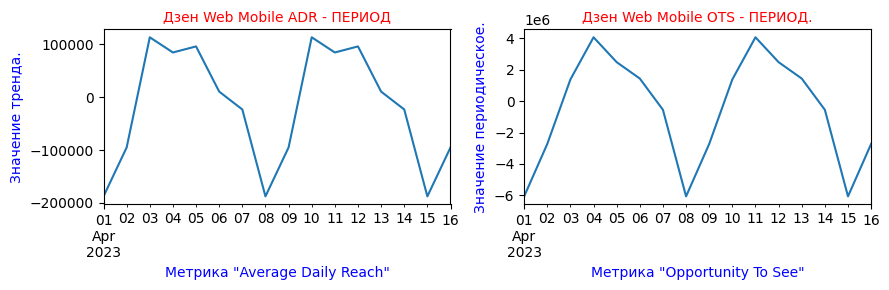

In [56]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dro_35, list_features)

**Отмечаем**:
* практически для всех источников информации для возрастной категории от 35 до 44 лет наблюдается то же самое, что людей всех младших категорий. В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И люди активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/9 [00:00<?, ?it/s]

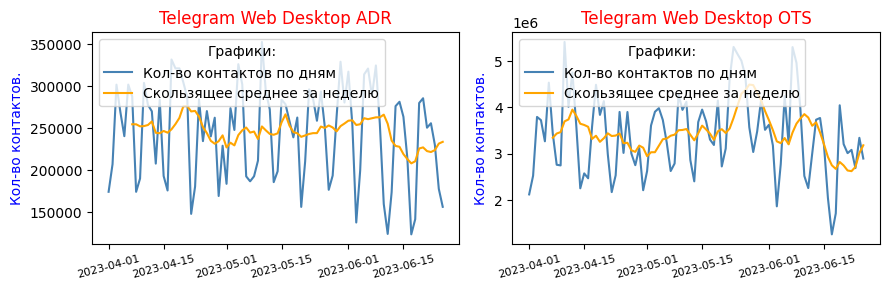

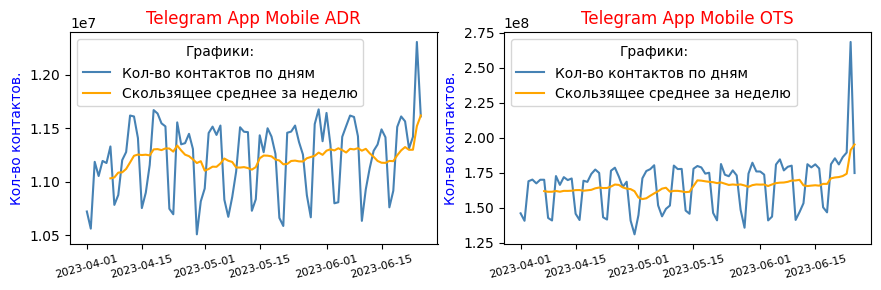

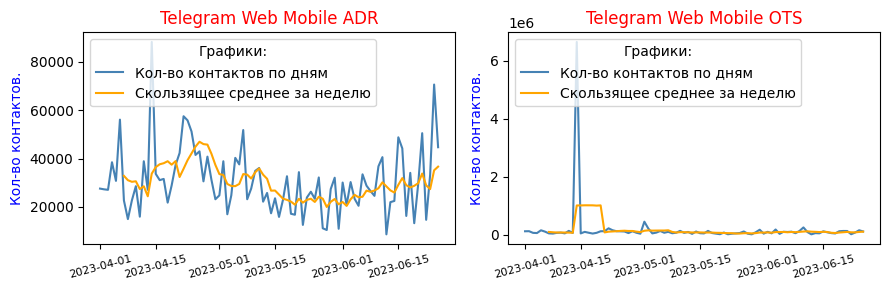

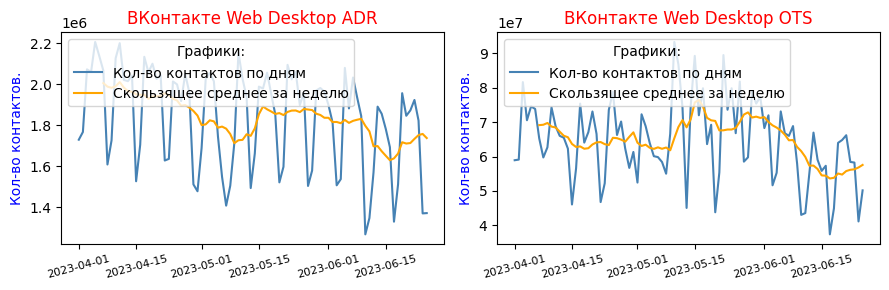

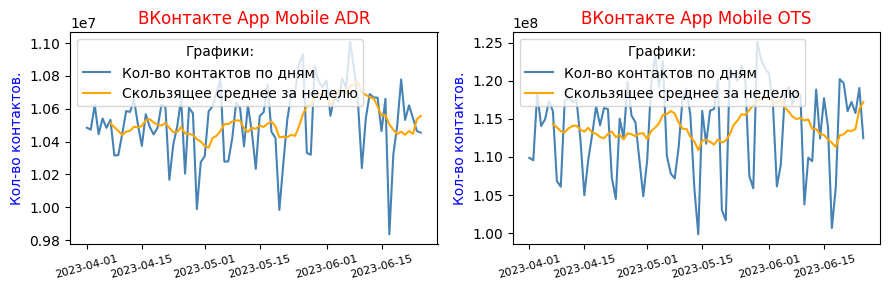

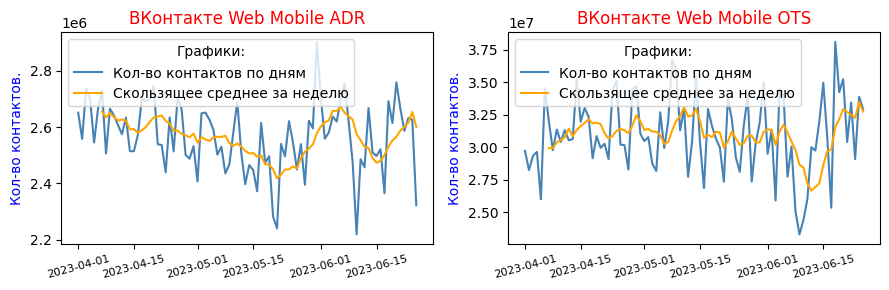

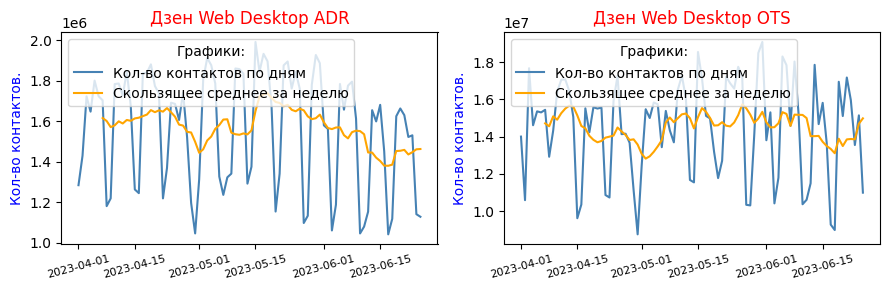

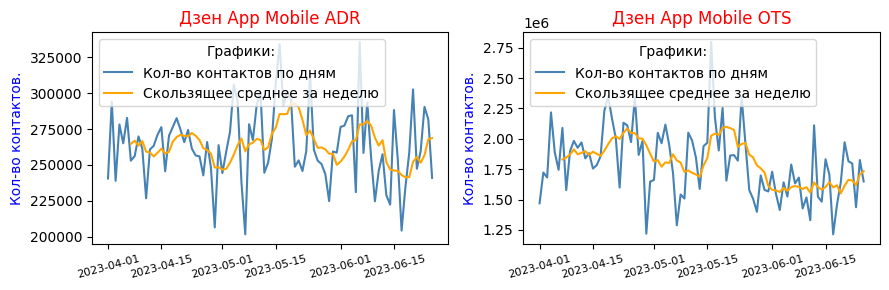

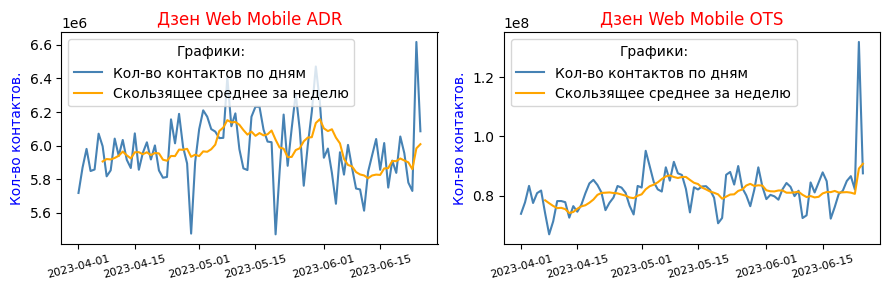

In [57]:
visual_stationarity_6(df_dro_35, list_features)

**Отмечаем**:
* возможное присутствие положительного тренда замечено только у *Telegram App Mobile*;
* для остальных источников данных тренд не замечен.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%)

In [58]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dro_35, list_features)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Telegram Web Desktop ADR,-2.307,0.170,-3.516,-2.899,НЕ стационарен!
1,Telegram Web Desktop OTS,-3.725,0.004,-3.514,-2.898,Стационарен.
2,Telegram App Mobile ADR,-0.872,0.797,-3.516,-2.899,НЕ стационарен!
3,Telegram App Mobile OTS,0.787,0.991,-3.516,-2.899,НЕ стационарен!
4,Telegram Web Mobile ADR,-1.559,0.504,-3.517,-2.899,НЕ стационарен!
5,Telegram Web Mobile OTS,-9.311,0.000,-3.510,-2.896,Стационарен.
6,ВКонтакте Web Desktop ADR,-1.454,0.556,-3.517,-2.899,НЕ стационарен!
7,ВКонтакте Web Desktop OTS,-1.242,0.655,-3.517,-2.899,НЕ стационарен!
8,ВКонтакте App Mobile ADR,-1.719,0.421,-3.516,-2.899,НЕ стационарен!
9,ВКонтакте App Mobile OTS,-3.212,0.019,-3.522,-2.901,Стационарен.


**Промежуточные выводы** для всех источников **'Telegram', 'ВКонтакте', 'Дзен'** по возрастной группе **от 35 до 44 лет**:
* Люди предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR* и совсем редко пользуются *Web Desktop* (ПК и ноутбуки).
* **Люди в возрасте 'от 35 до 44 лет' применяют ПК и ноутбуки для поисков в *ВКонтакте Web Desktop OTS*.**
* Присутствие периодичности длительностью около 1 недели. Аналогично ведут себя все более младшие люди.
* Замечено наличие аномального значения:
    * На порядок превышающего все остальные, в "Telegram Web Mobile OTS"
    * Такое значение находятся за пределами 75% перцентиль плюс 1.5 х МКР (межквартильный размах).
    * Строка, имеющая аномально высокое значение признака "Telegram Web Mobile OTS" имеет дату регистрации 14 апреля 2023. В этот же день и по этому же признаку был аномальный выброс и для всех более младших групп людей!
* Практически для всех источников информации в группе от 35 до 44 лет наблюдается та же самая  картина, как и у более младших людей! В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к Telegram, ВКонтакте и Дзен в рабочие дни.
* Тест проверку стационарности предполагает тренд в источниках по возрастной категории 'от 35 до 44 лет':
    * *Telegram Web Desktop ADR*;
    * *Telegram App Mobile ADR*;
    * *Telegram App Mobile OTS*;
    * *Telegram Web Mobile ADR*,
    * *ВКонтакте Web Desktop ADR*;   
    * *ВКонтакте Web Desktop OTS*,
    * *Дзен Web Desktop ADR*;
    * *Дзен Web Desktop OTS*.   
    Для всех этих источников *нулевая гиротеза* не опровергнута.   
    Для остальных источников *нулевая гипотеза* опровергнута и принята альтернативная гипотеза об отсутствии тренда.

In [59]:
# уберем из памяти ненужный более датафрейм.
del df_dro_35

### 4.7. Анализ `ADR` и `OTS` по возрастной категории 'от 45 до 55 лет'.

Выделим из полного датафрейма, по всем возрастным группам, те записи, которые соответствуют выбранной возрастной группе.

In [60]:
print("Размер полного датафрейма:", df_dro.shape)

df_dro_45 = df_dro[df_dro.age == 45]
if (df_dro.shape[0] / 6 == df_dro_45.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'от 45 до 55 лет':", 
      df_dro_45.shape)
df_dro_45.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'от 45 до 55 лет': (86, 20)


,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
344,2023-04-01,106100.000,808700.000,7151500.000,85224000.000,27700.000,277300.000,1368200.000,42561700.000,6481300.000,60018000.000,1588500.000,13024200.000,1383400.000,13333300.000,292600.000,1271900.000,4815500.000,74602000.000,45
345,2023-04-02,135500.000,631200.000,7272900.000,87381500.000,39200.000,93600.000,1521200.000,65600500.000,6398700.000,62516300.000,1477100.000,14902800.000,1432200.000,14615800.000,283100.000,1499100.000,4845800.000,79409900.000,45
346,2023-04-03,168500.000,1099300.000,7533800.000,97691500.000,41100.000,115200.000,1751700.000,64642500.000,6302600.000,62142000.000,1555300.000,11975600.000,1648300.000,18192400.000,337300.000,1654300.000,4931400.000,82253400.000,45


### 4.7.1. Графическое представление метрик `ADR` и `OTS` по возрастной  категории 'от 45 до 55 лет'.

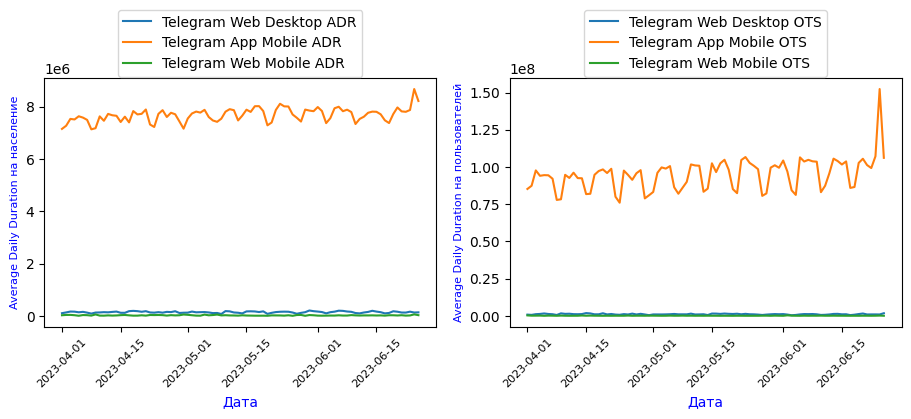

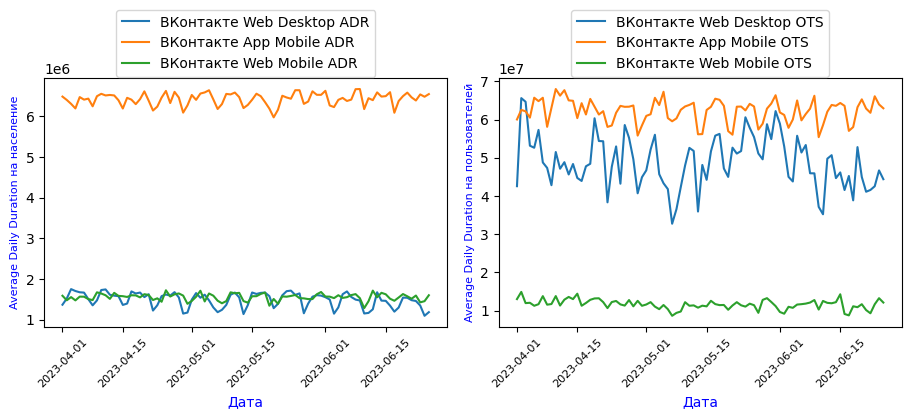

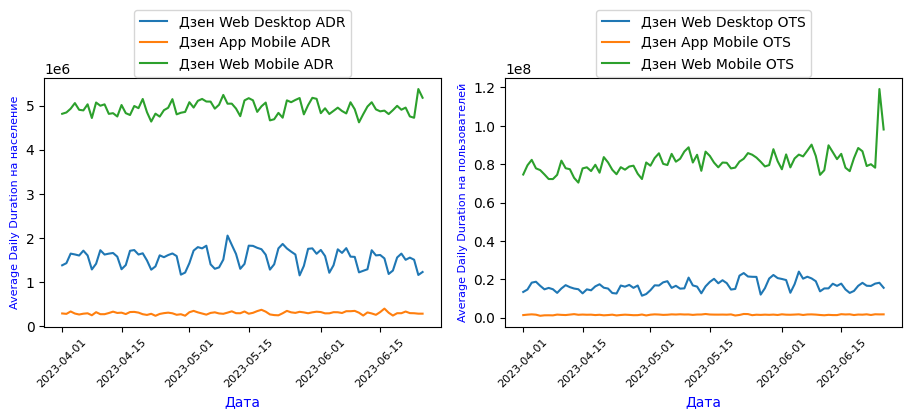

In [61]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_45, key, value)

**Отмечаем**, что данные от трех источников имеют разные масштабы:
* Для источника **Telegram**: *Telegram App Mobile ADR* и *Telegram App Mobile OTS* на порядок больше, чем *Telegram Web Desktop ADR*, *Telegram Web Desktop OTS*, *Telegram Web Mobile ADR* и *Telegram Web Mobile OTS*.
* Для источника **ВКонтакте**: *ВКонтакте App Mobile ADR*  на порядок больше, чем *ВКонтакте Web Desktop ADR* и *ВКонтакте Web Mobile ADR* .
* Для источника **Дзен**: самые большие значения имеют *Дзен Web Mobile ADR* и *Дзен Web Mobile OTS*
* Таким образом, сразу заметно, что пользователи предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR*. 
* Для всех трёх источников меньше пользуются *Web Desktop* (ПК и ноутбуки). Исключение - **люди в возрасте 'от 35 до 44 лет' активно применяют ПК и ноутбуки для поисков в *ВКонтакте Web Desktop OTS*.**

Так как абсолютные значения нас не интересуют, интересует только поведение измеряемых величин, приведём все значения к одному масштабу.

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
344,2023-04-01,5305000,404350,7151500,426120,5540000,277300,5472800,42561700,6481300,60018000,6354000,65121000,5533600,66666500,4389000,50876000,4815500,74602000,45
345,2023-04-02,6775000,315600,7272900,436908,7840000,93600,6084800,65600500,6398700,62516300,5908400,74514000,5728800,73079000,4246500,59964000,4845800,79409900,45
346,2023-04-03,8425000,549650,7533800,488458,8220000,115200,7006800,64642500,6302600,62142000,6221200,59878000,6593200,90962000,5059500,66172000,4931400,82253400,45


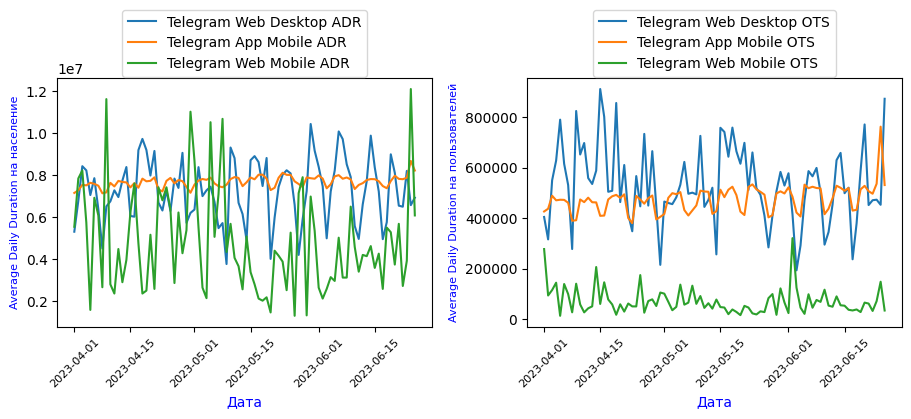

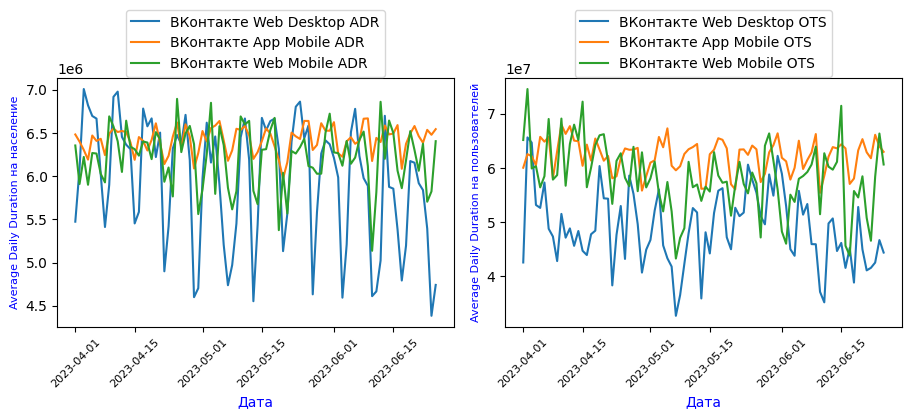

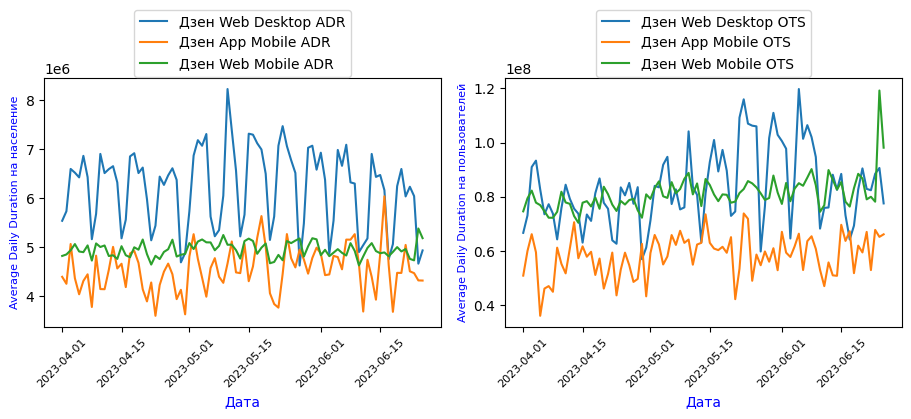

In [62]:
# Настроим, чтобы числа в датасетах отражались без знаков после запятой
pd.set_option('display.float_format', '{:.0f}'.format)

# Создадим врЕменный датафрейм
df_dro_45_tmp = df_dro_45.copy()

for i in range(len(coeff_scale)):
    df_dro_45_tmp[coeff_scale[i][0]] = df_dro_45_tmp[coeff_scale[i][0]].\
                                  apply(lambda x: x * coeff_scale[i][1])
display(df_dro_45_tmp.head(3))

for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_45_tmp, key, value)

# Удалим ненужный более датафрейм
del df_dro_45_tmp

По выровненным к одному масштабу значеням графикам распределения можно **отметить**:
* присутствие периодичности длительностью около 1 недели;
* **ОТСУТСТВИЕ** аномального выброса для **Telegram Web Mobile OTS**, в отличие от всех более  младших категорий людей.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/9 [00:00<?, ?it/s]

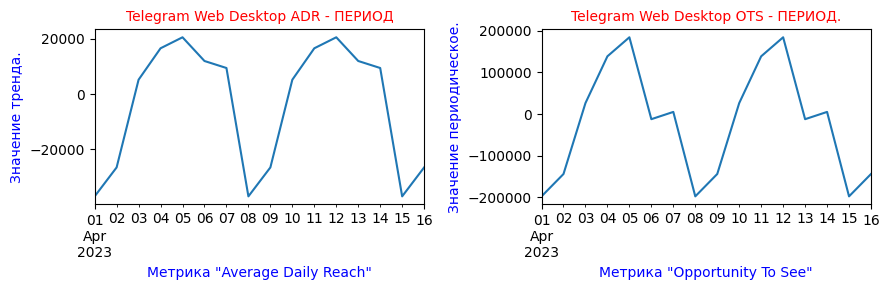

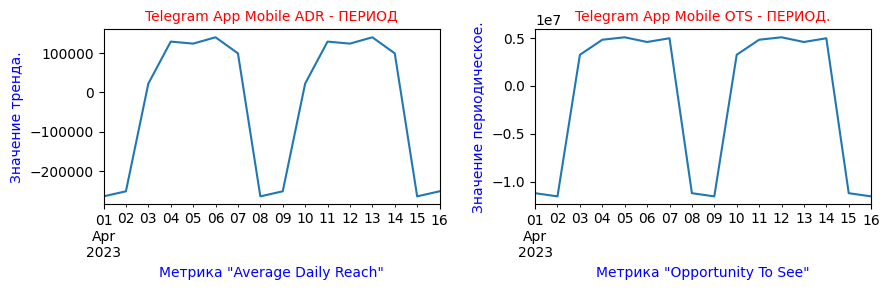

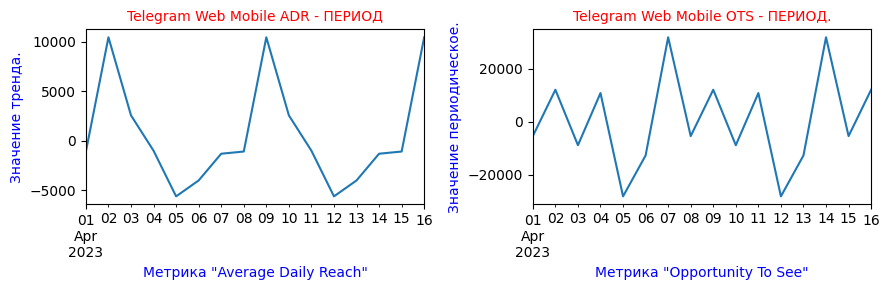

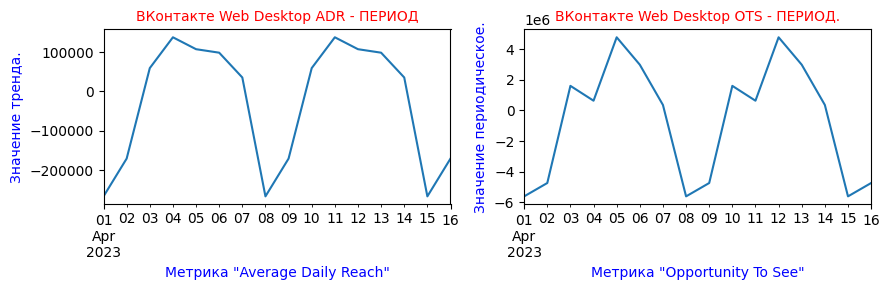

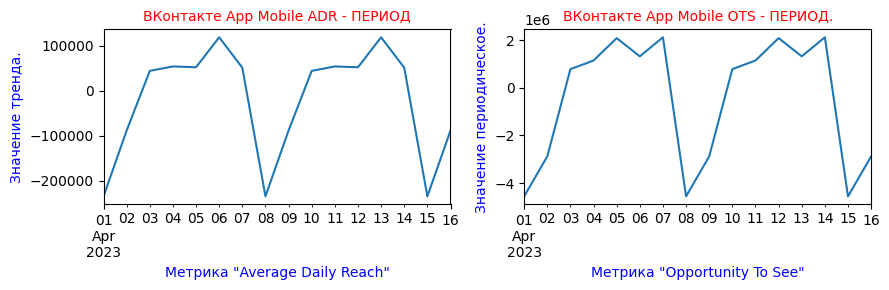

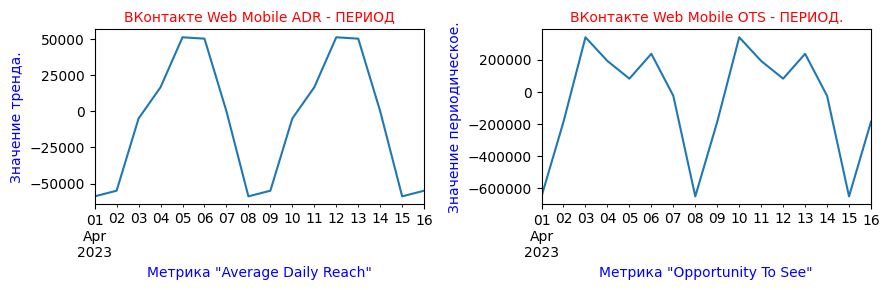

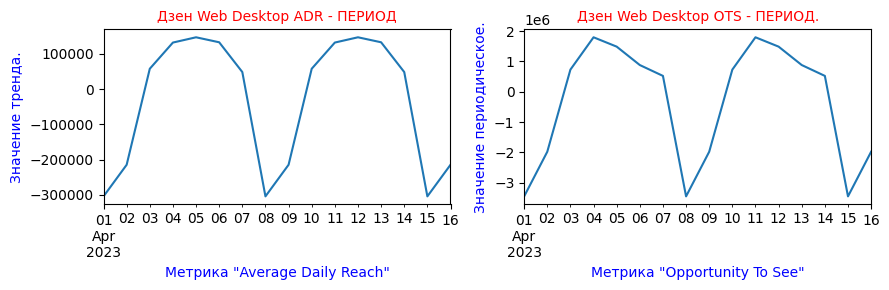

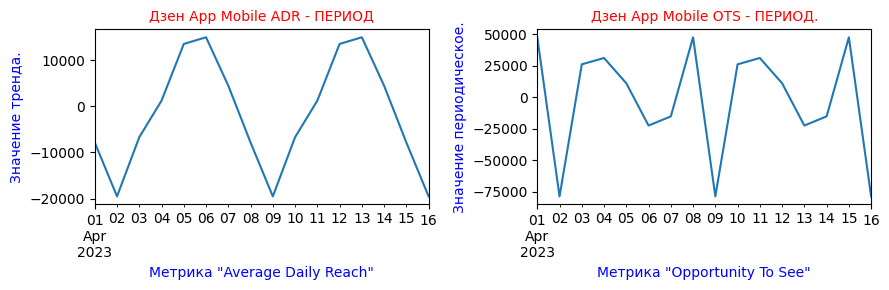

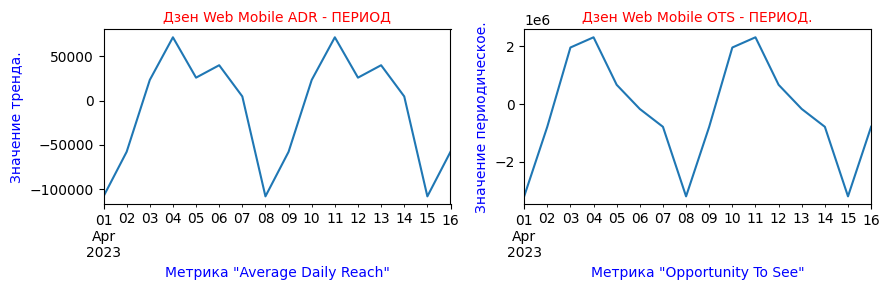

In [63]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dro_45, list_features)

**Отмечаем**:
* практически для всех источников информации для возрастной категории от 45 до 55 лет наблюдается то же самое, что людей всех младших категорий. В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И люди активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/9 [00:00<?, ?it/s]

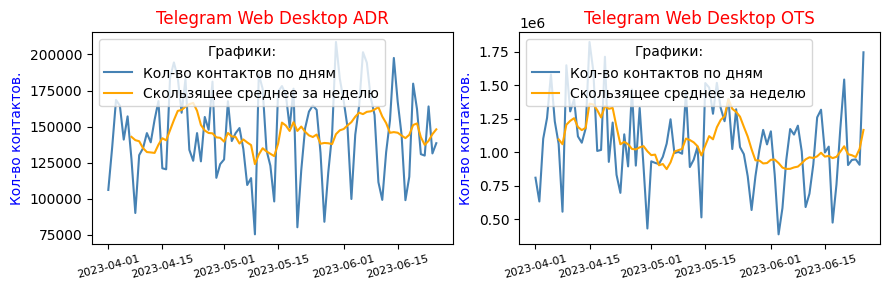

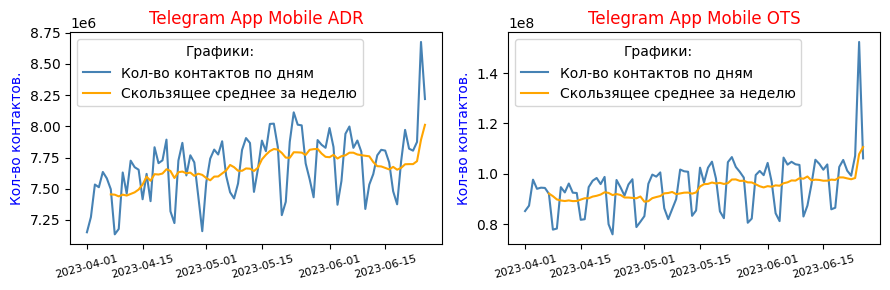

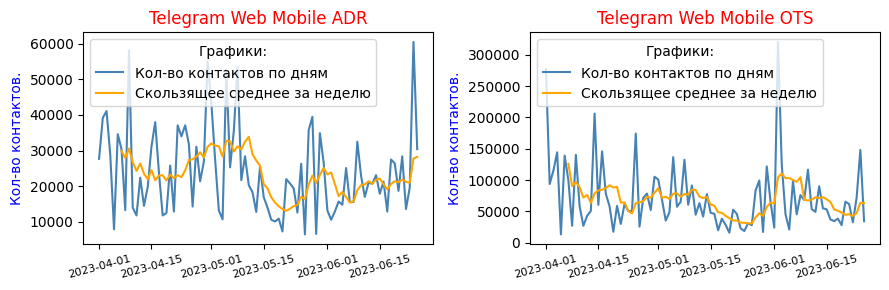

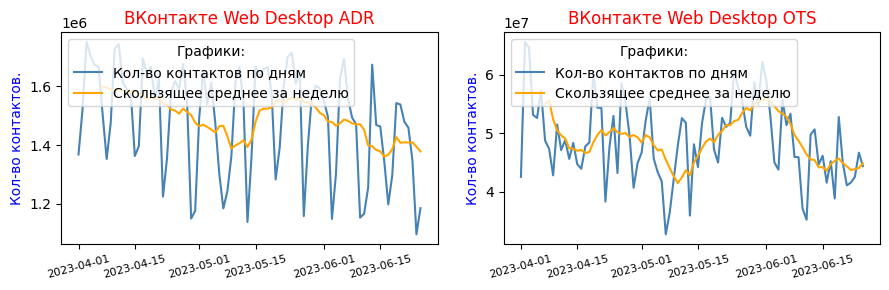

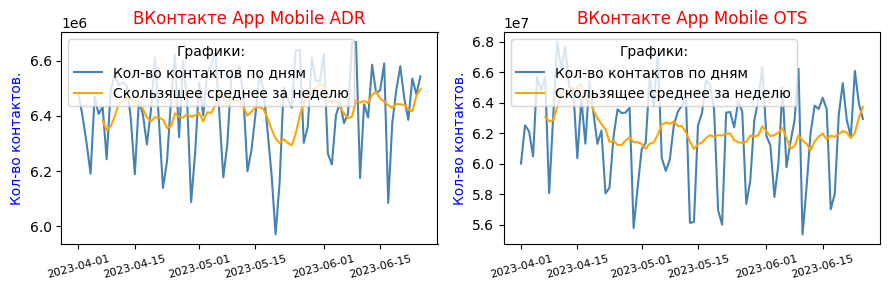

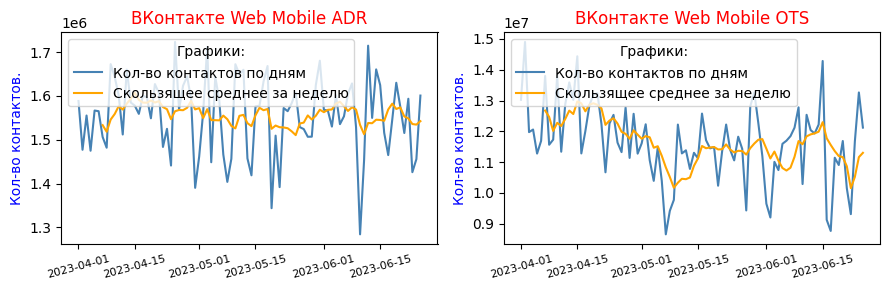

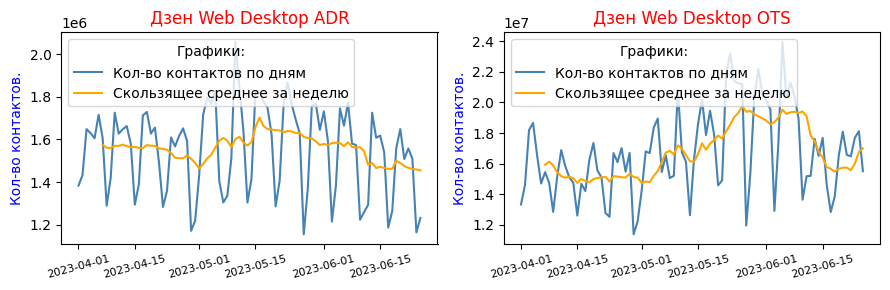

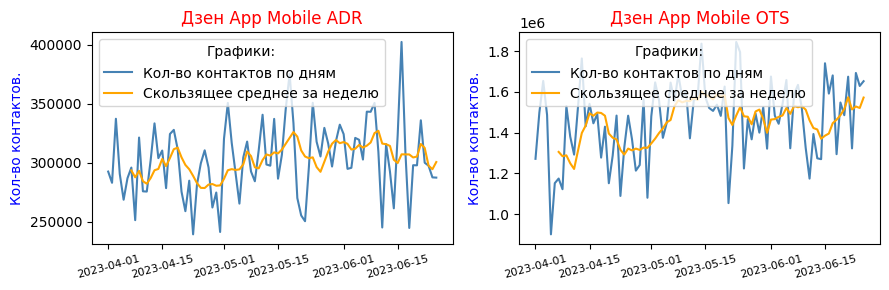

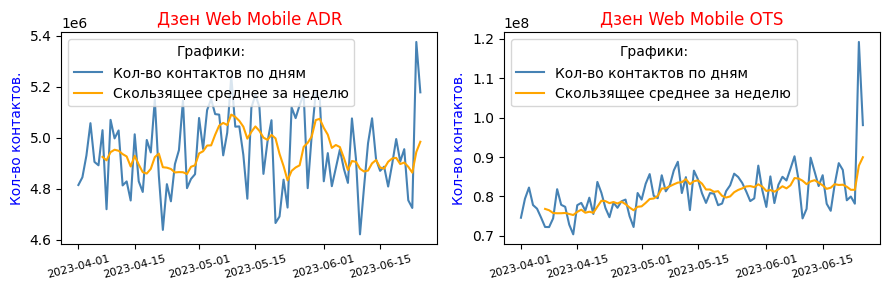

In [64]:
visual_stationarity_6(df_dro_45, list_features)

**Отмечаем**:
* возможное присутствие положительного тренда замечено только у *Telegram App Mobile* и *Дзен Web Mobile*;
* для остальных источников данных тренд не замечен.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%)

In [65]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dro_45, list_features)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Telegram Web Desktop ADR,-7.431,0.000,-3.512,-2.897,Стационарен.
1,Telegram Web Desktop OTS,-6.783,0.000,-3.510,-2.896,Стационарен.
2,Telegram App Mobile ADR,-0.924,0.780,-3.516,-2.899,НЕ стационарен!
3,Telegram App Mobile OTS,0.460,0.984,-3.516,-2.899,НЕ стационарен!
4,Telegram Web Mobile ADR,-1.924,0.321,-3.516,-2.899,НЕ стационарен!
5,Telegram Web Mobile OTS,-9.966,0.000,-3.510,-2.896,Стационарен.
6,ВКонтакте Web Desktop ADR,-1.153,0.693,-3.523,-2.902,НЕ стационарен!
7,ВКонтакте Web Desktop OTS,-2.442,0.130,-3.519,-2.900,НЕ стационарен!
8,ВКонтакте App Mobile ADR,-3.199,0.020,-3.517,-2.899,Стационарен.
9,ВКонтакте App Mobile OTS,-1.759,0.401,-3.516,-2.899,НЕ стационарен!


**Промежуточные выводы** для всех источников **'Telegram', 'ВКонтакте', 'Дзен'** по возрастной группе **от 45 до 55 лет**:
* Люди предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR* и совсем редко пользуются *Web Desktop* (ПК и ноутбуки).
* Люди в возрасте 'от 35 до 44 лет' применяют ПК и ноутбуки для поисков в *ВКонтакте Web Desktop OTS*, а **люди в возрасте 'от 45 до 55 лет' применяют ПК и ноутбуки очень активно!**
* Присутствие периодичности длительностью около 1 недели. Аналогично ведут себя все более младшие люди.
* Наличие аномального значения не выявлено!
* Практически для всех источников информации в группе от 45 до 55 лет наблюдается та же самая  картина, как и у более младших людей! В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к Telegram, ВКонтакте и Дзен в рабочие дни.
* Тест проверку стационарности предполагает тренд в источниках по возрастной категории 'от 45 до 55 лет':
    * *Telegram App Mobile ADR*;
    * *Telegram App Mobile OTS*;
    * *Telegram Web Mobile ADR*;
    * *ВКонтакте Web Desktop ADR*,
    * *ВКонтакте Web Desktop OTS*;   
    * *ВКонтакте App Mobile OTS*,
    * *Дзен Web Desktop ADR*;
    * *Дзен Web Desktop OTS*;
    * *Дзен Web Mobile OTS*.   
    Для всех этих источников *нулевая гиротеза* не опровергнута.   
    Для остальных источников *нулевая гипотеза* опровергнута и принята альтернативная гипотеза об отсутствии тренда.

In [66]:
# уберем из памяти ненужный более датафрейм.
del df_dro_45

### 4.8. Анализ `ADR` и `OTS` по возрастной категории 'от 55 лет'.

Выделим из полного датафрейма, по всем возрастным группам, те записи, которые соответствуют выбранной возрастной группе.

In [67]:
print("Размер полного датафрейма:", df_dro.shape)

df_dro_55 = df_dro[df_dro.age == 55]
if (df_dro.shape[0] / 6 == df_dro_55.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'от 55 лет':", 
      df_dro_55.shape)
df_dro_55.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'от 55 лет': (86, 20)


,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
430,2023-04-01,103600.000,428600.000,7910000.000,72585000.000,15000.000,61600.000,1740600.000,38480800.000,6224100.000,48256900.000,2170500.000,13523300.000,2749400.000,37673600.000,783100.000,3772100.000,7866700.000,160823800.000,55
431,2023-04-02,107900.000,290500.000,8255900.000,75829700.000,60300.000,64900.000,1924400.000,62609600.000,6163900.000,52478800.000,2025400.000,9694900.000,2793800.000,40211300.000,875000.000,4515400.000,7974300.000,163560800.000,55
432,2023-04-03,107000.000,423700.000,8366000.000,82780600.000,62900.000,157700.000,1961700.000,44494600.000,6291100.000,53490500.000,1819900.000,11941000.000,3247800.000,47181400.000,798600.000,4590100.000,8404100.000,156795200.000,55


### 4.8.1. Графическое представление метрик `ADR` и `OTS` по возрастной  категории 'от 55 лет'.

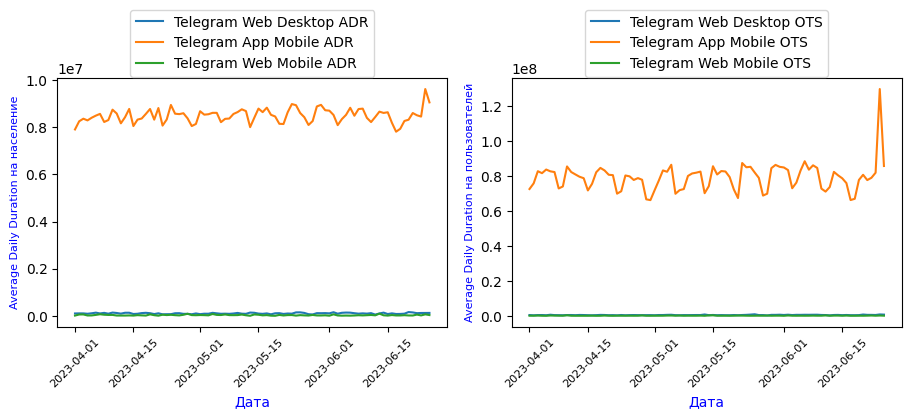

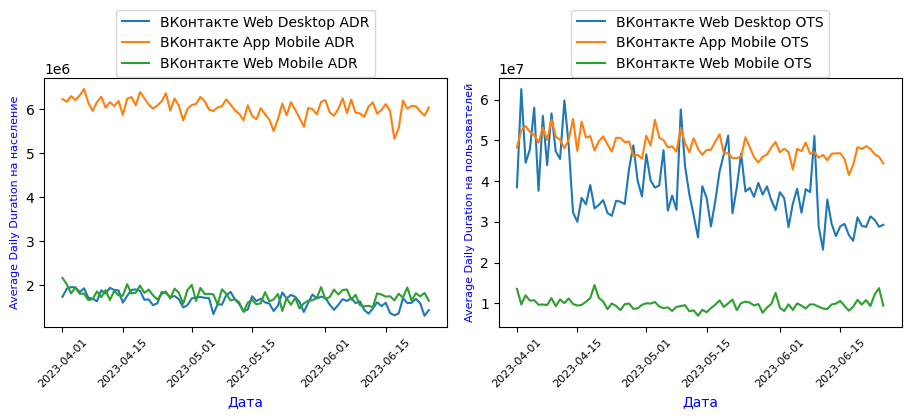

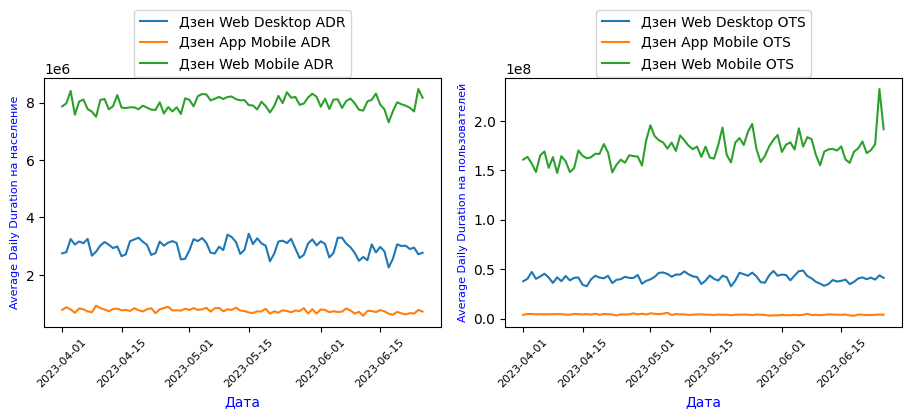

In [68]:
for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_55, key, value)

**Отмечаем**, что данные от трех источников имеют разные масштабы:
* Для источника **Telegram**: *Telegram App Mobile ADR* и *Telegram App Mobile OTS* на порядок больше, чем *Telegram Web Desktop ADR*, *Telegram Web Desktop OTS*, *Telegram Web Mobile ADR* и *Telegram Web Mobile OTS*.
* Для источника **ВКонтакте**: *ВКонтакте App Mobile ADR*  на порядок больше, чем *ВКонтакте Web Desktop ADR* и *ВКонтакте Web Mobile ADR* .
* Для источника **Дзен**: самые большие значения имеют *Дзен Web Mobile ADR* и *Дзен Web Mobile OTS*
* Таким образом, сразу заметно, что пользователи предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR*. 
* Для всех трёх источников меньше пользуются *Web Desktop* (ПК и ноутбуки). Исключение - **люди в возрасте 'от 55 лет' также активно применяют ПК и ноутбуки для поисков в *ВКонтакте Web Desktop OTS*, как и люди категории 'от 45 до 55 лет'.**

Так как абсолютные значения нас не интересуют, интересует только поведение измеряемых величин, приведём все значения к одному масштабу.

,Date,Telegram Web Desktop ADR,Telegram Web Desktop OTS,Telegram App Mobile ADR,Telegram App Mobile OTS,Telegram Web Mobile ADR,Telegram Web Mobile OTS,ВКонтакте Web Desktop ADR,ВКонтакте Web Desktop OTS,ВКонтакте App Mobile ADR,ВКонтакте App Mobile OTS,ВКонтакте Web Mobile ADR,ВКонтакте Web Mobile OTS,Дзен Web Desktop ADR,Дзен Web Desktop OTS,Дзен App Mobile ADR,Дзен App Mobile OTS,Дзен Web Mobile ADR,Дзен Web Mobile OTS,age
430,2023-04-01,5180000,214300,7910000,362925,3000000,61600,6962400,38480800,6224100,48256900,8682000,67616500,10997600,188368000,11746500,150884000,7866700,160823800,55
431,2023-04-02,5395000,145250,8255900,379148,12060000,64900,7697600,62609600,6163900,52478800,8101600,48474500,11175200,201056500,13125000,180616000,7974300,163560800,55
432,2023-04-03,5350000,211850,8366000,413903,12580000,157700,7846800,44494600,6291100,53490500,7279600,59705000,12991200,235907000,11979000,183604000,8404100,156795200,55


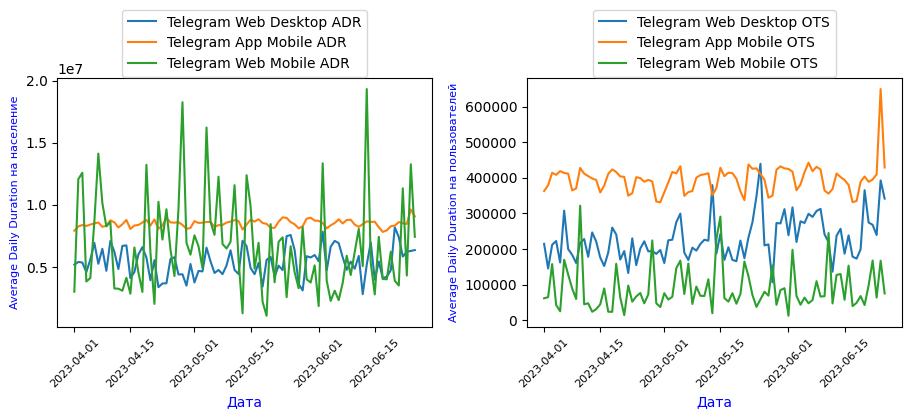

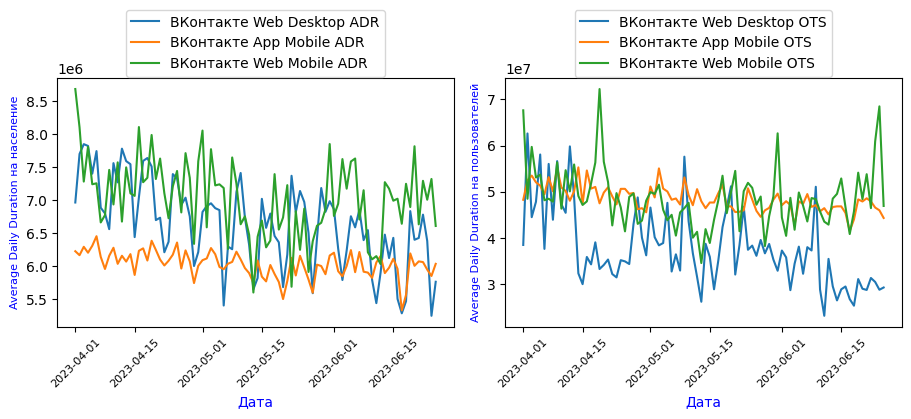

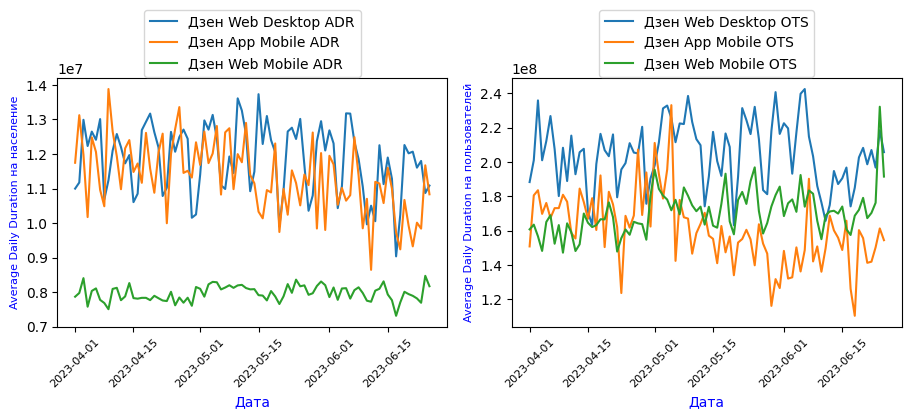

In [69]:
# Настроим, чтобы числа в датасетах отражались без знаков после запятой
pd.set_option('display.float_format', '{:.0f}'.format)

# Создадим врЕменный датафрейм
df_dro_55_tmp = df_dro_55.copy()

for i in range(len(coeff_scale)):
    df_dro_55_tmp[coeff_scale[i][0]] = df_dro_55_tmp[coeff_scale[i][0]].\
                                  apply(lambda x: x * coeff_scale[i][1])
display(df_dro_55_tmp.head(3))

for key, value in dict_columns.items():
    plot_average_daily_duration(df_dro_55_tmp, key, value)

# Удалим ненужный более датафрейм
del df_dro_55_tmp

По выровненным к одному масштабу значеням графикам распределения можно **отметить**:
* присутствие периодичности длительностью около 1 недели;
* **ОТСУТСТВИЕ** аномального выброса для **Telegram Web Mobile OTS**, в отличие от всех более  младших категорий людей.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/9 [00:00<?, ?it/s]

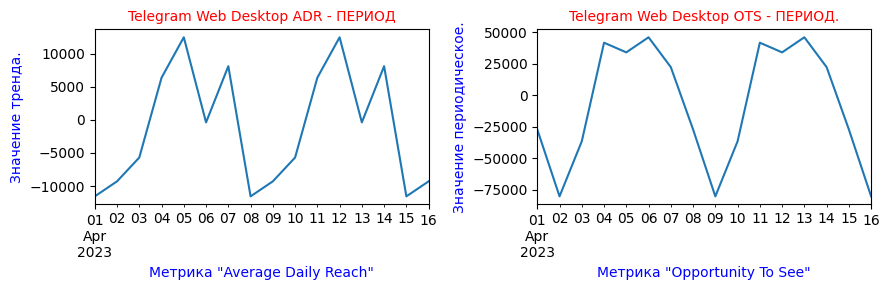

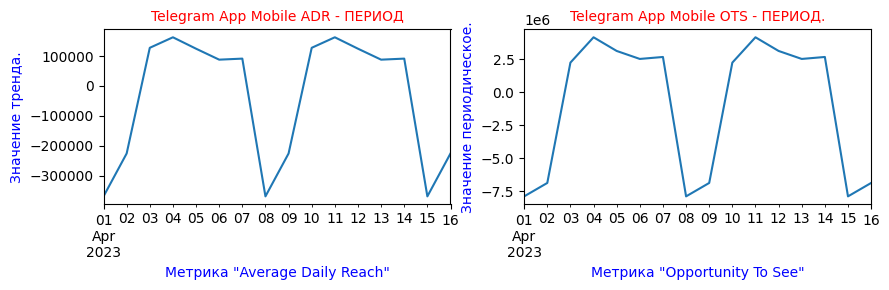

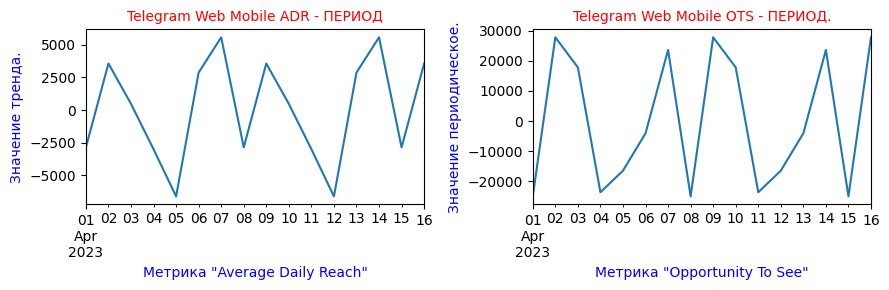

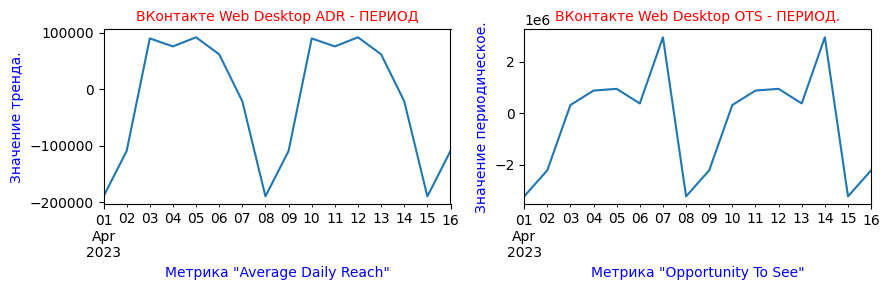

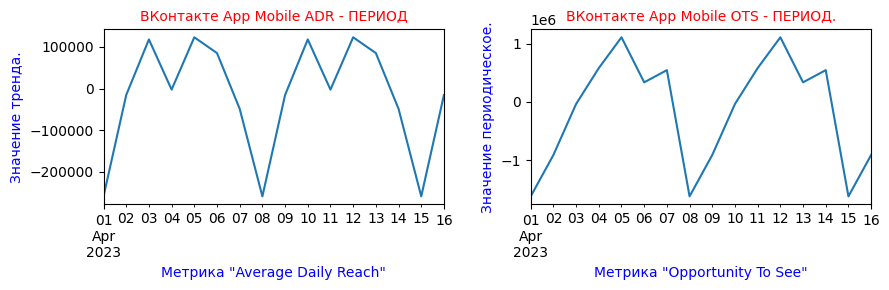

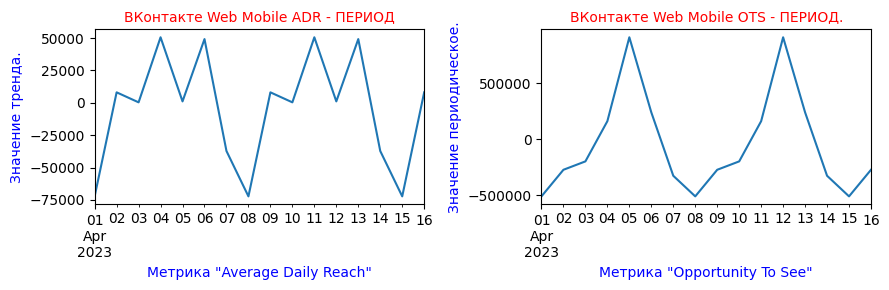

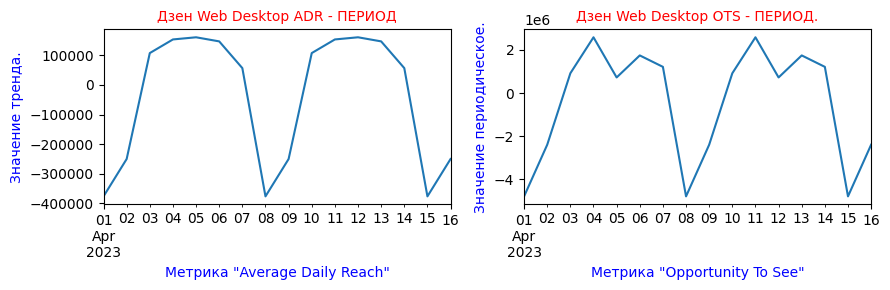

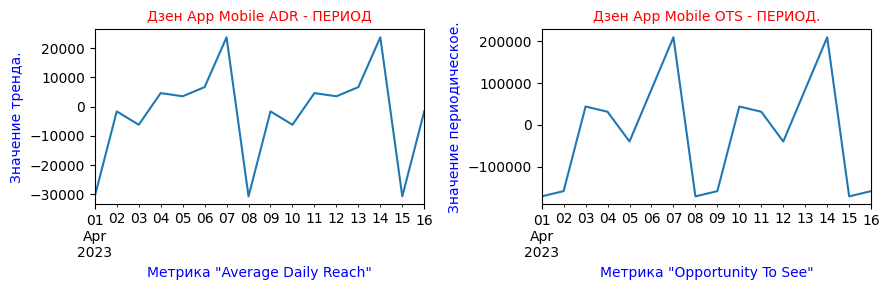

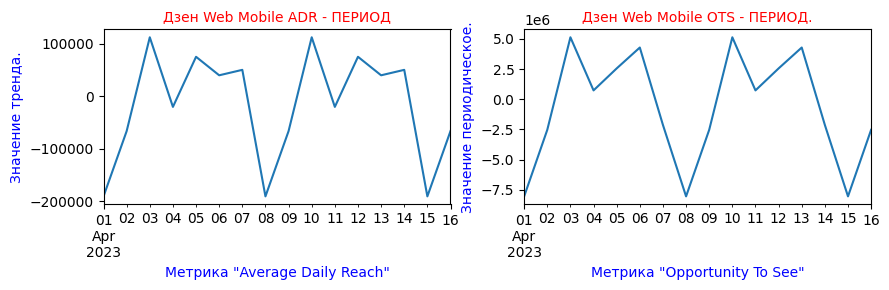

In [70]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dro_55, list_features)

**Отмечаем**:
* практически для всех источников информации для возрастной категории 'от 55 лет' наблюдается то же самое, что людей всех младших категорий. В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И люди активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни. Исключение *Telegram Web Mobile*.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/9 [00:00<?, ?it/s]

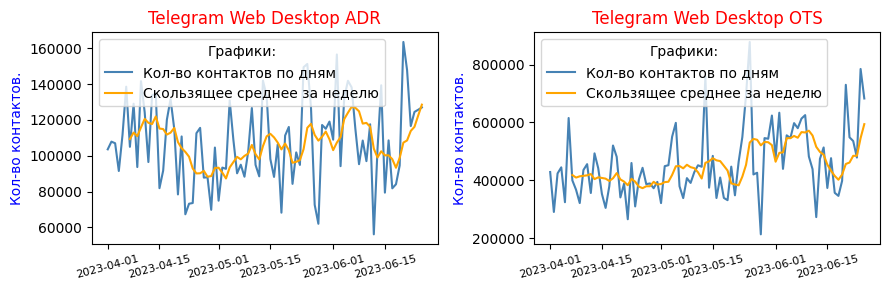

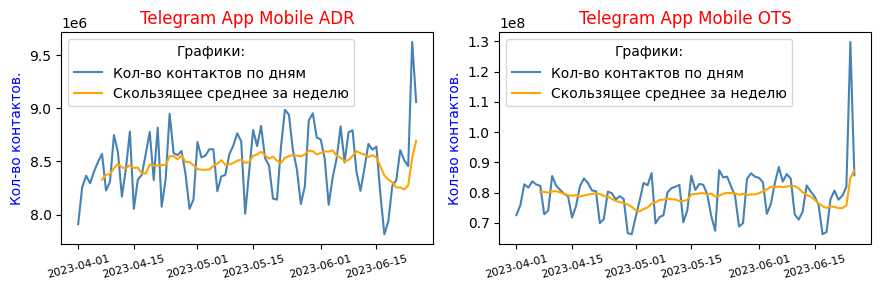

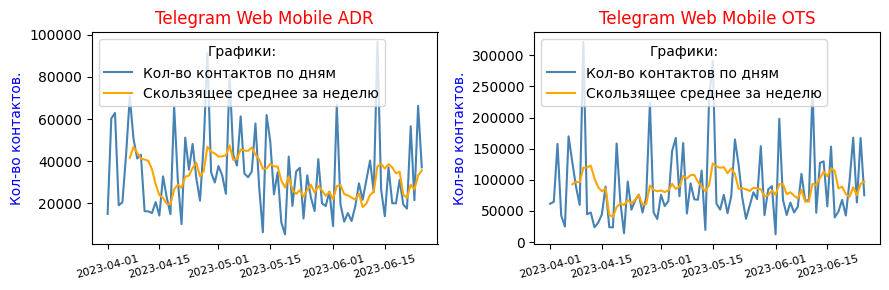

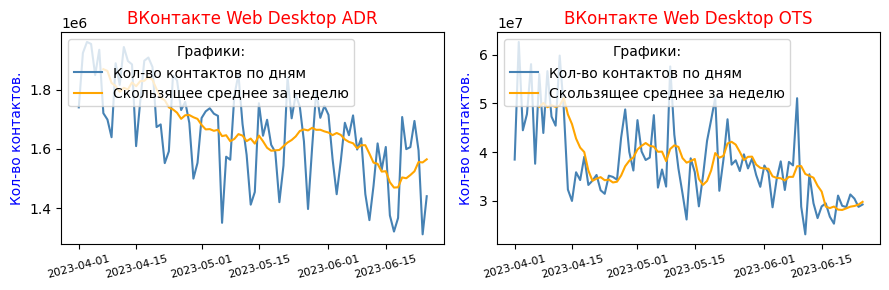

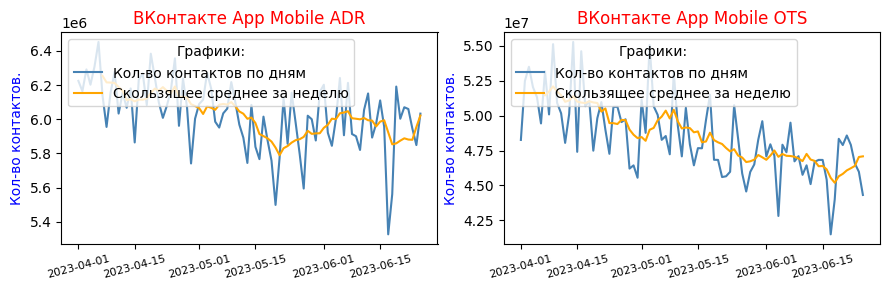

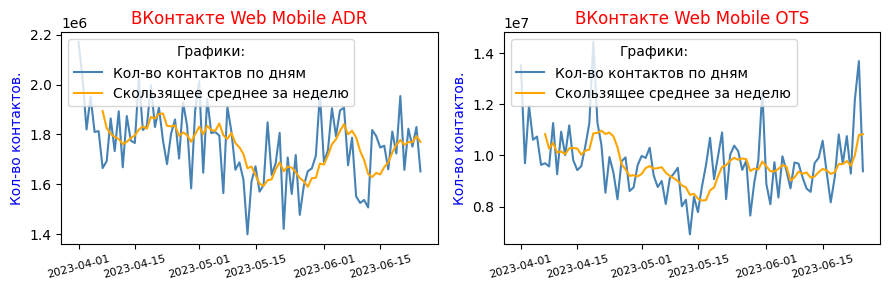

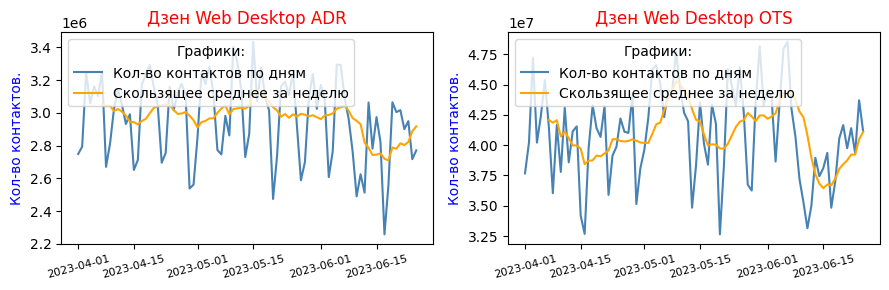

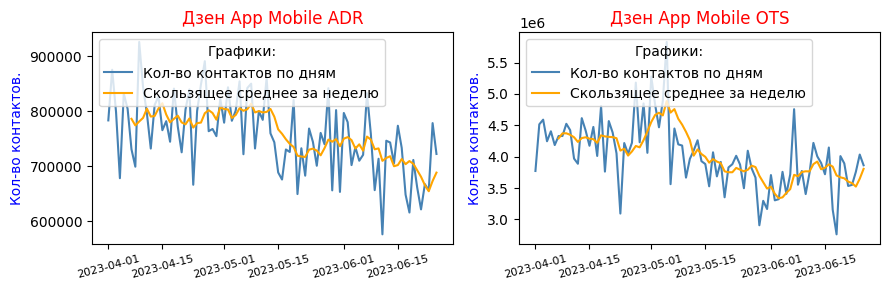

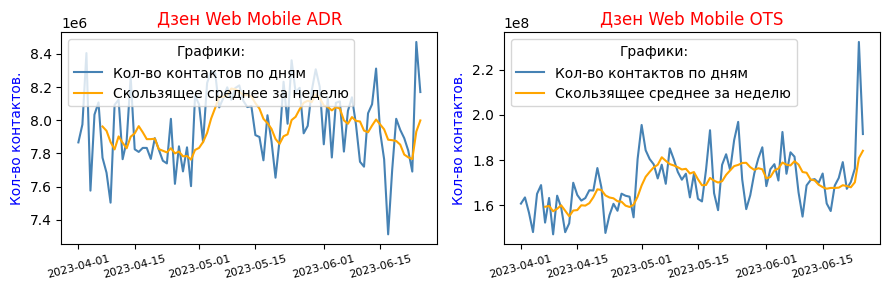

In [71]:
visual_stationarity_6(df_dro_55, list_features)

**Отмечаем**:
* возможное присутствие отрицательного тренда у *ВКонтакте Web Desktop* и положительного тренда замечено только у *Telegram App Mobile* и *Дзен Web Mobile*;
* для остальных источников данных тренд не замечен.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%)

In [72]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dro_55, list_features)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Telegram Web Desktop ADR,-7.294,0.000,-3.510,-2.896,Стационарен.
1,Telegram Web Desktop OTS,-3.351,0.013,-3.513,-2.897,Стационарен.
2,Telegram App Mobile ADR,-3.341,0.013,-3.517,-2.899,Стационарен.
3,Telegram App Mobile OTS,-3.265,0.017,-3.522,-2.901,Стационарен.
4,Telegram Web Mobile ADR,-4.278,0.000,-3.512,-2.897,Стационарен.
5,Telegram Web Mobile OTS,-5.297,0.000,-3.513,-2.897,Стационарен.
6,ВКонтакте Web Desktop ADR,-1.260,0.647,-3.518,-2.900,НЕ стационарен!
7,ВКонтакте Web Desktop OTS,-5.516,0.000,-3.510,-2.896,Стационарен.
8,ВКонтакте App Mobile ADR,-2.126,0.234,-3.516,-2.899,НЕ стационарен!
9,ВКонтакте App Mobile OTS,-1.587,0.490,-3.516,-2.899,НЕ стационарен!


**Промежуточные выводы** для всех источников **'Telegram', 'ВКонтакте', 'Дзен'** по возрастной группе **от 55 лет**:
* Люди предпочитают пользоваться *Telegram App Mobile*, *ВКонтакте App Mobile* и *Дзен Web Mobile ADR* и совсем редко пользуются *Web Desktop* (ПК и ноутбуки).
* **Люди в возрасте 'от 55 лет' применяют ПК и ноутбуки очень активно для поисков в *ВКонтакте Web Desktop OTS*., также, как и ранее, люди в возрасте 'от 45 до 55 лет'.**
* Присутствие периодичности длительностью около 1 недели. Аналогично ведут себя все более младшие люди.
* Наличие аномального значения не выявлено!
* Практически для всех источников информации в группе от 55 лет наблюдается та же самая  картина, как и у более младших людей! В выходные дня количество человек в социальной группе, и количество загрузок приложений медиа объекта резко уменьшается. И дети активно обращаются к Telegram, ВКонтакте и Дзен в рабочие дни.
* Тест проверку стационарности предполагает тренд в источниках по возрастной категории 'от 55 лет':
    * *ВКонтакте Web Desktop ADR*;
    * *ВКонтакте App Mobile ADR*;
    * *ВКонтакте App Mobile OTS*;
    * *Дзен Web Desktop ADR*,
    * *Дзен App Mobile ADR*;   
    * *Дзен App Mobile OTSS*.   
    Для всех этих источников *нулевая гиротеза* не опровергнута.   
    Для остальных источников *нулевая гипотеза* опровергнута и принята альтернативная гипотеза об отсутствии тренда.

In [73]:
# уберем из памяти ненужный более датафрейм.
del df_dro_55

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>5. Итоговые выводы.</h1> 
<hr style='border:2px solid #460073'> </hr>

**По результатам исследования можно отметить следующие факты и сделать приводимые ниже выводы:**
    
1. Для проведения исследования получены данные, накопленные в период 2023-04-01 по 2023-06-25.
2. В файле `Daily_Reach_OTS_total` находятся примерно 516 записей и 152 признака.  
3. Все данные разбиты на возрастные группы:
    * до 12 лет,
    * 12 - 24 года,
    * 25 - 34 года,
    * 35 - 44 года,
    * 45 - 54 года,
    * от 55 и старше.
4. Провёл первичную обработку данных.
5. В связи с большим количеством источников информации (25, создающих 150 признаков) аудитории диджитал-ресурсов среди населения России и с связи с демонстрационой целью данной работы, **ограничился ТРЕМЯ ресурсами: 'Telegram', 'ВКонтакте', 'Дзен'**. Остальные признаки удалил. 
6. Согласно задания на проект:
    * провёл EDA анализ;
    * **для всех возрастных групп по отдельности**:
    изучил наличие трендов и периодичности как визуально, так и применяя метод **Дики-Фуллера (Dickey-Fuller test)** для оценки стационарности временных рядов.
7. Отметил следующие закономерности:
    * Люди до 34 лет предпочитают пользоваться *App Mobile* (Мобильное приложение), *Web Mobile* (Мобильный браузер) и совсем не пользуются *Web Desktop* (ПК и ноутбуки).
    * Люди начиная 'с 35 до 44 лет' уже немного используют *Web Desktop* (ПК и ноутбуки).
    * Люди после 45 лет используют *Web Desktop* (ПК и ноутбуки) также активно, как и все другие устройстваю
8. Наличие периодичности длительностью около 1 недели характерно для людей всех возрастных групп. Все люди реже пользуются диджитал-ресурсами в выходные дни и активно обращаются к *Telegram*, *ВКонтакте* и *Дзен* в рабочие дни.
9. Тест Дики-Фуллера на проверку стационарности временного ряда позволили выявить следующие закономерности:
    * Для людей в возрасте до 45 лет отмечен положительный тренд по ресурсу *Telegram*.
    * Для пользователей всех возрастных групп характерен отрицательный тренд по работе с *ВКонтавкте*.
    * Замечен отрицательный тренд для пользователей *Дзен* в возрастной категории 45-55 лет и страрше 55 лет.  
10. Для более детального анализа стоит провести более глубокий анализ по ВСЕМ источникам информации и сравнить их для различных возрастных групп пользователей.